In [1]:
from multi_imbalance.datasets import load_datasets
import experiment_v2 as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

In [2]:
datasets = load_datasets()

In [3]:
ds_name = 'thyroid-newthyroid'
test_on_all_folds = True
test_all_ds = True

In [4]:
datasets = ex.one_hot_encode_all(datasets)

In [5]:
config = ex.config_calculation_strategy2(datasets)

In [6]:
config = ex.config_tuned_for_knn(config)

In [7]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 130},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 4},
  'weighted_triplet_loss': True,
  'lr': 0.04,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 90},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.004,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 120},
 'balance-scale': {'nn_config': {'uni

In [8]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1),
            "QDA": QuadraticDiscriminantAnalysis(),
            "LDA": LinearDiscriminantAnalysis()
        } 
    return classifiers

In [9]:
from experiment import dt_name_to_cols_to_encode, dt_name_minority_classes


In [10]:
from sklearn.neighbors import KNeighborsClassifier

def calc_safety5(X,y):
    result = {
        "safe":0,
        "borderline":0,
        "rare":0,
        "outlier":0
    }
    neigh = KNeighborsClassifier(n_neighbors=5)
    neigh.fit(X, y)
    neighbors = neigh.kneighbors(X, 5+1, False)
    for i, (x, nbors) in enumerate(list(zip(X, neighbors))):
#         print(x)
#         print(y[i])
#         print(nbors[1:])
#         print(y[nbors[1:]])
        same_class_nbrs = (y[nbors[1:]] == y[i]).sum()
        if same_class_nbrs >= 4:
            result['safe'] += 1
        elif same_class_nbrs >= 2:
            result['borderline'] += 1
        elif same_class_nbrs == 1:
            result['rare'] += 1
        else:
            result['outlier'] += 1
    return result

In [11]:
def standardize(X_train, X_test):
    means = X_train.mean(axis=0)
    stds = X_train.std(axis=0)
    return (X_train - means) / (stds+1e-6), (X_test - means) / (stds + 1e-6)

cmc


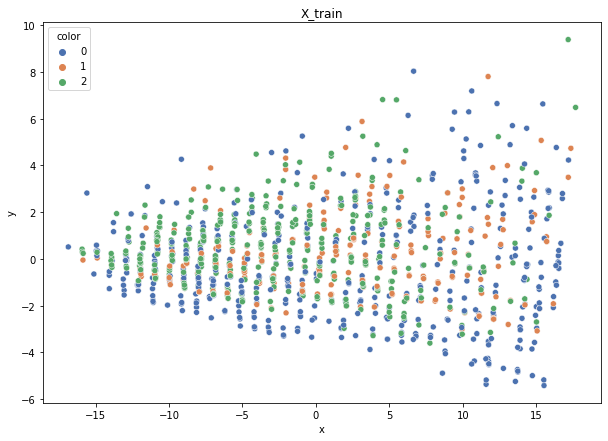

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


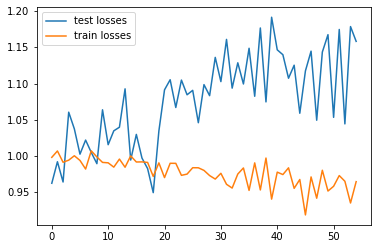

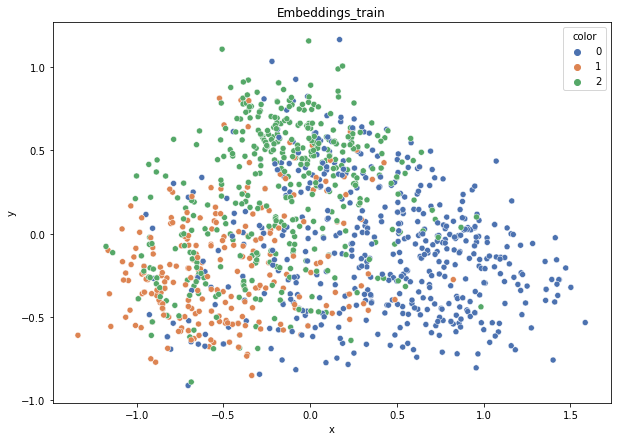

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.45
DT-f1-old+new-features: 0.461
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.457
DT-gmean-old+new-features: 0.473
DT-gmean-old-features: 0.467
DT-minority_gmean-new-features: 0.008
DT-minority_gmean-old+new-features: 0.008
DT-minority_gmean-old-features: 0.007
KNN-f1-new-features: 0.458
KNN-f1-old+new-features: 0.43
KNN-f1-old-features: 0.431
KNN-gmean-new-features: 0.456
KNN-gmean-old+new-features: 0.429
KNN-gmean-old-features: 0.425
KNN-minority_gmean-new-features: 0.007
KNN-minority_gmean-old+new-features: 0.007
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.539
LDA-f1-old+new-features: 0.524
LDA-f1-old-features: 0.482
LDA-gmean-new-features: 0.547
LDA-gmean-old+new-features: 0.53
LDA-gmean-old-features: 0.47
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.008
LDA-minority_gmean-old-features: 0.007
QDA-f1-new-features: 0.521
QDA-f1-old+new-features: 0.491
QDA-f1-old-features: 0.483
QDA-gmean-new-features: 0.53

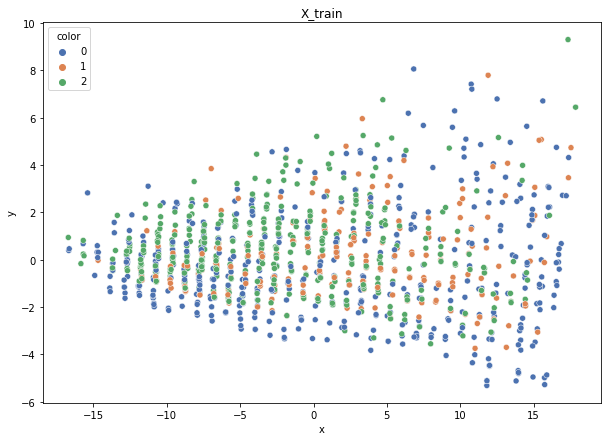

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


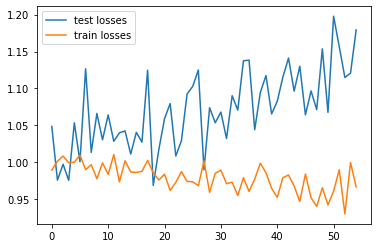

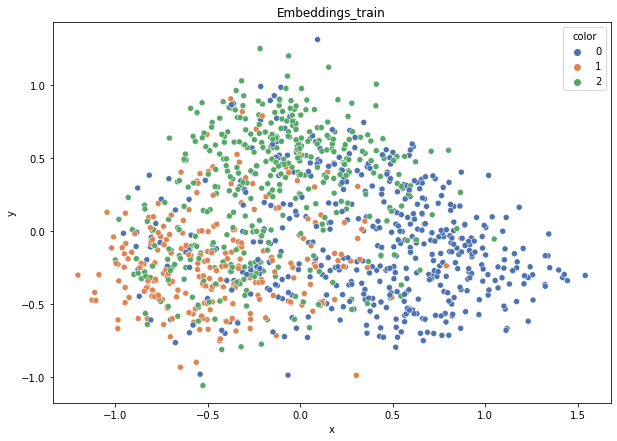

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.464
DT-f1-old+new-features: 0.494
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.468
DT-gmean-old+new-features: 0.497
DT-gmean-old-features: 0.503
DT-minority_gmean-new-features: 0.008
DT-minority_gmean-old+new-features: 0.008
DT-minority_gmean-old-features: 0.008
KNN-f1-new-features: 0.468
KNN-f1-old+new-features: 0.438
KNN-f1-old-features: 0.443
KNN-gmean-new-features: 0.466
KNN-gmean-old+new-features: 0.43
KNN-gmean-old-features: 0.433
KNN-minority_gmean-new-features: 0.008
KNN-minority_gmean-old+new-features: 0.007
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.522
LDA-f1-old+new-features: 0.524
LDA-f1-old-features: 0.501
LDA-gmean-new-features: 0.522
LDA-gmean-old+new-features: 0.522
LDA-gmean-old-features: 0.49
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.008
LDA-minority_gmean-old-features: 0.007
QDA-f1-new-features: 0.544
QDA-f1-old+new-features: 0.554
QDA-f1-old-features: 0.513
QDA-gmean-new-features: 0.

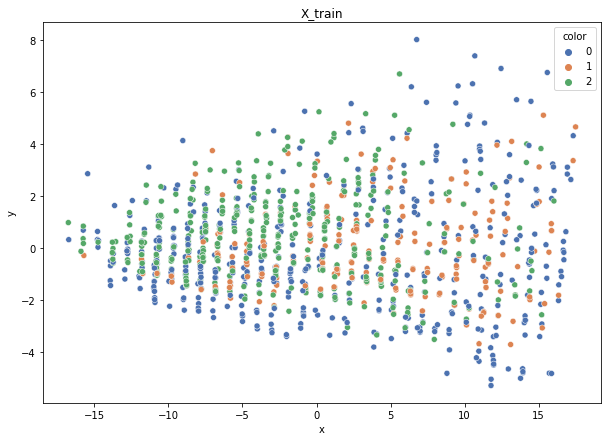

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


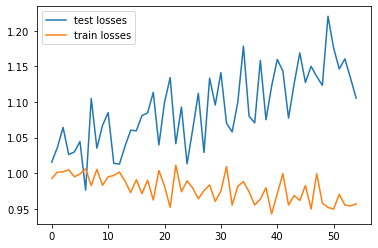

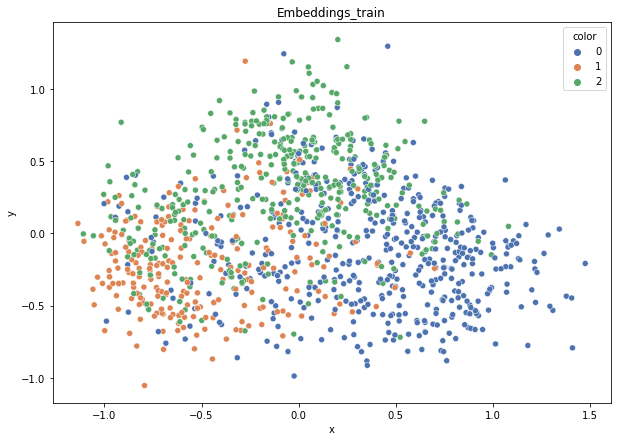

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.452
DT-f1-old+new-features: 0.468
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.443
DT-gmean-old+new-features: 0.465
DT-gmean-old-features: 0.46
DT-minority_gmean-new-features: 0.007
DT-minority_gmean-old+new-features: 0.007
DT-minority_gmean-old-features: 0.007
KNN-f1-new-features: 0.448
KNN-f1-old+new-features: 0.417
KNN-f1-old-features: 0.413
KNN-gmean-new-features: 0.443
KNN-gmean-old+new-features: 0.402
KNN-gmean-old-features: 0.399
KNN-minority_gmean-new-features: 0.007
KNN-minority_gmean-old+new-features: 0.007
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.515
LDA-f1-old+new-features: 0.518
LDA-f1-old-features: 0.447
LDA-gmean-new-features: 0.507
LDA-gmean-old+new-features: 0.513
LDA-gmean-old-features: 0.425
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.008
LDA-minority_gmean-old-features: 0.007
QDA-f1-new-features: 0.492
QDA-f1-old+new-features: 0.5
QDA-f1-old-features: 0.486
QDA-gmean-new-features: 0.4

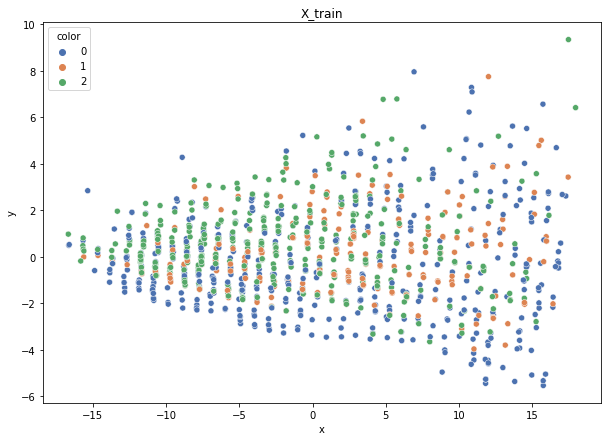

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


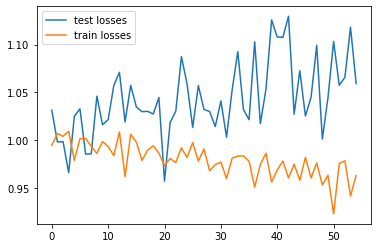

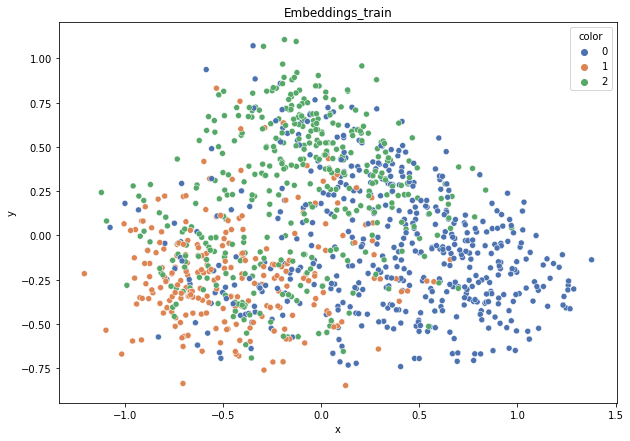

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.457
DT-f1-old+new-features: 0.432
DT-f1-old-features: 0.44
DT-gmean-new-features: 0.453
DT-gmean-old+new-features: 0.428
DT-gmean-old-features: 0.438
DT-minority_gmean-new-features: 0.007
DT-minority_gmean-old+new-features: 0.007
DT-minority_gmean-old-features: 0.007
KNN-f1-new-features: 0.449
KNN-f1-old+new-features: 0.431
KNN-f1-old-features: 0.418
KNN-gmean-new-features: 0.439
KNN-gmean-old+new-features: 0.425
KNN-gmean-old-features: 0.413
KNN-minority_gmean-new-features: 0.007
KNN-minority_gmean-old+new-features: 0.007
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.538
LDA-f1-old+new-features: 0.526
LDA-f1-old-features: 0.485
LDA-gmean-new-features: 0.523
LDA-gmean-old+new-features: 0.512
LDA-gmean-old-features: 0.451
LDA-minority_gmean-new-features: 0.007
LDA-minority_gmean-old+new-features: 0.007
LDA-minority_gmean-old-features: 0.006
QDA-f1-new-features: 0.525
QDA-f1-old+new-features: 0.513
QDA-f1-old-features: 0.516
QDA-gmean-new-features: 0

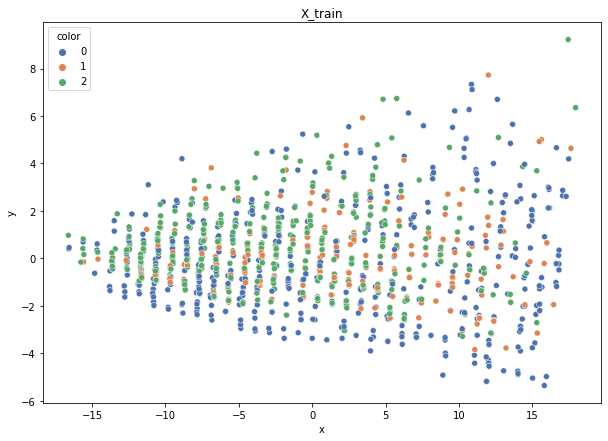

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


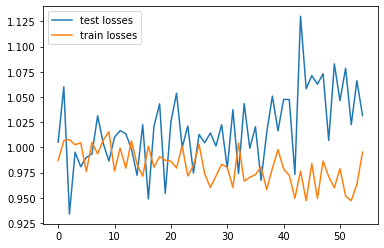

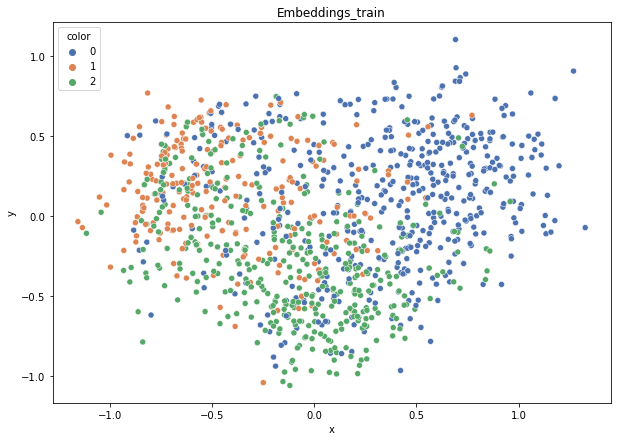

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.497
DT-f1-old+new-features: 0.46
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.495
DT-gmean-old+new-features: 0.458
DT-gmean-old-features: 0.483
DT-minority_gmean-new-features: 0.007
DT-minority_gmean-old+new-features: 0.007
DT-minority_gmean-old-features: 0.008
KNN-f1-new-features: 0.45
KNN-f1-old+new-features: 0.413
KNN-f1-old-features: 0.408
KNN-gmean-new-features: 0.438
KNN-gmean-old+new-features: 0.398
KNN-gmean-old-features: 0.394
KNN-minority_gmean-new-features: 0.007
KNN-minority_gmean-old+new-features: 0.007
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.54
LDA-f1-old+new-features: 0.522
LDA-f1-old-features: 0.527
LDA-gmean-new-features: 0.537
LDA-gmean-old+new-features: 0.513
LDA-gmean-old-features: 0.509
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.007
LDA-minority_gmean-old-features: 0.007
QDA-f1-new-features: 0.533
QDA-f1-old+new-features: 0.498
QDA-f1-old-features: 0.542
QDA-gmean-new-features: 0.5

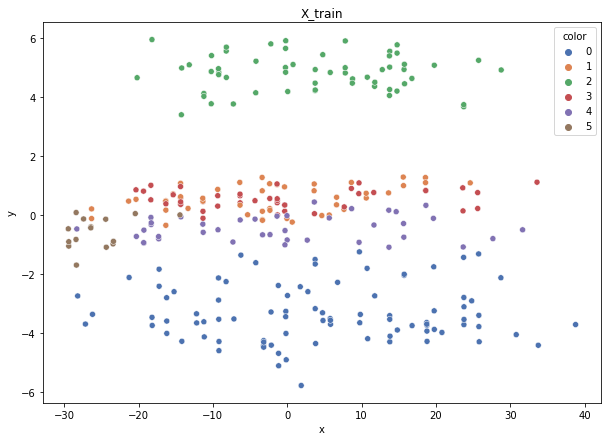

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


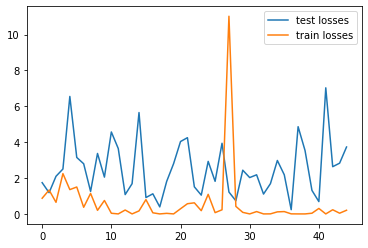

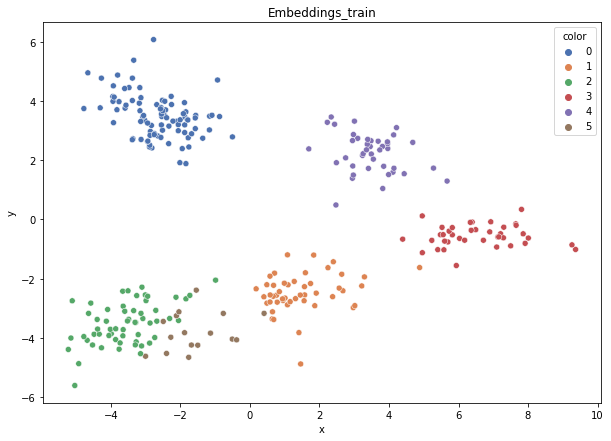

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.963
DT-f1-old+new-features: 0.963
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.957
DT-gmean-old+new-features: 0.957
DT-gmean-old-features: 0.911
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.99
KNN-f1-old+new-features: 0.974
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.987
KNN-gmean-old+new-features: 0.973
KNN-gmean-old-features: 0.941
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.974
LDA-f1-old+new-features: 0.974
LDA-f1-old-features: 0.943
LDA-gmean-new-features: 0.973
LDA-gmean-old+new-features: 0.973
LDA-gmean-old-features: 0.942
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 0.99
QDA-f1-old+new-features: 0.871
QDA-f1-old-features: 0.749
QDA-gmean-new-features: 0.987
QDA-gmean-old+

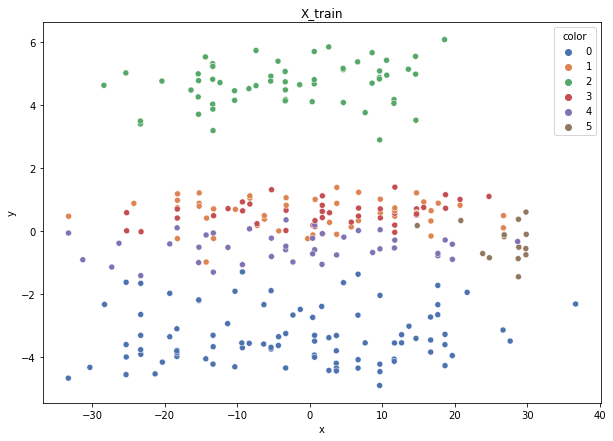

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


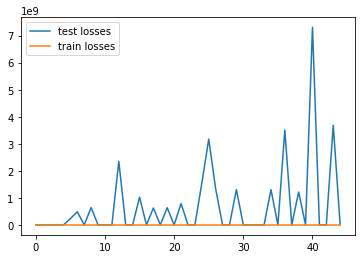

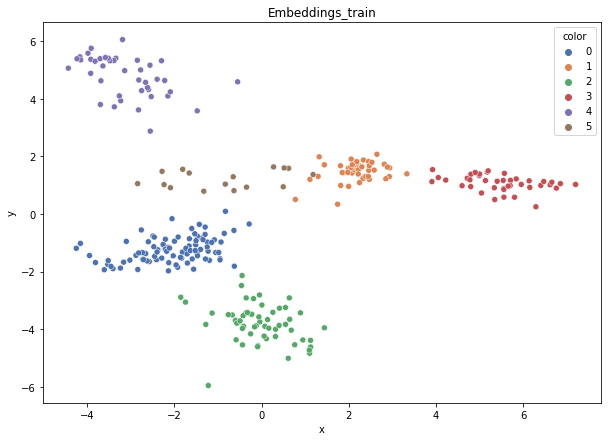

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.935
DT-f1-old+new-features: 0.922
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.93
DT-gmean-old+new-features: 0.919
DT-gmean-old-features: 0.955
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.924
KNN-f1-old+new-features: 0.939
KNN-f1-old-features: 0.952
KNN-gmean-new-features: 0.919
KNN-gmean-old+new-features: 0.94
KNN-gmean-old-features: 0.951
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.913
LDA-f1-old+new-features: 0.91
LDA-f1-old-features: 0.968
LDA-gmean-new-features: 0.919
LDA-gmean-old+new-features: 0.919
LDA-gmean-old-features: 0.97
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 0.922
QDA-f1-old+new-features: 0.807
QDA-f1-old-features: 0.786
QDA-gmean-new-features: 0.914
QDA-gmean-old+ne

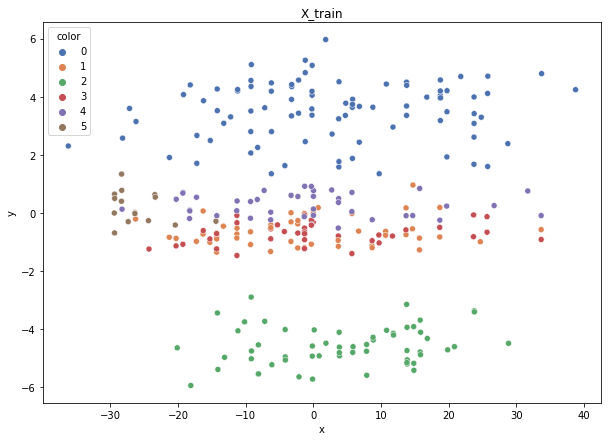

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


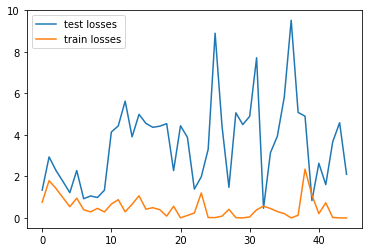

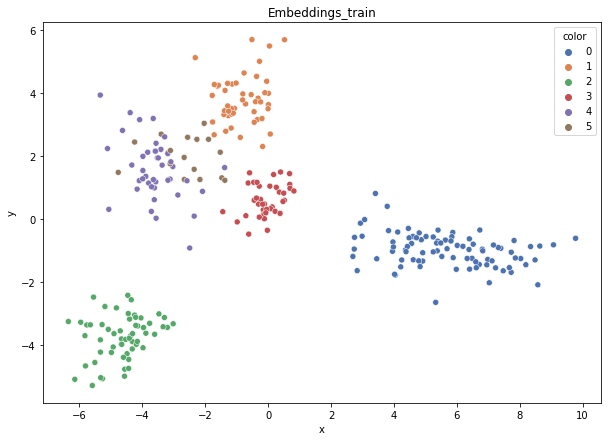

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3

DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.926
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.898
DT-gmean-old+new-features: 0.929
DT-gmean-old-features: 0.953
DT-minority_gmean-new-features: 0.027
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.963
KNN-gmean-old+new-features: 0.963
KNN-gmean-old-features: 0.891
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.941
LDA-f1-old+new-features: 0.939
LDA-f1-old-features: 0.922
LDA-gmean-new-features: 0.918
LDA-gmean-old+new-features: 0.918
LDA-gmean-old-features: 0.913
LDA-minority_gmean-new-features: 0.027
LDA-minority_gmean-old+new-features: 0.027
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 0.931
QDA-f1-old+new-features: 0.896
QDA-f1-old-features: 0.865
QDA-gmean-new-features: 0.905
QDA-gm

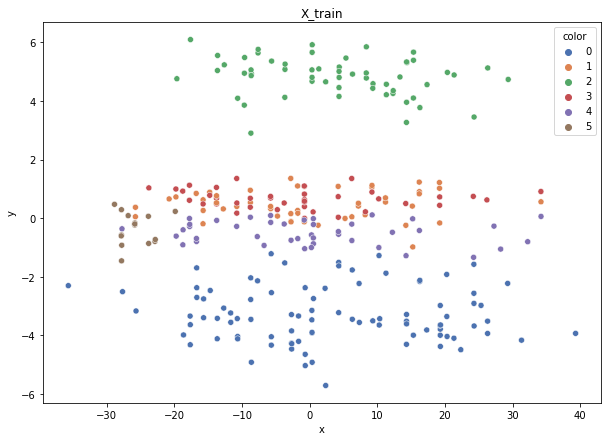

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


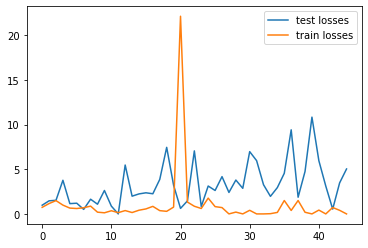

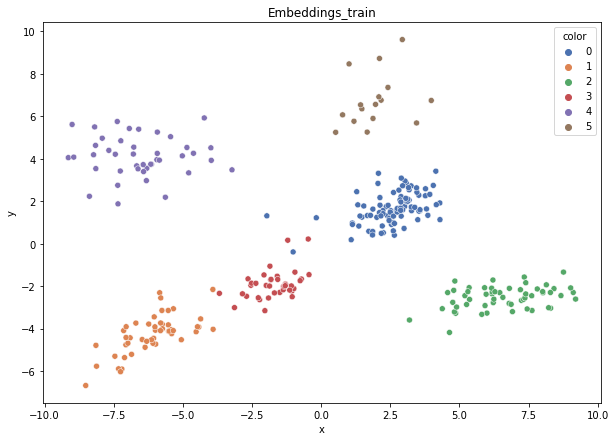

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.935
DT-f1-old+new-features: 0.958
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.942
DT-gmean-old+new-features: 0.95
DT-gmean-old-features: 0.945
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.968
KNN-gmean-old+new-features: 0.968
KNN-gmean-old-features: 0.937
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.985
LDA-f1-old+new-features: 0.985
LDA-f1-old-features: 0.969
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.968
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 0.969
QDA-f1-old+new-features: 0.742
QDA-f1-old-features: 0.652
QDA-gmean-new-features: 0.963
QDA-gmean-old

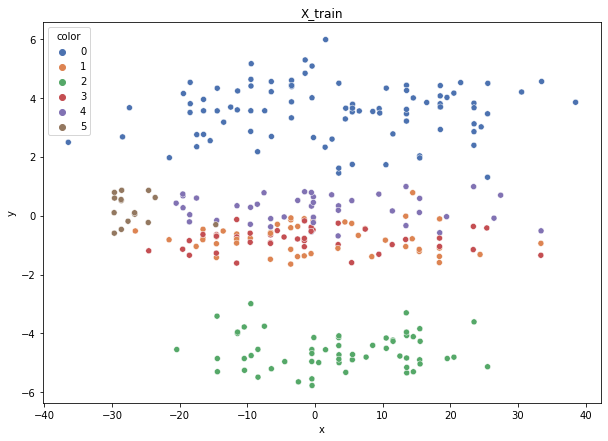

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


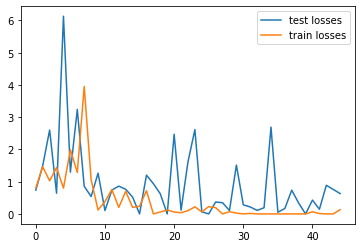

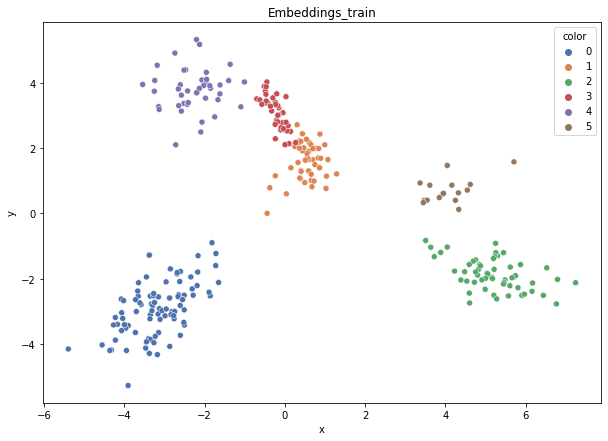

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.928
DT-f1-old+new-features: 0.952
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.942
DT-gmean-old+new-features: 0.967
DT-gmean-old-features: 0.992
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.985
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.983
KNN-gmean-old-features: 0.942
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.989
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.992
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 0.931
QDA-f1-old-features: 0.835
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 

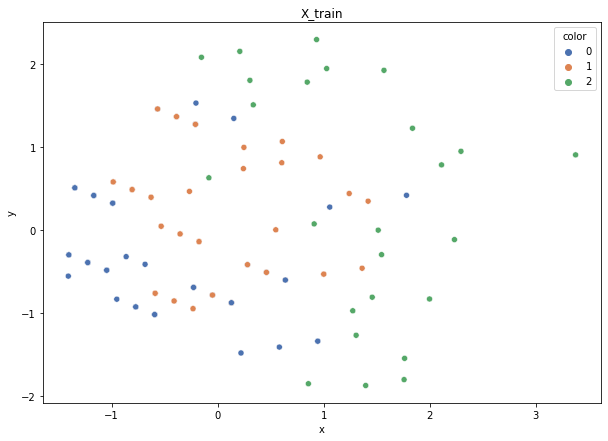

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


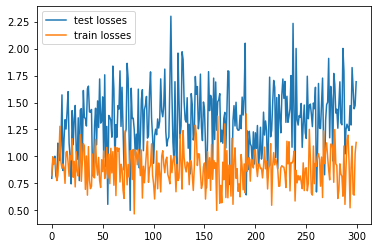

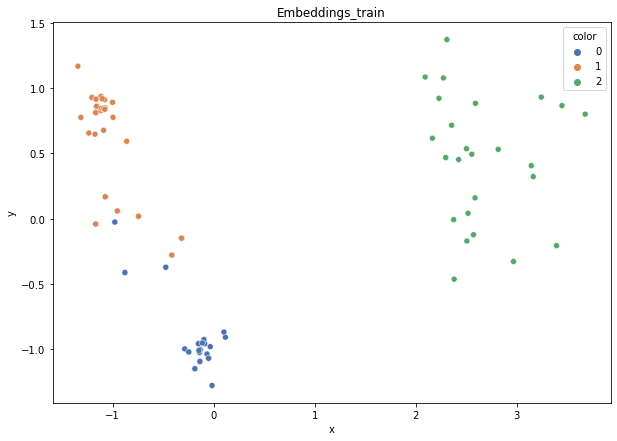

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.867
DT-f1-old+new-features: 0.867
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.828
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.733
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.688
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.022
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.549
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.026
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.923
QDA-f1-old-features: 0.58
QDA-gmean-new-features: 0.921
QDA-gmean-

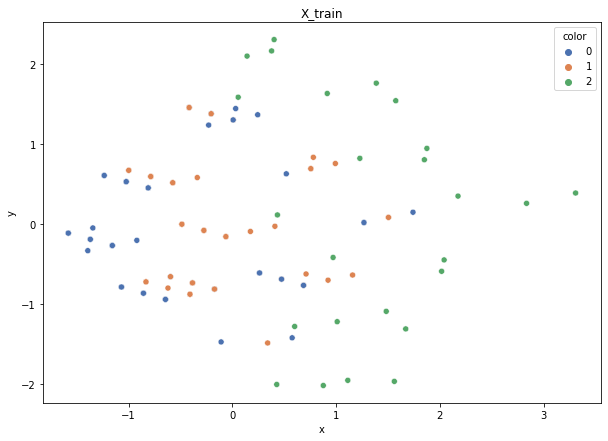

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


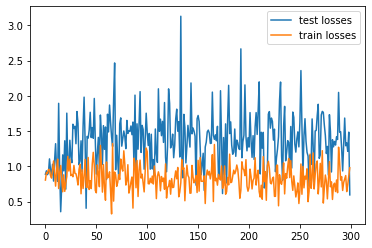

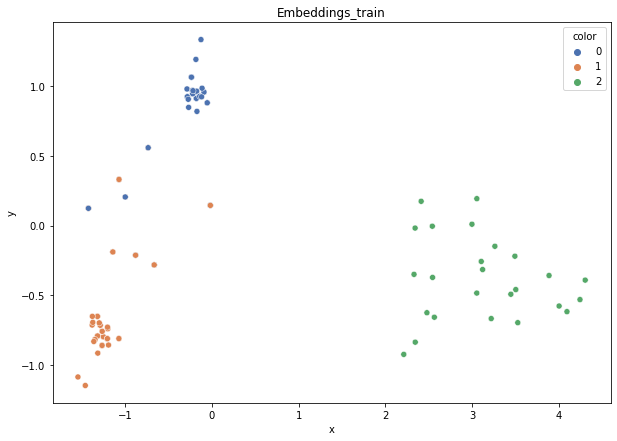

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.87
KNN-f1-old-features: 0.643
KNN-gmean-new-features: 0.892
KNN-gmean-old+new-features: 0.861
KNN-gmean-old-features: 0.619
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.008
LDA-f1-new-features: 0.845
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.439
LDA-gmean-new-features: 0.837
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.414
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.018
QDA-f1-new-features: 0.872
QDA-f1-old+new-features: 0.872
QDA-f1-old-features: 0.54
QDA-gmean-new-features: 0.867
QDA-gmean-

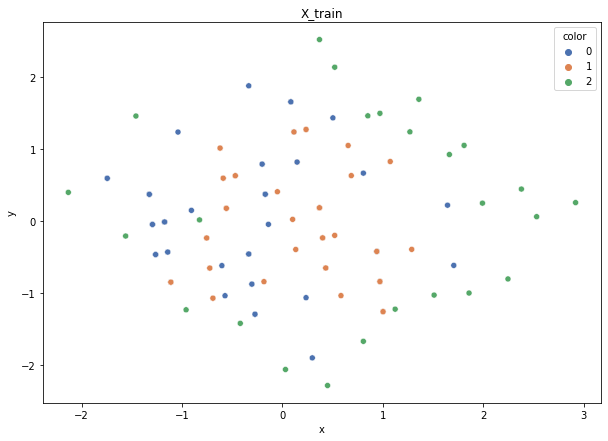

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


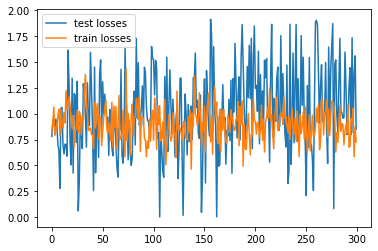

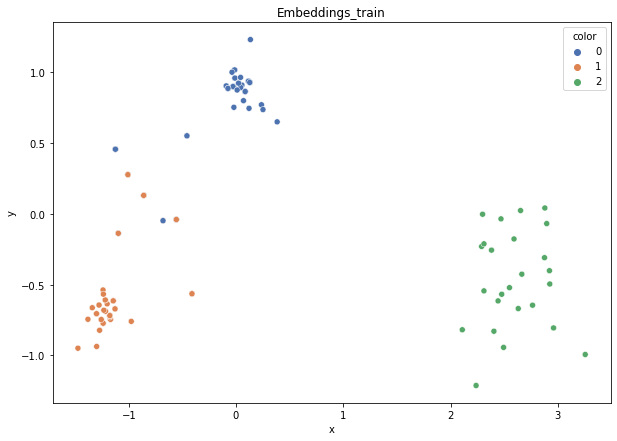

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.882
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.921
DT-gmean-old+new-features: 0.867
DT-gmean-old-features: 0.921
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 0.029
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.836
KNN-gmean-new-features: 0.921
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.805
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.026
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.565
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.474
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 1.0
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.923
QDA-f1-old-features: 0.666
QDA-gmean-new-features: 0.921
QDA-gmea

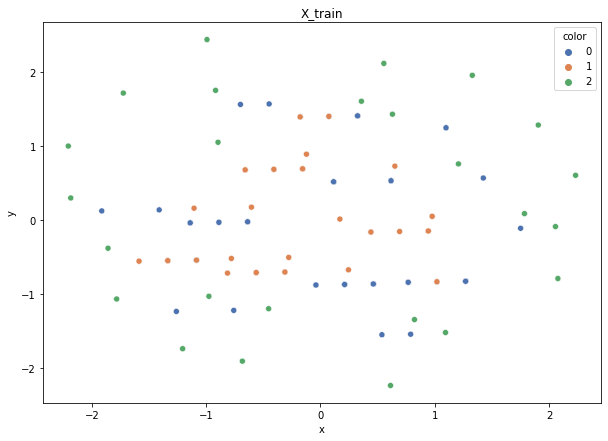

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


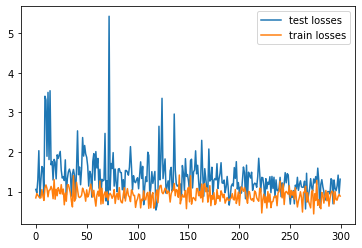

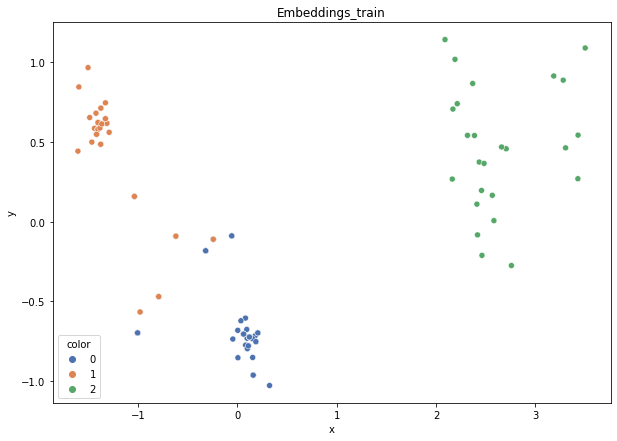

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


DT-f1-new-features: 0.831
DT-f1-old+new-features: 0.831
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.84
DT-gmean-old+new-features: 0.84
DT-gmean-old-features: 0.892
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.897
KNN-f1-old+new-features: 0.872
KNN-f1-old-features: 0.594
KNN-gmean-new-features: 0.895
KNN-gmean-old+new-features: 0.867
KNN-gmean-old-features: 0.54
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.007
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.615
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.605
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.029
QDA-f1-new-features: 0.897
QDA-f1-old+new-features: 0.897
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.895
QDA-gmean-o

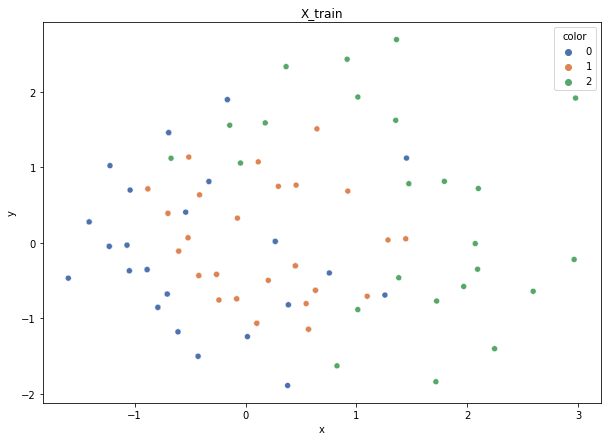

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


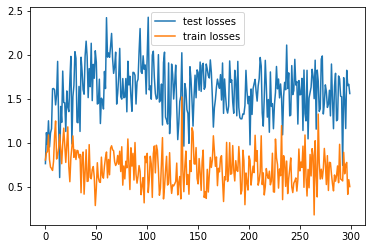

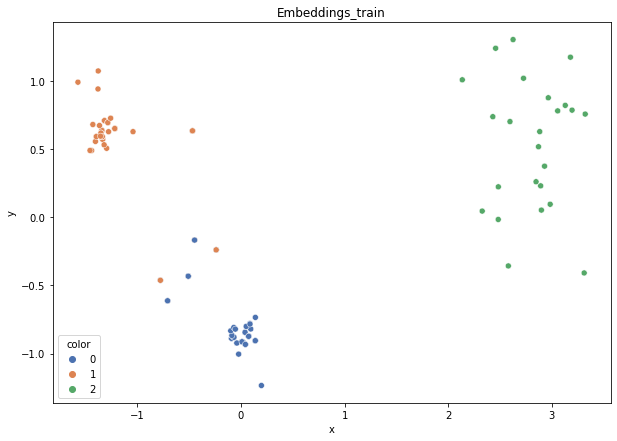

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.752
DT-f1-old+new-features: 0.778
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.734
DT-gmean-old+new-features: 0.76
DT-gmean-old-features: 0.684
DT-minority_gmean-new-features: 0.029
DT-minority_gmean-old+new-features: 0.029
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.813
KNN-f1-old+new-features: 0.786
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.804
KNN-gmean-old+new-features: 0.773
KNN-gmean-old-features: 0.529
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.008
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.607
LDA-gmean-new-features: 0.773
LDA-gmean-old+new-features: 0.773
LDA-gmean-old-features: 0.591
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.027
QDA-f1-new-features: 0.786
QDA-f1-old+new-features: 0.786
QDA-f1-old-features: 0.663
QDA-gmean-new-features: 0.773
QDA-g

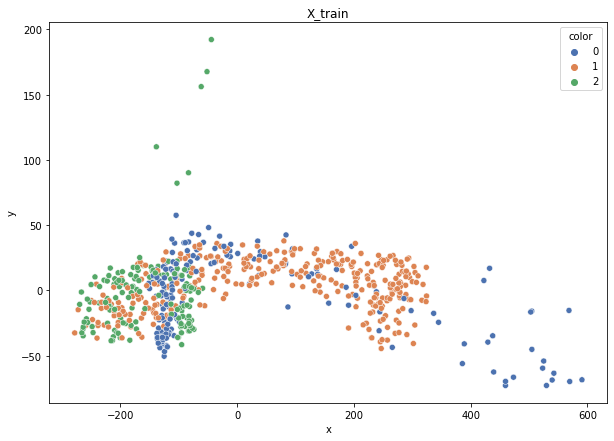

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


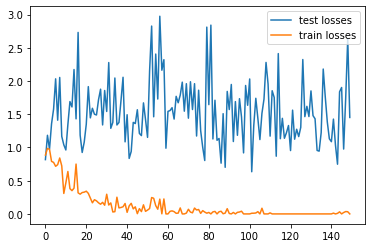

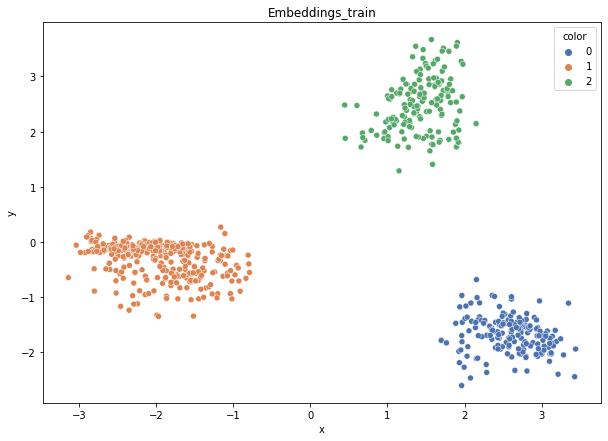

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.953
DT-f1-old+new-features: 0.953
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.943
DT-gmean-old+new-features: 0.943
DT-gmean-old-features: 0.908
DT-minority_gmean-new-features: 0.094
DT-minority_gmean-old+new-features: 0.094
DT-minority_gmean-old-features: 0.094
KNN-f1-new-features: 0.952
KNN-f1-old+new-features: 0.952
KNN-f1-old-features: 0.889
KNN-gmean-new-features: 0.953
KNN-gmean-old+new-features: 0.953
KNN-gmean-old-features: 0.895
KNN-minority_gmean-new-features: 0.096
KNN-minority_gmean-old+new-features: 0.096
KNN-minority_gmean-old-features: 0.093
LDA-f1-new-features: 0.958
LDA-f1-old+new-features: 0.958
LDA-f1-old-features: 0.907
LDA-gmean-new-features: 0.956
LDA-gmean-old+new-features: 0.956
LDA-gmean-old-features: 0.921
LDA-minority_gmean-new-features: 0.096
LDA-minority_gmean-old+new-features: 0.096
LDA-minority_gmean-old-features: 0.096
QDA-f1-new-features: 0.958
QDA-f1-old+new-features: 0.966
QDA-f1-old-features: 0.932
QDA-gmean-new-features: 

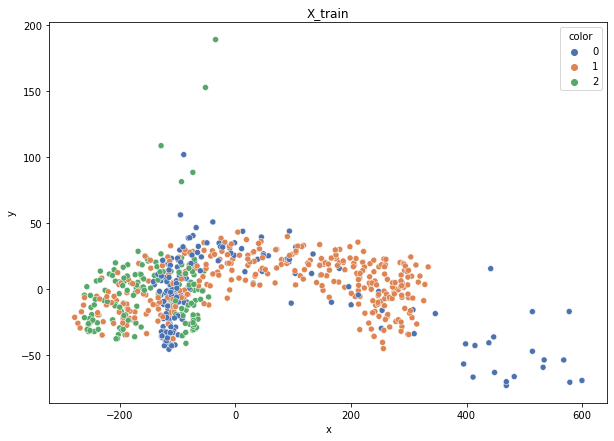

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


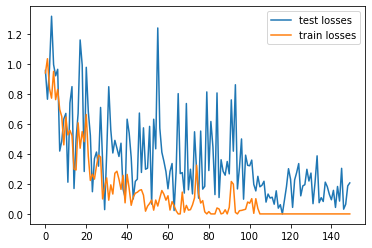

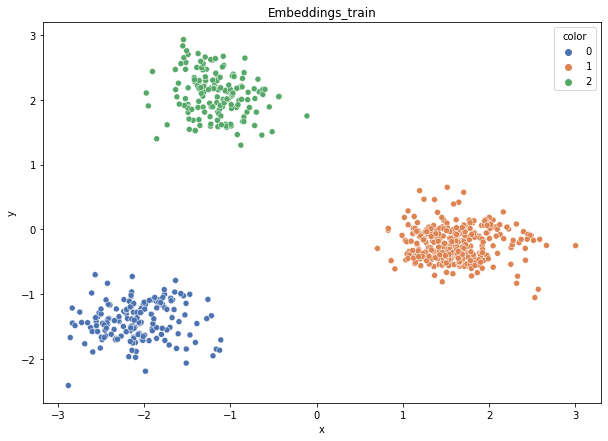

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 1.0
DT-f1-old+new-features: 1.0
DT-f1-old-features: 0.906
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 1.0
DT-gmean-old-features: 0.904
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 0.093
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.9
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.908
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.094
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.94
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.097
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 1.0
QDA-gme

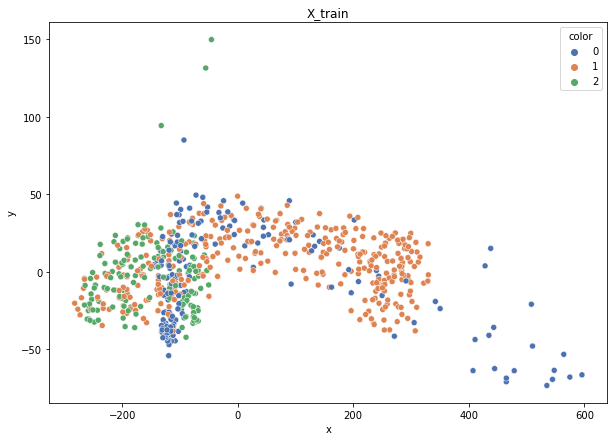

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


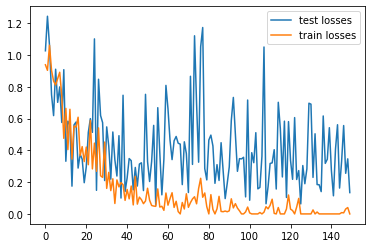

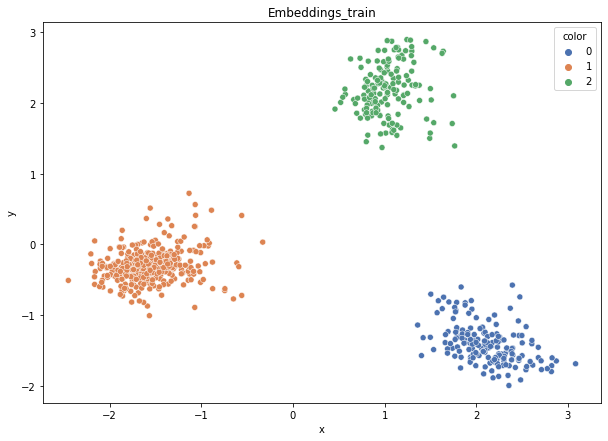

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 1.0
DT-f1-old+new-features: 1.0
DT-f1-old-features: 0.89
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 1.0
DT-gmean-old-features: 0.895
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 0.093
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.899
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.897
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.092
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.965
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.964
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.098
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.976
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 1.0
Q

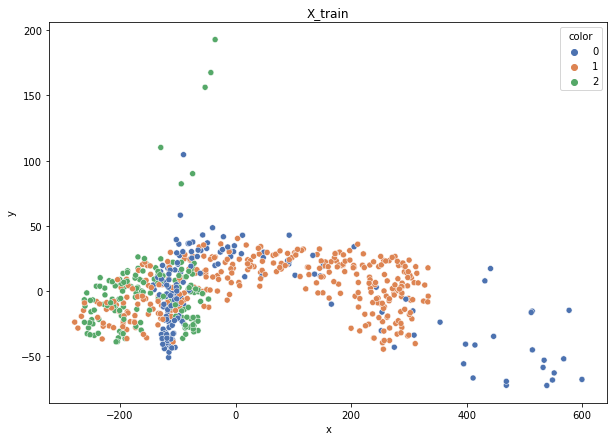

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


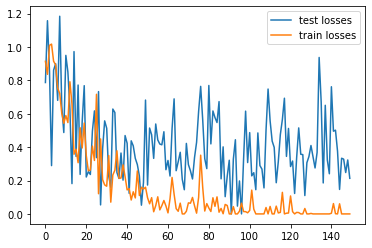

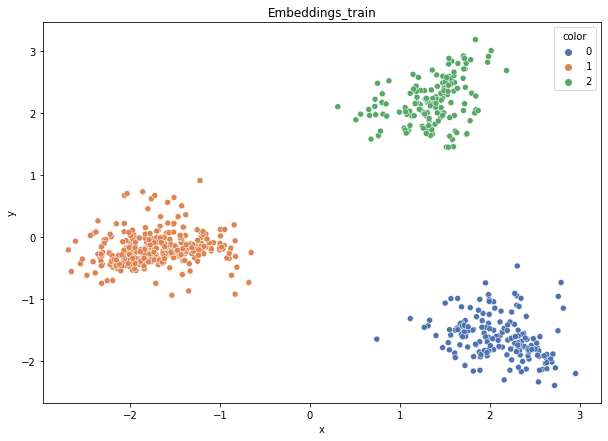

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.988
DT-f1-old+new-features: 0.982
DT-f1-old-features: 0.909
DT-gmean-new-features: 0.992
DT-gmean-old+new-features: 0.981
DT-gmean-old-features: 0.916
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 0.098
DT-minority_gmean-old-features: 0.095
KNN-f1-new-features: 0.994
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.996
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.927
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.093
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.953
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.957
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.098
QDA-f1-new-features: 0.994
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.996
QDA-

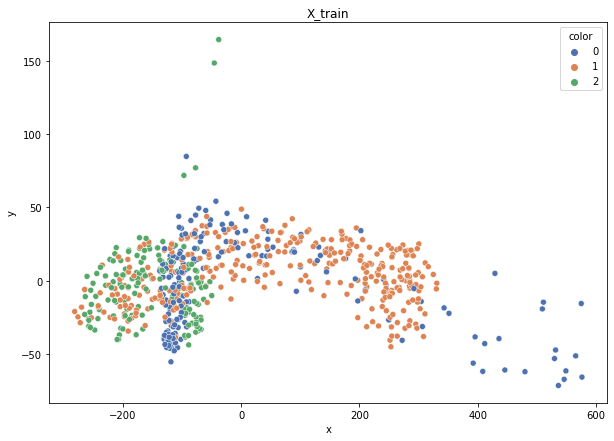

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


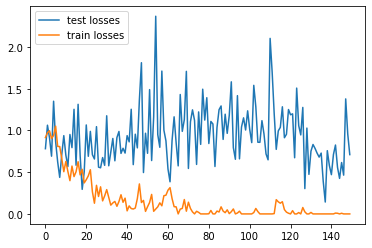

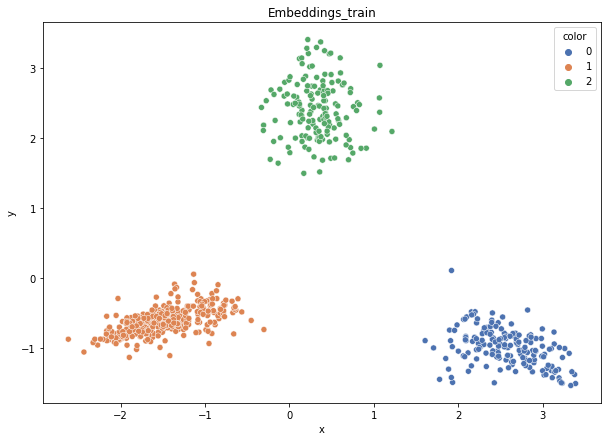

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.984
DT-f1-old+new-features: 0.982
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.985
DT-gmean-old+new-features: 0.976
DT-gmean-old-features: 0.87
DT-minority_gmean-new-features: 0.977
DT-minority_gmean-old+new-features: 0.098
DT-minority_gmean-old-features: 0.09
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.986
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.984
KNN-gmean-old-features: 0.935
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 0.098
KNN-minority_gmean-old-features: 0.094
LDA-f1-new-features: 0.986
LDA-f1-old+new-features: 0.979
LDA-f1-old-features: 0.939
LDA-gmean-new-features: 0.984
LDA-gmean-old+new-features: 0.975
LDA-gmean-old-features: 0.941
LDA-minority_gmean-new-features: 0.098
LDA-minority_gmean-old+new-features: 0.098
LDA-minority_gmean-old-features: 0.096
QDA-f1-new-features: 0.986
QDA-f1-old+new-features: 0.992
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.989
QD

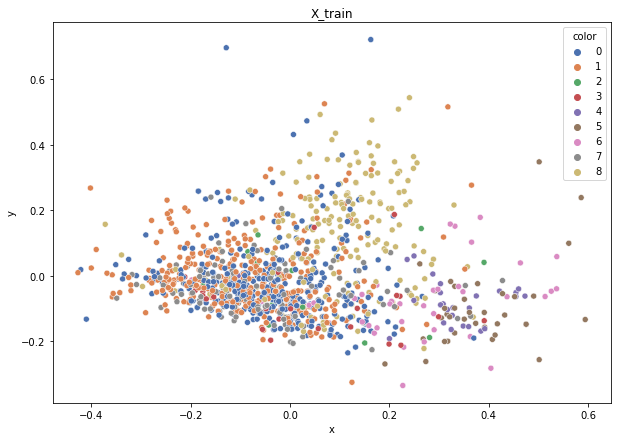

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


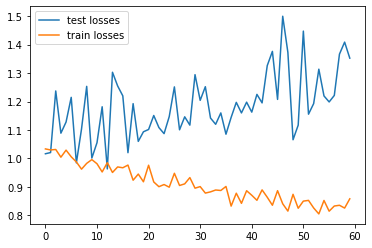

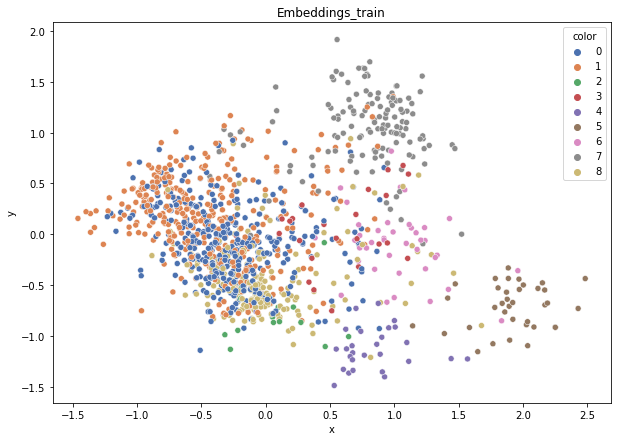

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.512
DT-f1-old+new-features: 0.502
DT-f1-old-features: 0.494
DT-gmean-new-features: 0.287
DT-gmean-old+new-features: 0.28
DT-gmean-old-features: 0.271
DT-minority_gmean-new-features: 0.017
DT-minority_gmean-old+new-features: 0.017
DT-minority_gmean-old-features: 0.016
KNN-f1-new-features: 0.557
KNN-f1-old+new-features: 0.575
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.489
KNN-gmean-old+new-features: 0.516
KNN-gmean-old-features: 0.51
KNN-minority_gmean-new-features: 0.029
KNN-minority_gmean-old+new-features: 0.031
KNN-minority_gmean-old-features: 0.03
LDA-f1-new-features: 0.526
LDA-f1-old+new-features: 0.544
LDA-f1-old-features: 0.564
LDA-gmean-new-features: 0.298
LDA-gmean-old+new-features: 0.3
LDA-gmean-old-features: 0.308
LDA-minority_gmean-new-features: 0.018
LDA-minority_gmean-old+new-features: 0.018
LDA-minority_gmean-old-features: 0.018
QDA-f1-new-features: 0.555
QDA-f1-old+new-features: 0.343
QDA-f1-old-features: 0.171
QDA-gmean-new-features: 0.504

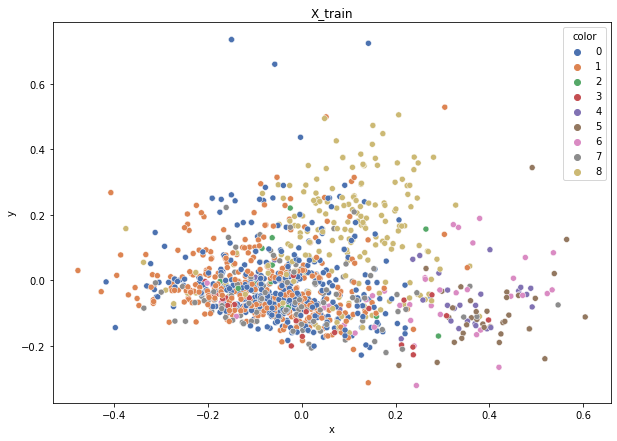

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


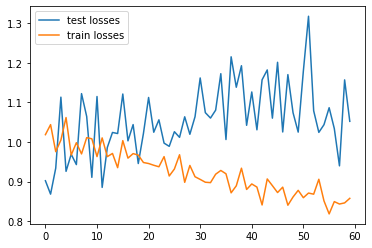

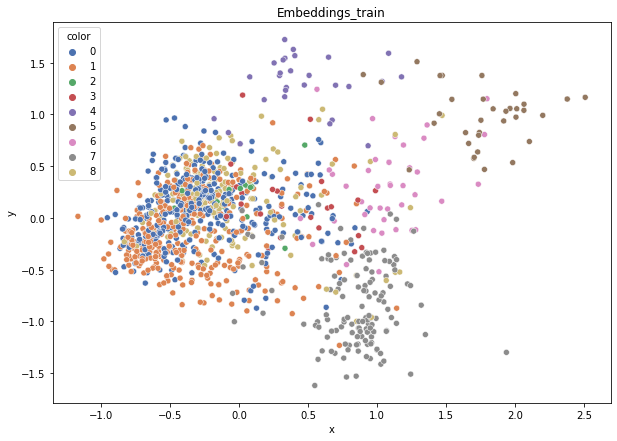

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.438
DT-f1-old+new-features: 0.419
DT-f1-old-features: 0.451
DT-gmean-new-features: 0.242
DT-gmean-old+new-features: 0.228
DT-gmean-old-features: 0.26
DT-minority_gmean-new-features: 0.015
DT-minority_gmean-old+new-features: 0.014
DT-minority_gmean-old-features: 0.016
KNN-f1-new-features: 0.498
KNN-f1-old+new-features: 0.528
KNN-f1-old-features: 0.494
KNN-gmean-new-features: 0.431
KNN-gmean-old+new-features: 0.276
KNN-gmean-old-features: 0.268
KNN-minority_gmean-new-features: 0.026
KNN-minority_gmean-old+new-features: 0.024
KNN-minority_gmean-old-features: 0.023
LDA-f1-new-features: 0.595
LDA-f1-old+new-features: 0.595
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.326
LDA-gmean-old+new-features: 0.319
LDA-gmean-old-features: 0.307
LDA-minority_gmean-new-features: 0.018
LDA-minority_gmean-old+new-features: 0.018
LDA-minority_gmean-old-features: 0.025
QDA-f1-new-features: 0.549
QDA-f1-old+new-features: 0.329
QDA-f1-old-features: 0.1
QDA-gmean-new-features: 0.28

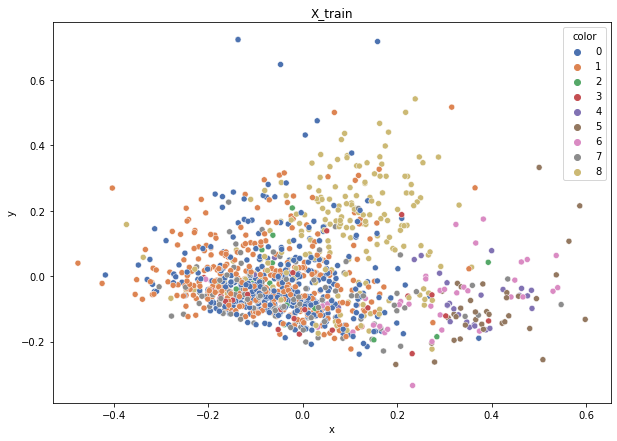

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


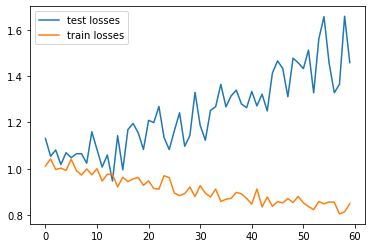

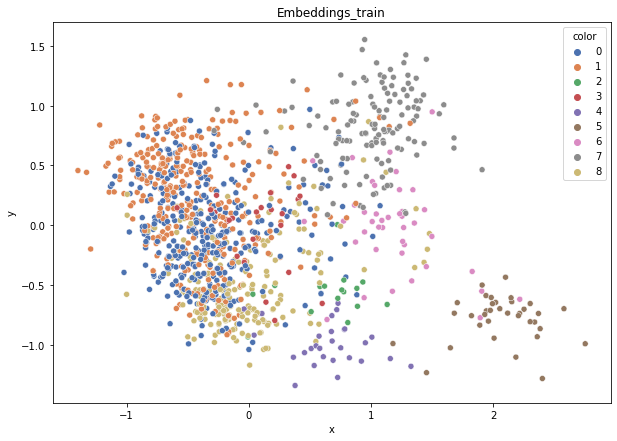

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.395
DT-f1-old+new-features: 0.387
DT-f1-old-features: 0.407
DT-gmean-new-features: 0.336
DT-gmean-old+new-features: 0.193
DT-gmean-old-features: 0.401
DT-minority_gmean-new-features: 0.021
DT-minority_gmean-old+new-features: 0.012
DT-minority_gmean-old-features: 0.026
KNN-f1-new-features: 0.431
KNN-f1-old+new-features: 0.472
KNN-f1-old-features: 0.451
KNN-gmean-new-features: 0.233
KNN-gmean-old+new-features: 0.436
KNN-gmean-old-features: 0.422
KNN-minority_gmean-new-features: 0.015
KNN-minority_gmean-old+new-features: 0.027
KNN-minority_gmean-old-features: 0.026
LDA-f1-new-features: 0.47
LDA-f1-old+new-features: 0.488
LDA-f1-old-features: 0.492
LDA-gmean-new-features: 0.267
LDA-gmean-old+new-features: 0.268
LDA-gmean-old-features: 0.267
LDA-minority_gmean-new-features: 0.016
LDA-minority_gmean-old+new-features: 0.016
LDA-minority_gmean-old-features: 0.016
QDA-f1-new-features: 0.467
QDA-f1-old+new-features: 0.354
QDA-f1-old-features: 0.262
QDA-gmean-new-features: 0

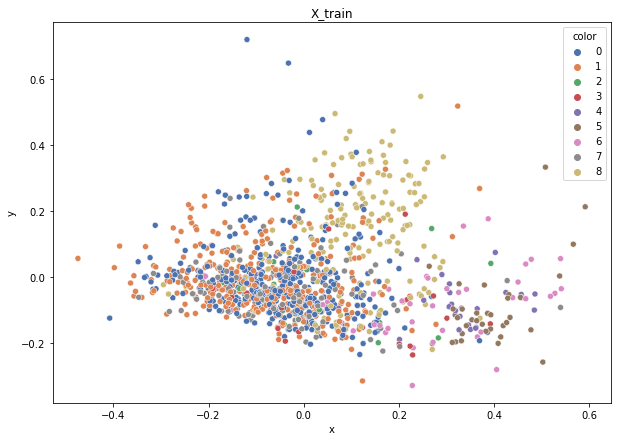

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


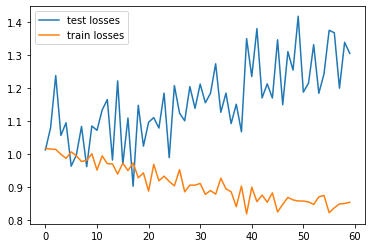

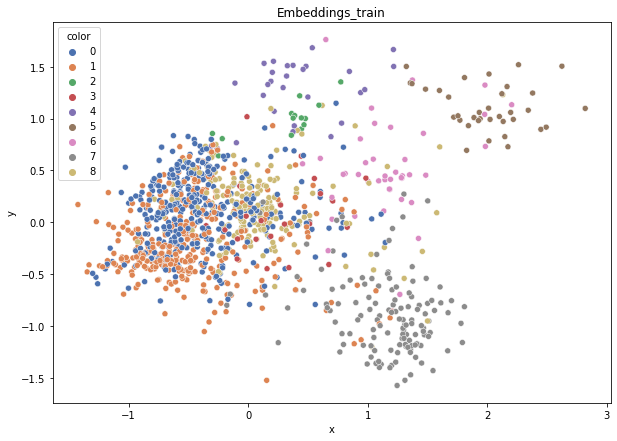

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.417
DT-f1-old+new-features: 0.416
DT-f1-old-features: 0.437
DT-gmean-new-features: 0.206
DT-gmean-old+new-features: 0.209
DT-gmean-old-features: 0.247
DT-minority_gmean-new-features: 0.013
DT-minority_gmean-old+new-features: 0.013
DT-minority_gmean-old-features: 0.016
KNN-f1-new-features: 0.502
KNN-f1-old+new-features: 0.507
KNN-f1-old-features: 0.492
KNN-gmean-new-features: 0.444
KNN-gmean-old+new-features: 0.464
KNN-gmean-old-features: 0.439
KNN-minority_gmean-new-features: 0.028
KNN-minority_gmean-old+new-features: 0.029
KNN-minority_gmean-old-features: 0.027
LDA-f1-new-features: 0.536
LDA-f1-old+new-features: 0.551
LDA-f1-old-features: 0.5
LDA-gmean-new-features: 0.485
LDA-gmean-old+new-features: 0.481
LDA-gmean-old-features: 0.26
LDA-minority_gmean-new-features: 0.028
LDA-minority_gmean-old+new-features: 0.028
LDA-minority_gmean-old-features: 0.022
QDA-f1-new-features: 0.516
QDA-f1-old+new-features: 0.291
QDA-f1-old-features: 0.106
QDA-gmean-new-features: 0.4

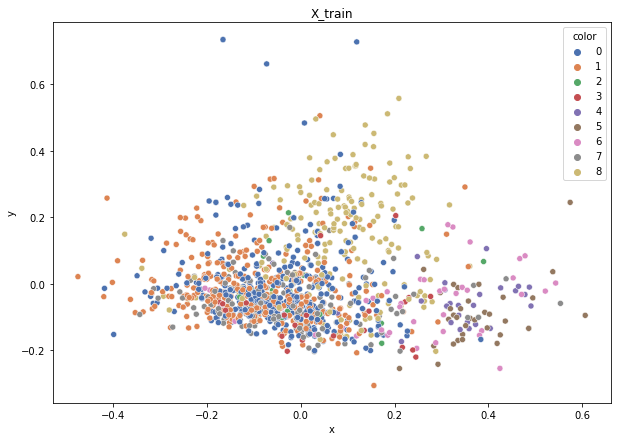

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


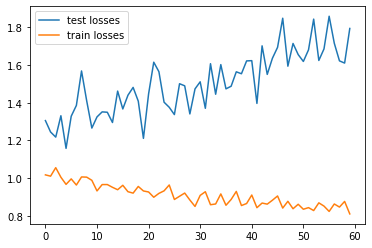

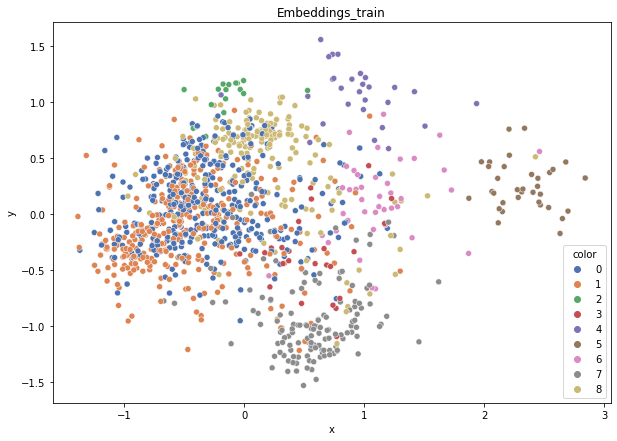

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.469
DT-f1-old+new-features: 0.461
DT-f1-old-features: 0.423
DT-gmean-new-features: 0.254
DT-gmean-old+new-features: 0.248
DT-gmean-old-features: 0.236
DT-minority_gmean-new-features: 0.015
DT-minority_gmean-old+new-features: 0.015
DT-minority_gmean-old-features: 0.014
KNN-f1-new-features: 0.495
KNN-f1-old+new-features: 0.468
KNN-f1-old-features: 0.452
KNN-gmean-new-features: 0.43
KNN-gmean-old+new-features: 0.412
KNN-gmean-old-features: 0.403
KNN-minority_gmean-new-features: 0.025
KNN-minority_gmean-old+new-features: 0.025
KNN-minority_gmean-old-features: 0.025
LDA-f1-new-features: 0.551
LDA-f1-old+new-features: 0.541
LDA-f1-old-features: 0.532
LDA-gmean-new-features: 0.511
LDA-gmean-old+new-features: 0.288
LDA-gmean-old-features: 0.274
LDA-minority_gmean-new-features: 0.043
LDA-minority_gmean-old+new-features: 0.023
LDA-minority_gmean-old-features: 0.015
QDA-f1-new-features: 0.477
QDA-f1-old+new-features: 0.349
QDA-f1-old-features: 0.118
QDA-gmean-new-features: 0

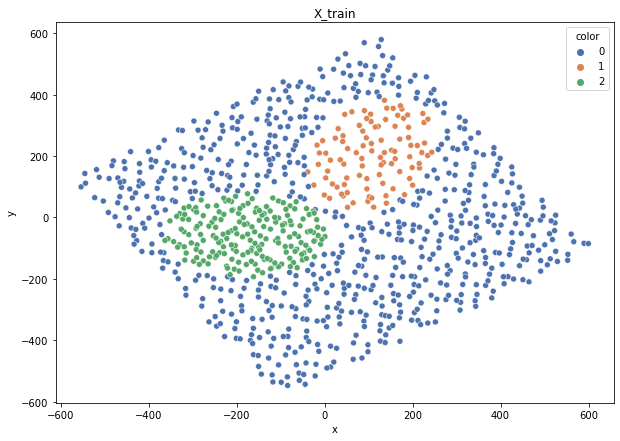

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


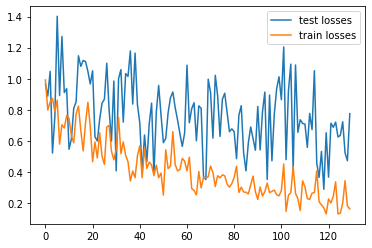

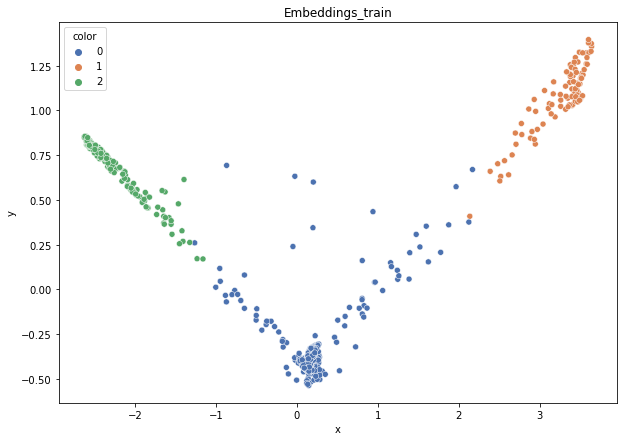

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.979
DT-f1-old+new-features: 0.979
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.982
DT-gmean-old+new-features: 0.982
DT-gmean-old-features: 0.889
DT-minority_gmean-new-features: 0.099
DT-minority_gmean-old+new-features: 0.099
DT-minority_gmean-old-features: 0.09
KNN-f1-new-features: 0.974
KNN-f1-old+new-features: 0.966
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.975
KNN-gmean-old+new-features: 0.961
KNN-gmean-old-features: 0.941
KNN-minority_gmean-new-features: 0.098
KNN-minority_gmean-old+new-features: 0.096
KNN-minority_gmean-old-features: 0.095
LDA-f1-new-features: 0.937
LDA-f1-old+new-features: 0.937
LDA-f1-old-features: 0.262
LDA-gmean-new-features: 0.97
LDA-gmean-old+new-features: 0.97
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.099
LDA-minority_gmean-old+new-features: 0.099
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.964
QDA-f1-old+new-features: 0.972
QDA-f1-old-features: 0.805
QDA-gmean-new-features: 0.98

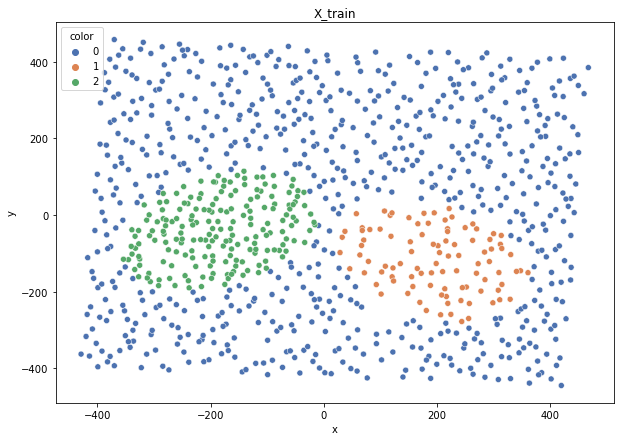

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


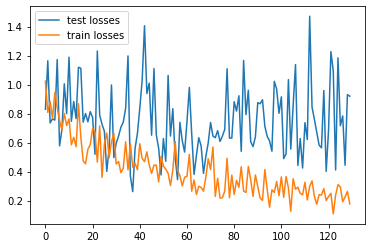

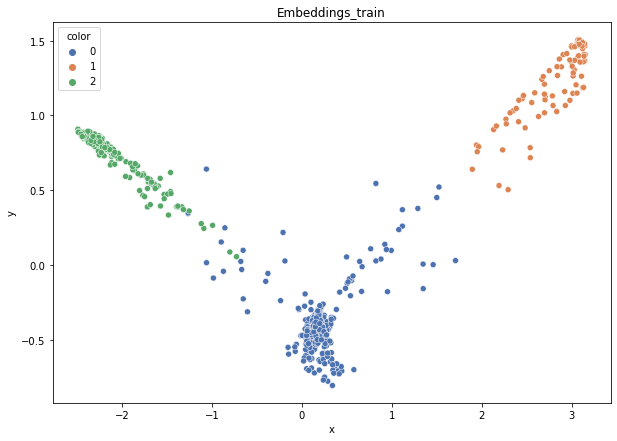

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.952
DT-f1-old+new-features: 0.947
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.919
DT-gmean-old+new-features: 0.917
DT-gmean-old-features: 0.928
DT-minority_gmean-new-features: 0.092
DT-minority_gmean-old+new-features: 0.092
DT-minority_gmean-old-features: 0.094
KNN-f1-new-features: 0.952
KNN-f1-old+new-features: 0.947
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.919
KNN-gmean-old+new-features: 0.909
KNN-gmean-old-features: 0.934
KNN-minority_gmean-new-features: 0.092
KNN-minority_gmean-old+new-features: 0.091
KNN-minority_gmean-old-features: 0.094
LDA-f1-new-features: 0.966
LDA-f1-old+new-features: 0.966
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.943
LDA-gmean-old+new-features: 0.943
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.094
LDA-minority_gmean-old+new-features: 0.094
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.983
QDA-f1-old+new-features: 0.979
QDA-f1-old-features: 0.817
QDA-gmean-new-features: 0

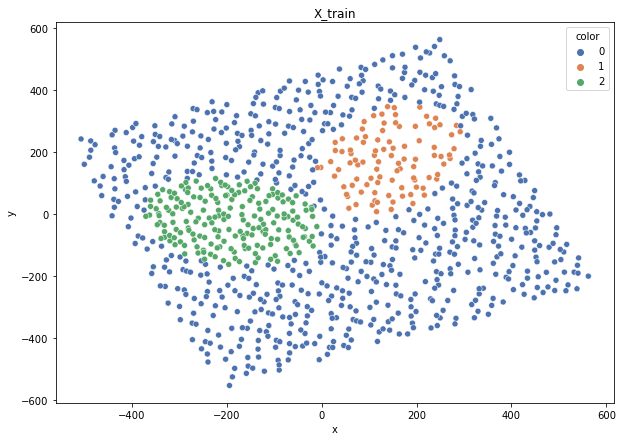

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


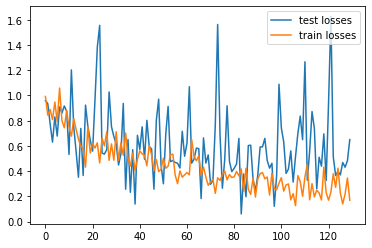

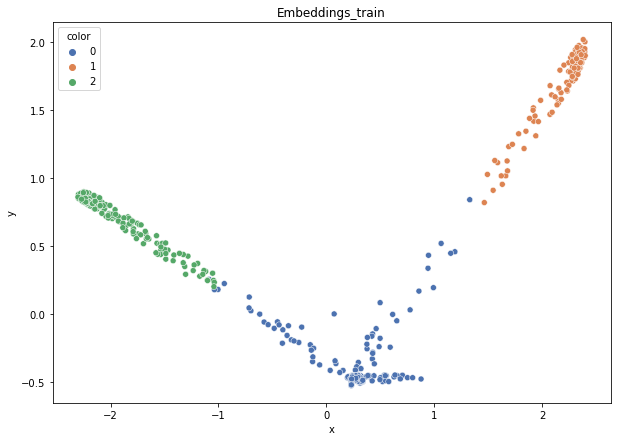

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.992
DT-f1-old+new-features: 0.992
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.986
DT-gmean-old+new-features: 0.986
DT-gmean-old-features: 0.934
DT-minority_gmean-new-features: 0.099
DT-minority_gmean-old+new-features: 0.099
DT-minority_gmean-old-features: 0.094
KNN-f1-new-features: 0.992
KNN-f1-old+new-features: 0.984
KNN-f1-old-features: 0.957
KNN-gmean-new-features: 0.986
KNN-gmean-old+new-features: 0.971
KNN-gmean-old-features: 0.933
KNN-minority_gmean-new-features: 0.099
KNN-minority_gmean-old+new-features: 0.097
KNN-minority_gmean-old-features: 0.093
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.992
LDA-f1-old-features: 0.256
LDA-gmean-new-features: 0.986
LDA-gmean-old+new-features: 0.986
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.099
LDA-minority_gmean-old+new-features: 0.099
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.98
QDA-f1-old+new-features: 0.98
QDA-f1-old-features: 0.856
QDA-gmean-new-features: 0.9

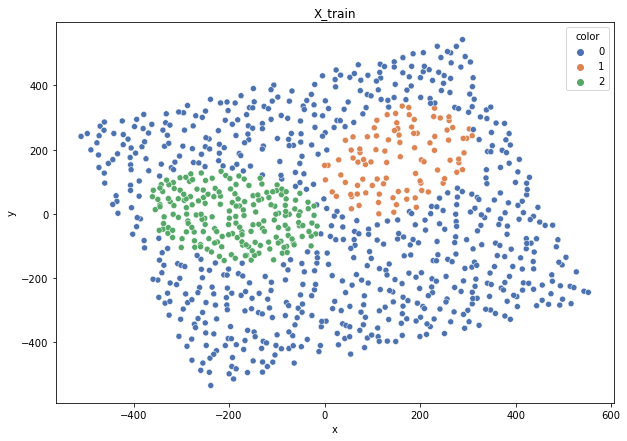

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


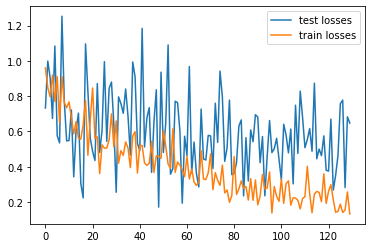

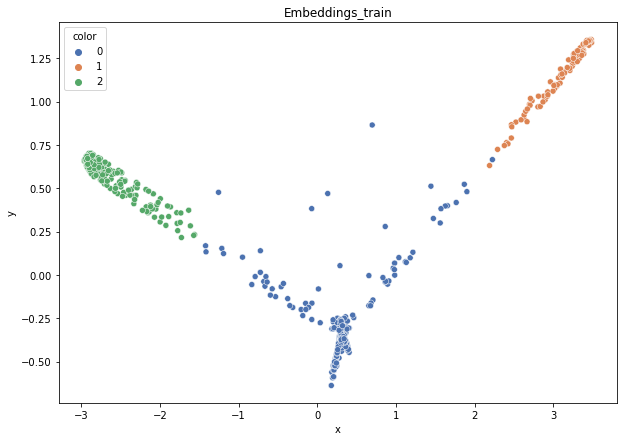

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.967
DT-f1-old+new-features: 0.987
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.983
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.959
DT-minority_gmean-new-features: 0.099
DT-minority_gmean-old+new-features: 0.099
DT-minority_gmean-old-features: 0.098
KNN-f1-new-features: 0.982
KNN-f1-old+new-features: 0.967
KNN-f1-old-features: 0.931
KNN-gmean-new-features: 0.987
KNN-gmean-old+new-features: 0.988
KNN-gmean-old-features: 0.957
KNN-minority_gmean-new-features: 0.099
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.098
LDA-f1-new-features: 0.953
LDA-f1-old+new-features: 0.953
LDA-f1-old-features: 0.28
LDA-gmean-new-features: 0.984
LDA-gmean-old+new-features: 0.984
LDA-gmean-old-features: 0.034
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.938
QDA-f1-old+new-features: 0.938
QDA-f1-old-features: 0.864
QDA-gmean-new-features: 0.978
Q

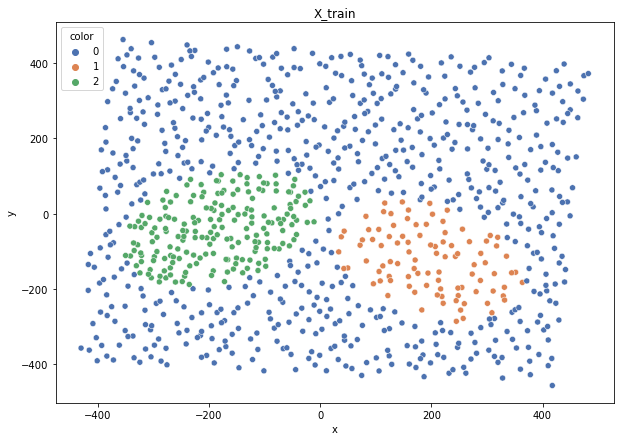

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


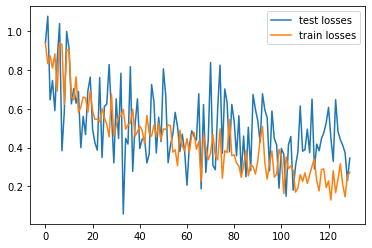

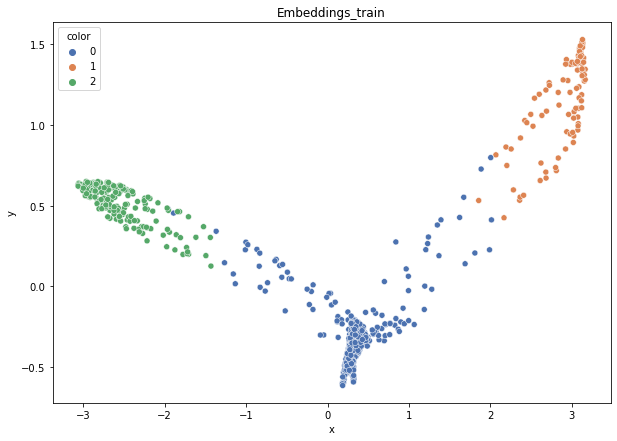

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.966
DT-f1-old+new-features: 0.97
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.954
DT-gmean-old+new-features: 0.956
DT-gmean-old-features: 0.973
DT-minority_gmean-new-features: 0.096
DT-minority_gmean-old+new-features: 0.096
DT-minority_gmean-old-features: 0.098
KNN-f1-new-features: 0.97
KNN-f1-old+new-features: 0.97
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.956
KNN-gmean-old+new-features: 0.956
KNN-gmean-old-features: 0.955
KNN-minority_gmean-new-features: 0.096
KNN-minority_gmean-old+new-features: 0.096
KNN-minority_gmean-old-features: 0.096
LDA-f1-new-features: 0.97
LDA-f1-old+new-features: 0.97
LDA-f1-old-features: 0.259
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.099
LDA-minority_gmean-old+new-features: 0.099
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.97
QDA-f1-old+new-features: 0.957
QDA-f1-old-features: 0.728
QDA-gmean-new-features: 0.983
Q

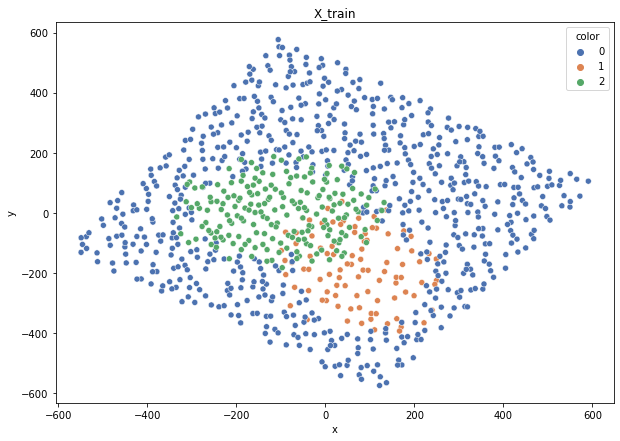

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


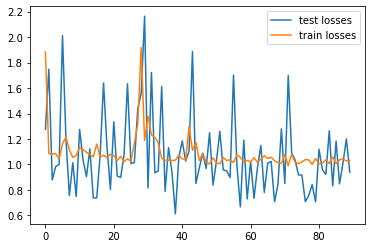

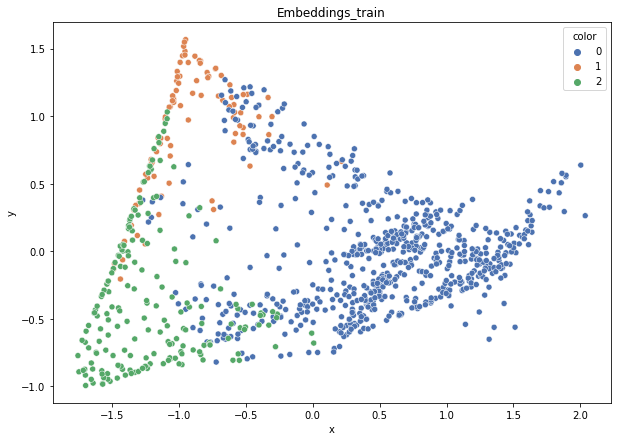

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.748
DT-f1-old+new-features: 0.693
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.708
DT-gmean-old+new-features: 0.662
DT-gmean-old-features: 0.674
DT-minority_gmean-new-features: 0.072
DT-minority_gmean-old+new-features: 0.068
DT-minority_gmean-old-features: 0.07
KNN-f1-new-features: 0.718
KNN-f1-old+new-features: 0.713
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.699
KNN-gmean-old+new-features: 0.699
KNN-gmean-old-features: 0.674
KNN-minority_gmean-new-features: 0.072
KNN-minority_gmean-old+new-features: 0.072
KNN-minority_gmean-old-features: 0.07
LDA-f1-new-features: 0.798
LDA-f1-old+new-features: 0.79
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.808
LDA-gmean-old+new-features: 0.792
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.083
LDA-minority_gmean-old+new-features: 0.082
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.725
QDA-f1-old+new-features: 0.686
QDA-f1-old-features: 0.615
QDA-gmean-new-features: 0.832

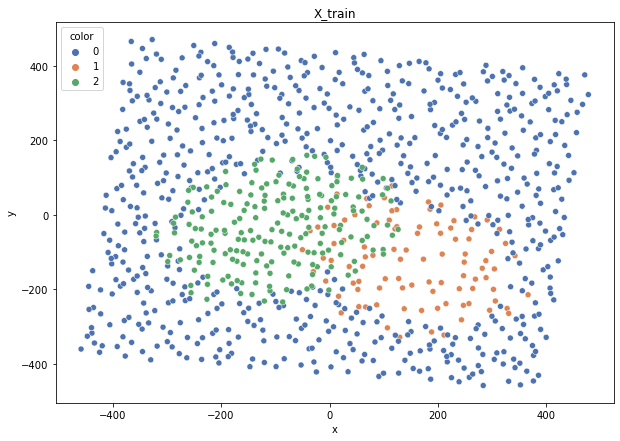

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


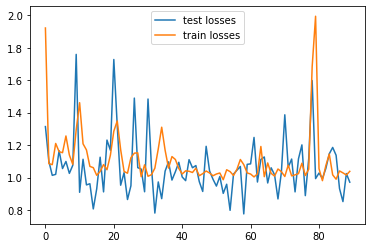

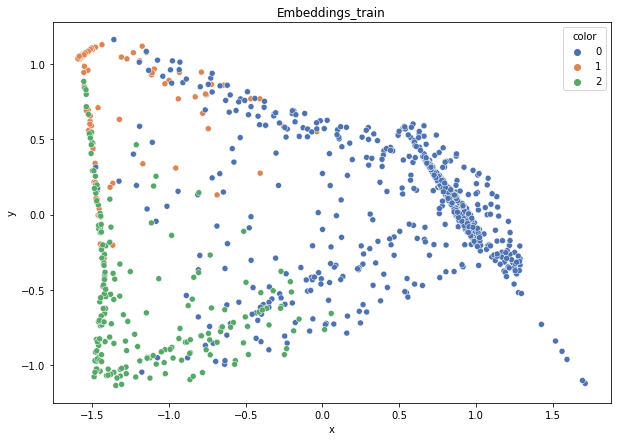

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.828
DT-f1-old+new-features: 0.82
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.853
DT-gmean-old+new-features: 0.834
DT-gmean-old-features: 0.787
DT-minority_gmean-new-features: 0.088
DT-minority_gmean-old+new-features: 0.085
DT-minority_gmean-old-features: 0.082
KNN-f1-new-features: 0.742
KNN-f1-old+new-features: 0.749
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.735
KNN-gmean-old+new-features: 0.742
KNN-gmean-old-features: 0.727
KNN-minority_gmean-new-features: 0.075
KNN-minority_gmean-old+new-features: 0.076
KNN-minority_gmean-old-features: 0.075
LDA-f1-new-features: 0.81
LDA-f1-old+new-features: 0.804
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.869
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.091
LDA-minority_gmean-old+new-features: 0.091
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.717
QDA-f1-old+new-features: 0.704
QDA-f1-old-features: 0.646
QDA-gmean-new-features: 0.8

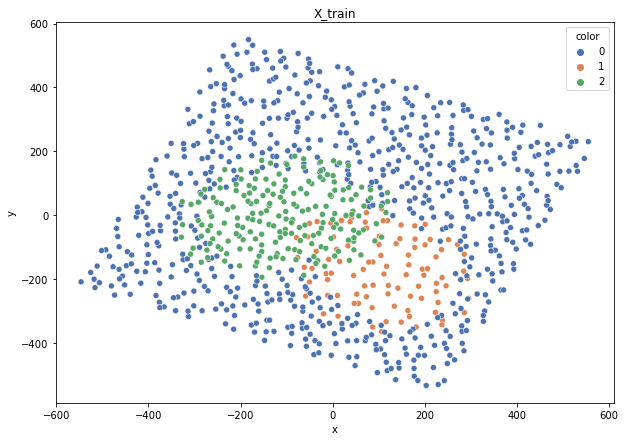

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


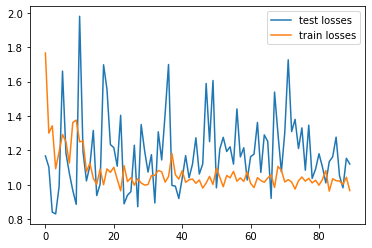

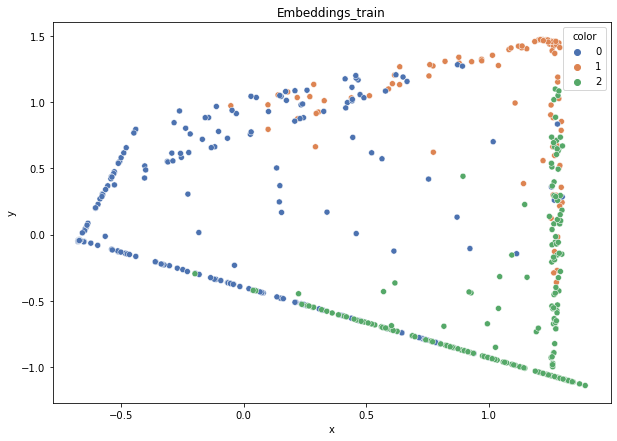

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.781
DT-f1-old+new-features: 0.729
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.783
DT-gmean-old+new-features: 0.735
DT-gmean-old-features: 0.727
DT-minority_gmean-new-features: 0.081
DT-minority_gmean-old+new-features: 0.076
DT-minority_gmean-old-features: 0.076
KNN-f1-new-features: 0.745
KNN-f1-old+new-features: 0.744
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.71
KNN-gmean-old+new-features: 0.744
KNN-gmean-old-features: 0.636
KNN-minority_gmean-new-features: 0.073
KNN-minority_gmean-old+new-features: 0.077
KNN-minority_gmean-old-features: 0.066
LDA-f1-new-features: 0.784
LDA-f1-old+new-features: 0.784
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.801
LDA-gmean-old+new-features: 0.801
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.082
LDA-minority_gmean-old+new-features: 0.082
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.702
QDA-f1-old+new-features: 0.704
QDA-f1-old-features: 0.657
QDA-gmean-new-features: 0.

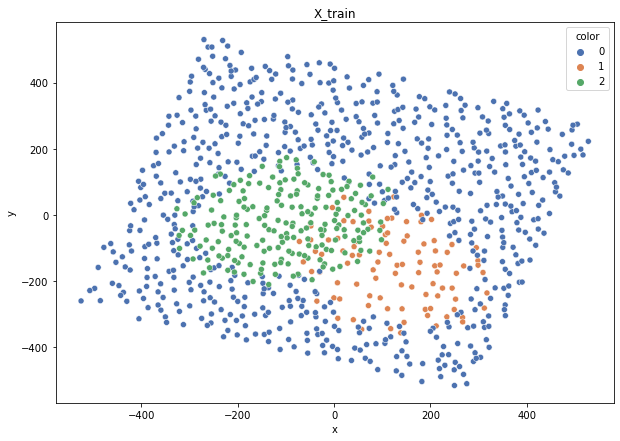

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


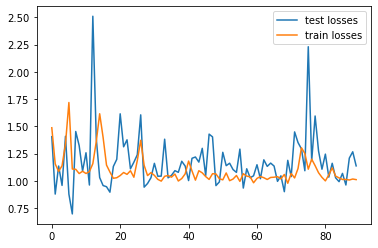

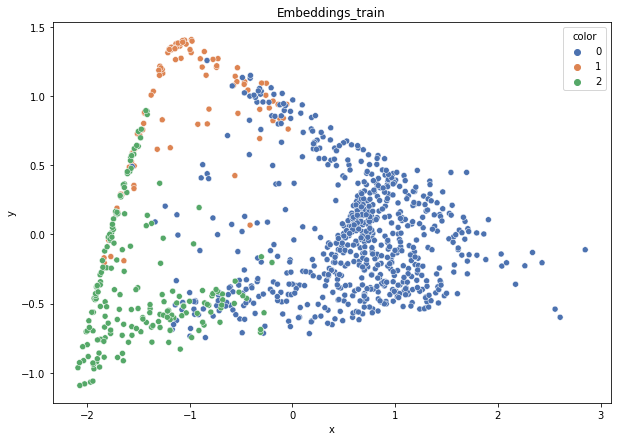

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.743
DT-f1-old+new-features: 0.72
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.747
DT-gmean-old+new-features: 0.708
DT-gmean-old-features: 0.724
DT-minority_gmean-new-features: 0.077
DT-minority_gmean-old+new-features: 0.073
DT-minority_gmean-old-features: 0.076
KNN-f1-new-features: 0.747
KNN-f1-old+new-features: 0.754
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.75
KNN-gmean-old+new-features: 0.741
KNN-gmean-old-features: 0.735
KNN-minority_gmean-new-features: 0.078
KNN-minority_gmean-old+new-features: 0.076
KNN-minority_gmean-old-features: 0.076
LDA-f1-new-features: 0.774
LDA-f1-old+new-features: 0.77
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.806
LDA-gmean-old+new-features: 0.804
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.084
LDA-minority_gmean-old+new-features: 0.084
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.682
QDA-f1-old+new-features: 0.641
QDA-f1-old-features: 0.668
QDA-gmean-new-features: 0.813

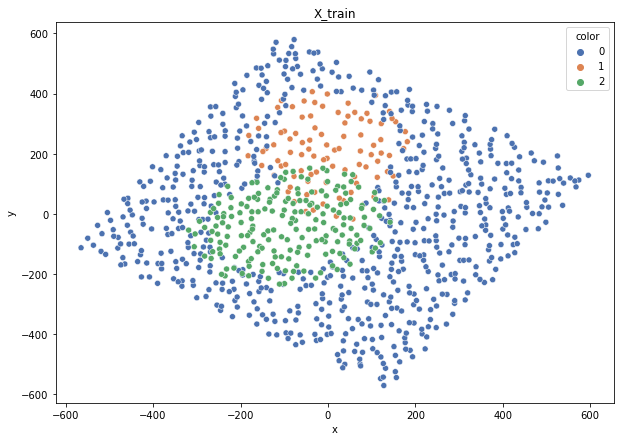

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


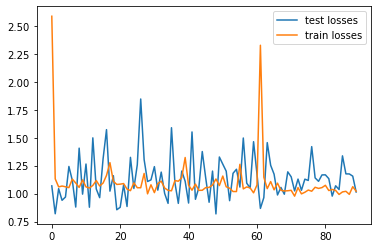

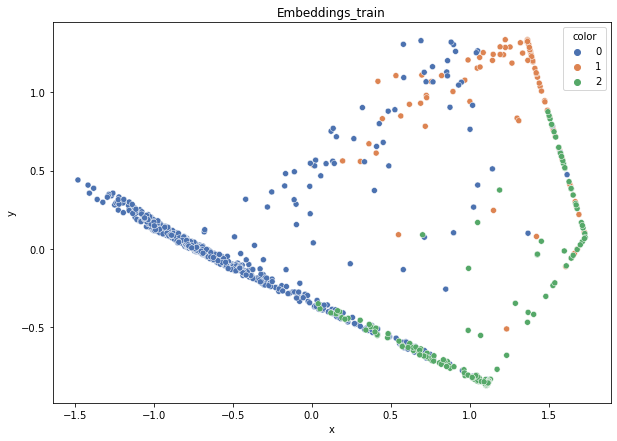

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.776
DT-f1-old+new-features: 0.736
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.782
DT-gmean-old+new-features: 0.763
DT-gmean-old-features: 0.774
DT-minority_gmean-new-features: 0.08
DT-minority_gmean-old+new-features: 0.079
DT-minority_gmean-old-features: 0.082
KNN-f1-new-features: 0.806
KNN-f1-old+new-features: 0.736
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.783
KNN-gmean-old+new-features: 0.721
KNN-gmean-old-features: 0.62
KNN-minority_gmean-new-features: 0.08
KNN-minority_gmean-old+new-features: 0.074
KNN-minority_gmean-old-features: 0.064
LDA-f1-new-features: 0.789
LDA-f1-old+new-features: 0.778
LDA-f1-old-features: 0.273
LDA-gmean-new-features: 0.808
LDA-gmean-old+new-features: 0.792
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.083
LDA-minority_gmean-old+new-features: 0.082
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.77
QDA-f1-old+new-features: 0.76
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.821


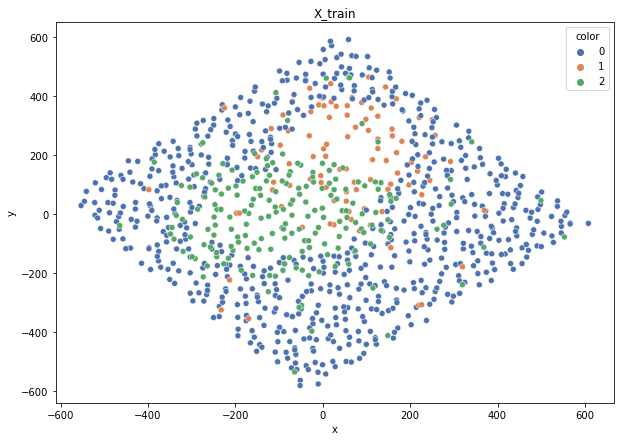

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


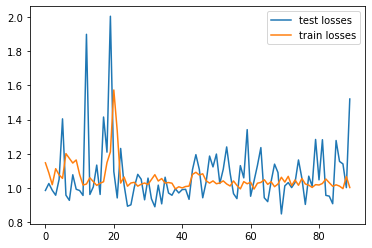

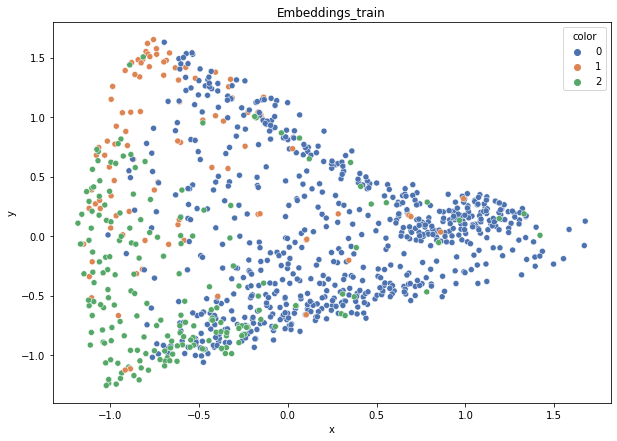

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.551
DT-f1-old+new-features: 0.514
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.577
DT-gmean-old+new-features: 0.52
DT-gmean-old-features: 0.524
DT-minority_gmean-new-features: 0.064
DT-minority_gmean-old+new-features: 0.058
DT-minority_gmean-old-features: 0.059
KNN-f1-new-features: 0.596
KNN-f1-old+new-features: 0.512
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.586
KNN-gmean-old+new-features: 0.488
KNN-gmean-old-features: 0.502
KNN-minority_gmean-new-features: 0.063
KNN-minority_gmean-old+new-features: 0.053
KNN-minority_gmean-old-features: 0.053
LDA-f1-new-features: 0.653
LDA-f1-old+new-features: 0.652
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.618
LDA-gmean-old+new-features: 0.626
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.064
LDA-minority_gmean-old+new-features: 0.065
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.622
QDA-f1-old+new-features: 0.627
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.

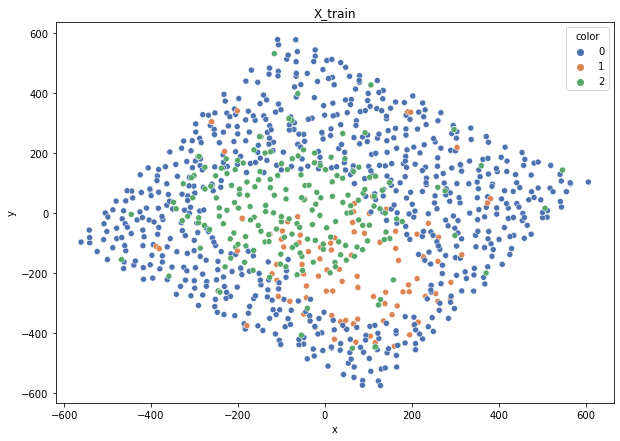

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


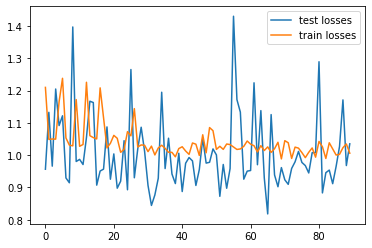

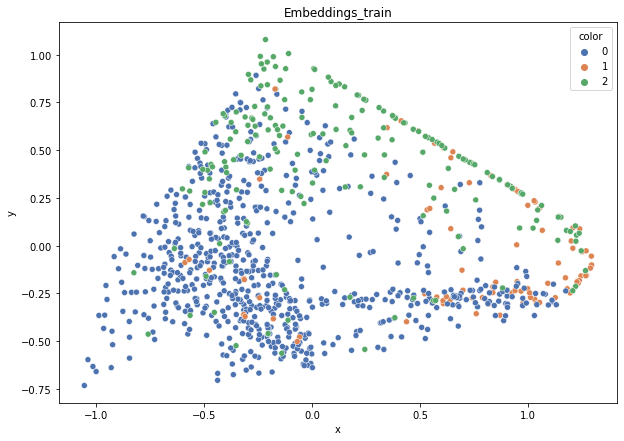

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.577
DT-f1-old+new-features: 0.568
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.569
DT-gmean-old+new-features: 0.569
DT-gmean-old-features: 0.547
DT-minority_gmean-new-features: 0.061
DT-minority_gmean-old+new-features: 0.062
DT-minority_gmean-old-features: 0.06
KNN-f1-new-features: 0.571
KNN-f1-old+new-features: 0.532
KNN-f1-old-features: 0.536
KNN-gmean-new-features: 0.549
KNN-gmean-old+new-features: 0.474
KNN-gmean-old-features: 0.479
KNN-minority_gmean-new-features: 0.059
KNN-minority_gmean-old+new-features: 0.05
KNN-minority_gmean-old-features: 0.05
LDA-f1-new-features: 0.678
LDA-f1-old+new-features: 0.657
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.695
LDA-gmean-old+new-features: 0.67
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.073
LDA-minority_gmean-old+new-features: 0.071
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.65
QDA-f1-old+new-features: 0.653
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.666


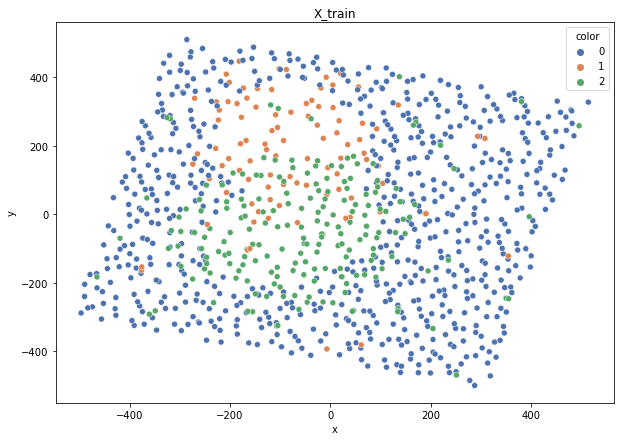

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


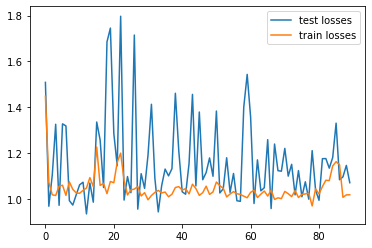

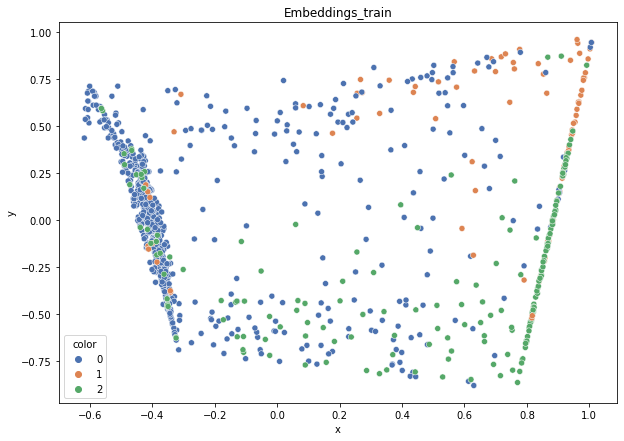

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.521
DT-f1-old+new-features: 0.482
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.483
DT-gmean-old+new-features: 0.474
DT-gmean-old-features: 0.43
DT-minority_gmean-new-features: 0.053
DT-minority_gmean-old+new-features: 0.052
DT-minority_gmean-old-features: 0.049
KNN-f1-new-features: 0.452
KNN-f1-old+new-features: 0.471
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.366
KNN-gmean-old+new-features: 0.421
KNN-gmean-old-features: 0.373
KNN-minority_gmean-new-features: 0.039
KNN-minority_gmean-old+new-features: 0.045
KNN-minority_gmean-old-features: 0.04
LDA-f1-new-features: 0.56
LDA-f1-old+new-features: 0.56
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.528
LDA-gmean-old+new-features: 0.528
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.057
LDA-minority_gmean-old+new-features: 0.057
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.582
QDA-f1-old+new-features: 0.574
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.548

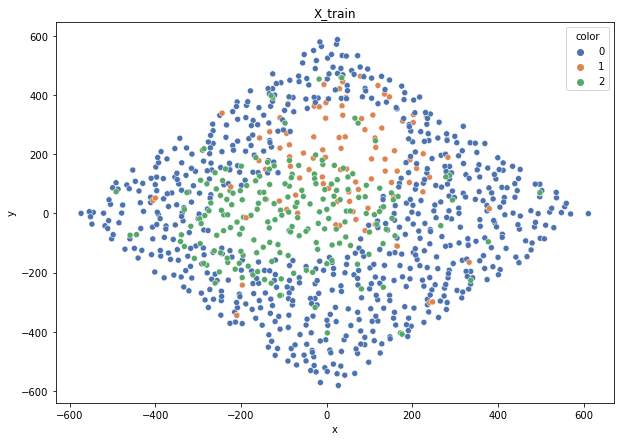

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


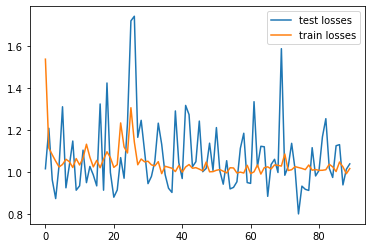

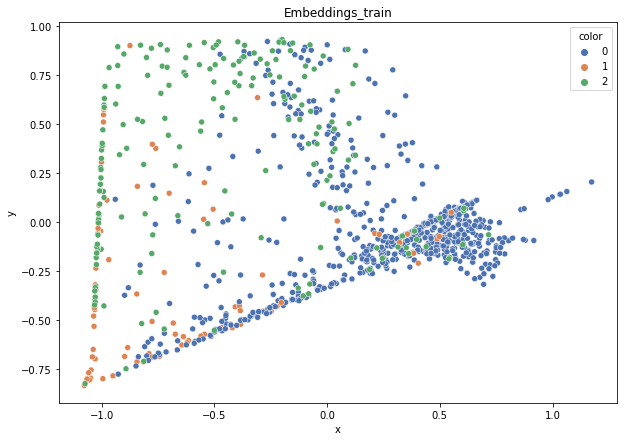

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.607
DT-f1-old+new-features: 0.568
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.6
DT-gmean-old+new-features: 0.56
DT-gmean-old-features: 0.473
DT-minority_gmean-new-features: 0.064
DT-minority_gmean-old+new-features: 0.06
DT-minority_gmean-old-features: 0.053
KNN-f1-new-features: 0.593
KNN-f1-old+new-features: 0.511
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.566
KNN-gmean-old+new-features: 0.48
KNN-gmean-old-features: 0.464
KNN-minority_gmean-new-features: 0.059
KNN-minority_gmean-old+new-features: 0.052
KNN-minority_gmean-old-features: 0.05
LDA-f1-new-features: 0.626
LDA-f1-old+new-features: 0.626
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.613
LDA-gmean-old+new-features: 0.613
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.065
LDA-minority_gmean-old+new-features: 0.065
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.615
QDA-f1-old+new-features: 0.623
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.609
QD

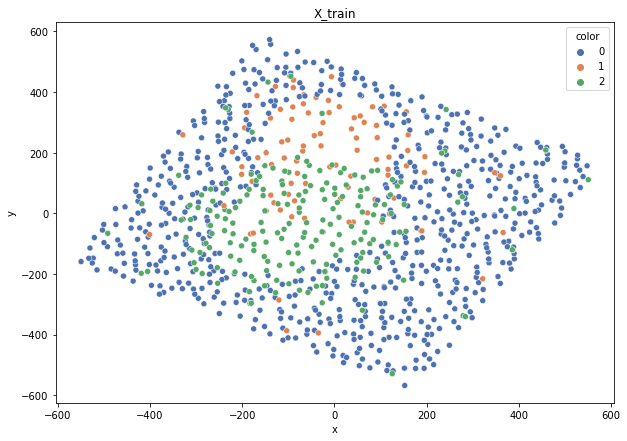

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


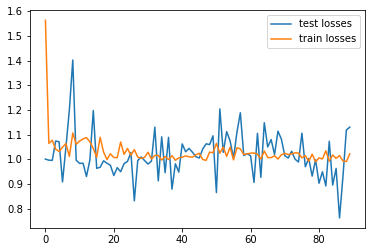

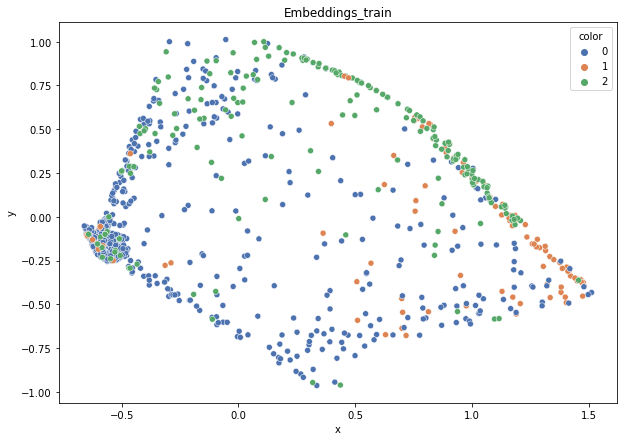

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.522
DT-f1-old+new-features: 0.531
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.549
DT-gmean-old+new-features: 0.535
DT-gmean-old-features: 0.536
DT-minority_gmean-new-features: 0.061
DT-minority_gmean-old+new-features: 0.059
DT-minority_gmean-old-features: 0.058
KNN-f1-new-features: 0.649
KNN-f1-old+new-features: 0.52
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.64
KNN-gmean-old+new-features: 0.474
KNN-gmean-old-features: 0.471
KNN-minority_gmean-new-features: 0.067
KNN-minority_gmean-old+new-features: 0.051
KNN-minority_gmean-old-features: 0.05
LDA-f1-new-features: 0.679
LDA-f1-old+new-features: 0.653
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.652
LDA-gmean-old+new-features: 0.62
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.068
LDA-minority_gmean-old+new-features: 0.065
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.645
QDA-f1-old+new-features: 0.653
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.649

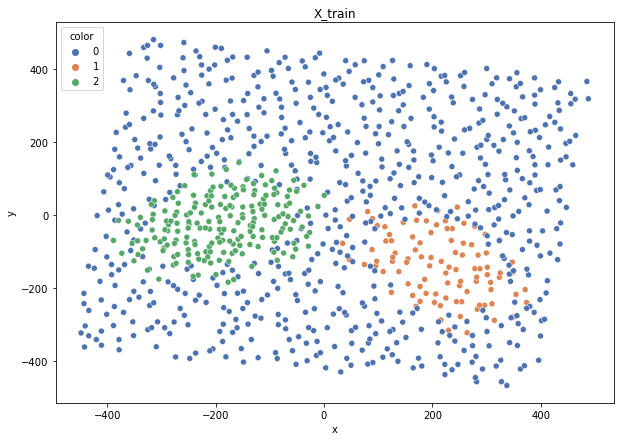

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


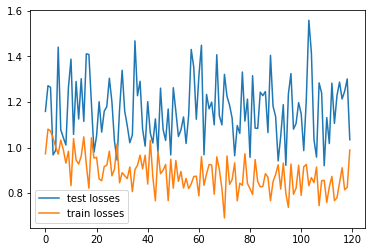

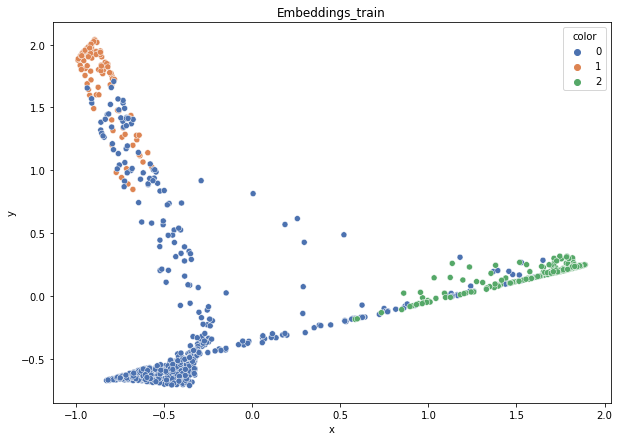

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.82
DT-f1-old+new-features: 0.815
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.808
DT-gmean-old+new-features: 0.801
DT-gmean-old-features: 0.814
DT-minority_gmean-new-features: 0.084
DT-minority_gmean-old+new-features: 0.083
DT-minority_gmean-old-features: 0.085
KNN-f1-new-features: 0.801
KNN-f1-old+new-features: 0.779
KNN-f1-old-features: 0.772
KNN-gmean-new-features: 0.783
KNN-gmean-old+new-features: 0.748
KNN-gmean-old-features: 0.746
KNN-minority_gmean-new-features: 0.081
KNN-minority_gmean-old+new-features: 0.078
KNN-minority_gmean-old-features: 0.078
LDA-f1-new-features: 0.811
LDA-f1-old+new-features: 0.815
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.836
LDA-gmean-old+new-features: 0.838
LDA-gmean-old-features: 0.026
LDA-minority_gmean-new-features: 0.088
LDA-minority_gmean-old+new-features: 0.088
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.806
QDA-f1-old+new-features: 0.81
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.

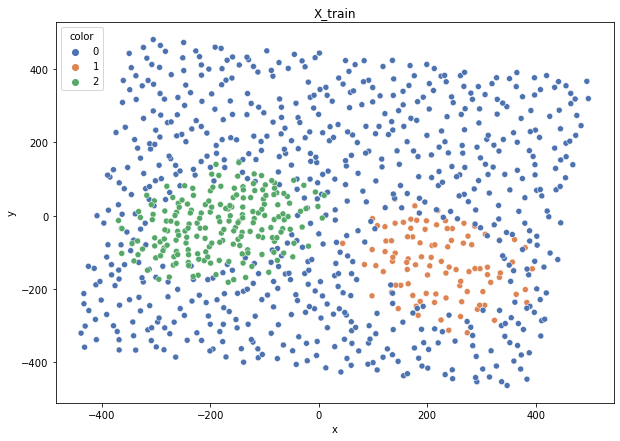

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


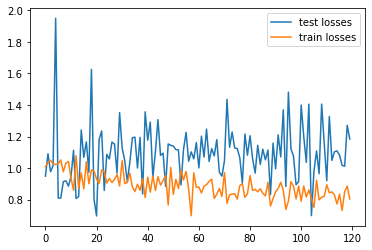

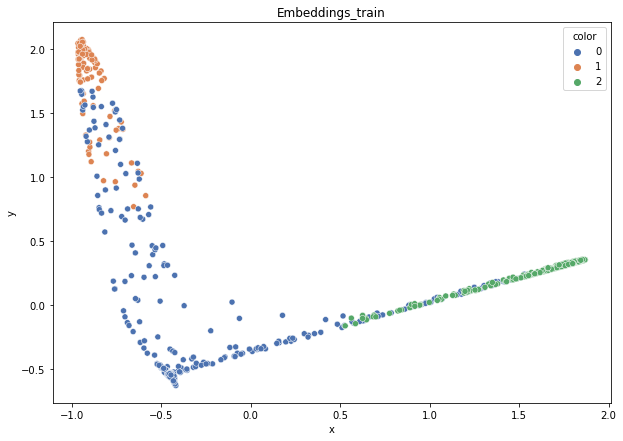

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.823
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.824
DT-gmean-old+new-features: 0.82
DT-gmean-old-features: 0.769
DT-minority_gmean-new-features: 0.085
DT-minority_gmean-old+new-features: 0.085
DT-minority_gmean-old-features: 0.08
KNN-f1-new-features: 0.824
KNN-f1-old+new-features: 0.807
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.813
KNN-gmean-old+new-features: 0.796
KNN-gmean-old-features: 0.776
KNN-minority_gmean-new-features: 0.083
KNN-minority_gmean-old+new-features: 0.082
KNN-minority_gmean-old-features: 0.081
LDA-f1-new-features: 0.824
LDA-f1-old+new-features: 0.824
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.866
LDA-gmean-old+new-features: 0.866
LDA-gmean-old-features: 0.027
LDA-minority_gmean-new-features: 0.091
LDA-minority_gmean-old+new-features: 0.091
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.807
QDA-f1-old+new-features: 0.807
QDA-f1-old-features: 0.843
QDA-gmean-new-features: 0.

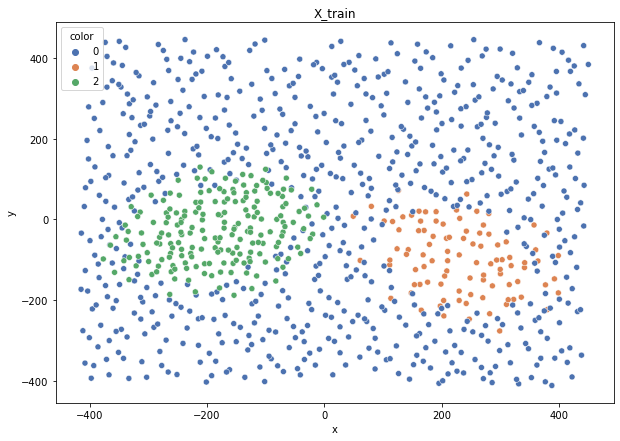

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


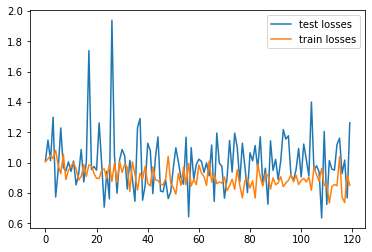

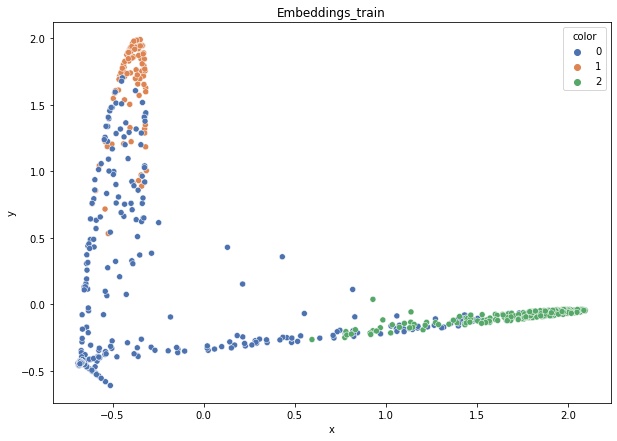

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.822
DT-f1-old+new-features: 0.843
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.813
DT-gmean-old+new-features: 0.839
DT-gmean-old-features: 0.785
DT-minority_gmean-new-features: 0.084
DT-minority_gmean-old+new-features: 0.086
DT-minority_gmean-old-features: 0.082
KNN-f1-new-features: 0.804
KNN-f1-old+new-features: 0.811
KNN-f1-old-features: 0.766
KNN-gmean-new-features: 0.783
KNN-gmean-old+new-features: 0.783
KNN-gmean-old-features: 0.744
KNN-minority_gmean-new-features: 0.081
KNN-minority_gmean-old+new-features: 0.08
KNN-minority_gmean-old-features: 0.077
LDA-f1-new-features: 0.86
LDA-f1-old+new-features: 0.851
LDA-f1-old-features: 0.276
LDA-gmean-new-features: 0.889
LDA-gmean-old+new-features: 0.876
LDA-gmean-old-features: 0.027
LDA-minority_gmean-new-features: 0.092
LDA-minority_gmean-old+new-features: 0.091
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.844
QDA-f1-old+new-features: 0.844
QDA-f1-old-features: 0.718
QDA-gmean-new-features: 0.

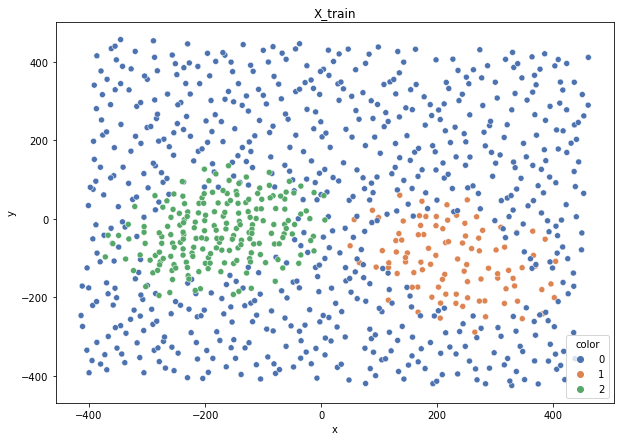

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


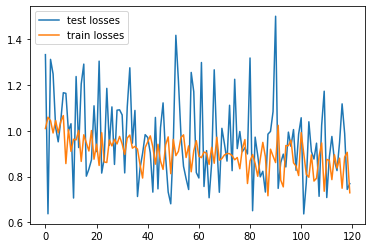

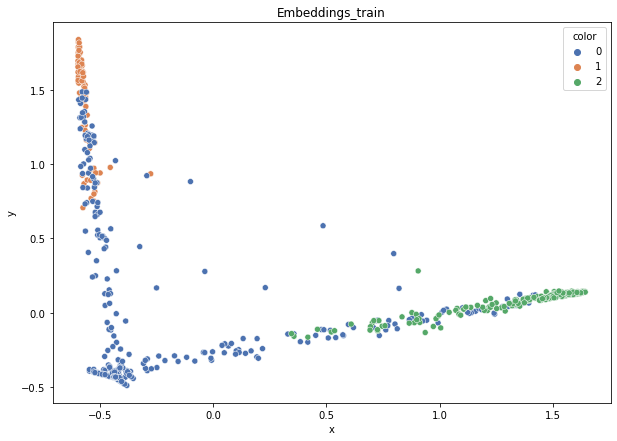

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.794
DT-f1-old+new-features: 0.817
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.819
DT-gmean-old+new-features: 0.849
DT-gmean-old-features: 0.831
DT-minority_gmean-new-features: 0.086
DT-minority_gmean-old+new-features: 0.089
DT-minority_gmean-old-features: 0.087
KNN-f1-new-features: 0.815
KNN-f1-old+new-features: 0.768
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.824
KNN-gmean-old+new-features: 0.775
KNN-gmean-old-features: 0.749
KNN-minority_gmean-new-features: 0.086
KNN-minority_gmean-old+new-features: 0.081
KNN-minority_gmean-old-features: 0.079
LDA-f1-new-features: 0.846
LDA-f1-old+new-features: 0.846
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.919
LDA-gmean-old+new-features: 0.919
LDA-gmean-old-features: 0.01
LDA-minority_gmean-new-features: 0.097
LDA-minority_gmean-old+new-features: 0.097
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.808
QDA-f1-old+new-features: 0.805
QDA-f1-old-features: 0.828
QDA-gmean-new-features: 0

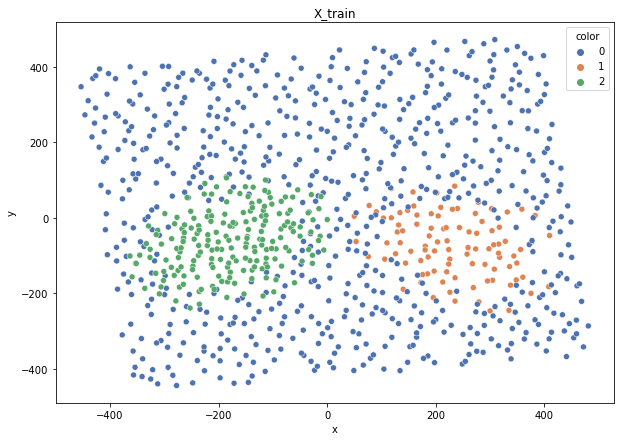

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


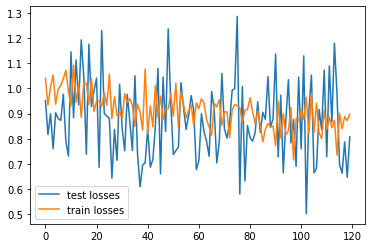

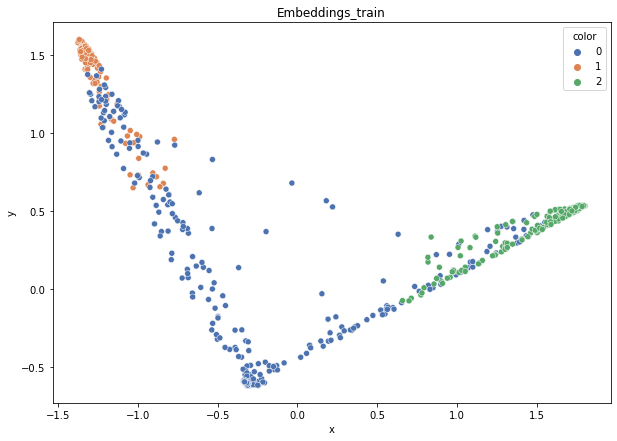

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.856
DT-f1-old+new-features: 0.826
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.876
DT-gmean-old+new-features: 0.86
DT-gmean-old-features: 0.866
DT-minority_gmean-new-features: 0.091
DT-minority_gmean-old+new-features: 0.09
DT-minority_gmean-old-features: 0.091
KNN-f1-new-features: 0.843
KNN-f1-old+new-features: 0.825
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.853
KNN-gmean-old+new-features: 0.834
KNN-gmean-old-features: 0.788
KNN-minority_gmean-new-features: 0.088
KNN-minority_gmean-old+new-features: 0.087
KNN-minority_gmean-old-features: 0.082
LDA-f1-new-features: 0.893
LDA-f1-old+new-features: 0.893
LDA-f1-old-features: 0.264
LDA-gmean-new-features: 0.931
LDA-gmean-old+new-features: 0.931
LDA-gmean-old-features: 0.026
LDA-minority_gmean-new-features: 0.096
LDA-minority_gmean-old+new-features: 0.096
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.863
QDA-f1-old+new-features: 0.876
QDA-f1-old-features: 0.841
QDA-gmean-new-features: 0.

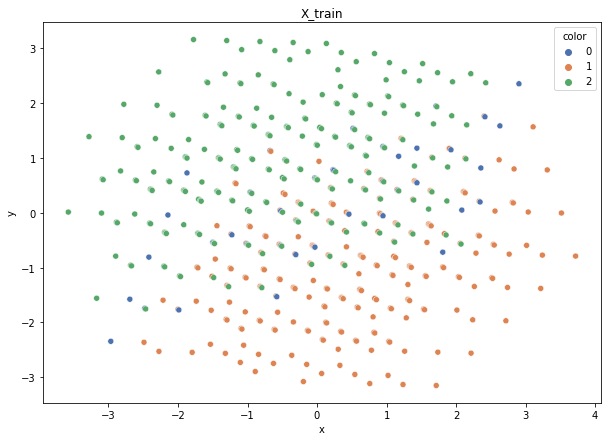

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


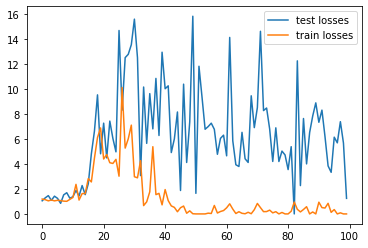

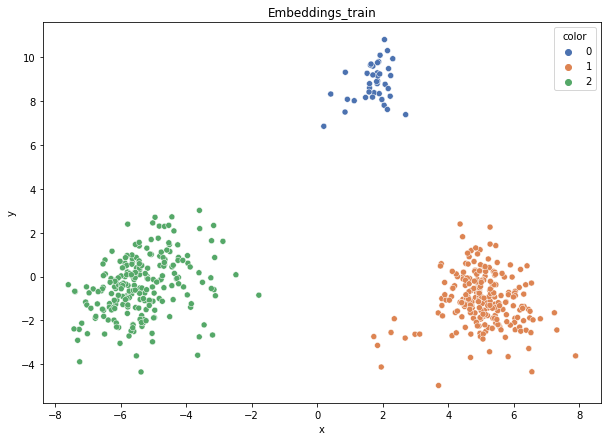

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.983
DT-f1-old+new-features: 0.983
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.982
DT-gmean-old+new-features: 0.982
DT-gmean-old-features: 0.088
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 0.001
KNN-f1-new-features: 0.988
KNN-f1-old+new-features: 0.983
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.982
KNN-gmean-old-features: 0.09
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.001
LDA-f1-new-features: 0.977
LDA-f1-old+new-features: 0.977
LDA-f1-old-features: 0.617
LDA-gmean-new-features: 0.977
LDA-gmean-old+new-features: 0.977
LDA-gmean-old-features: 0.098
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.962
QDA-f1-old+new-features: 0.962
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.949
QDA-gme

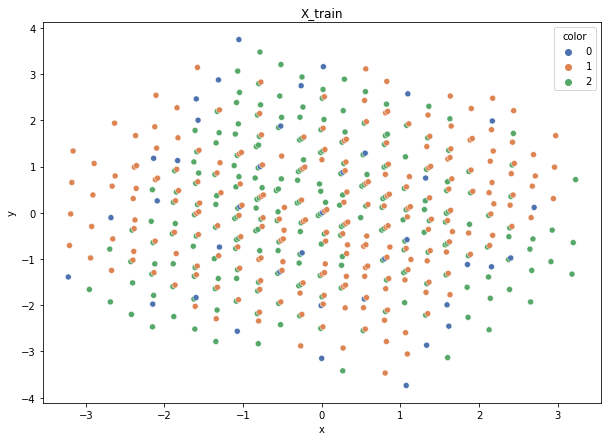

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


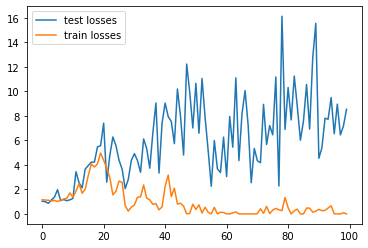

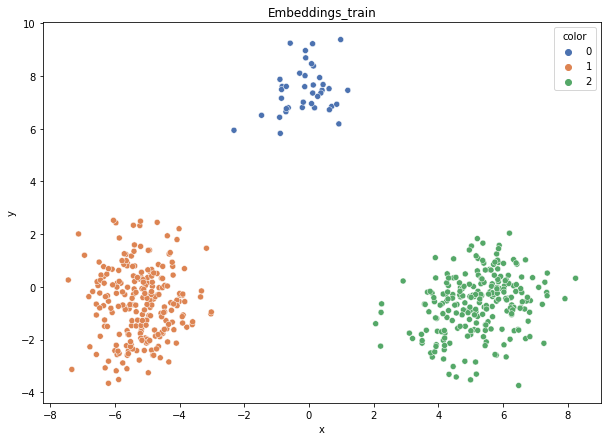

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.905
DT-f1-old+new-features: 0.834
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.878
DT-gmean-old+new-features: 0.902
DT-gmean-old-features: 0.585
DT-minority_gmean-new-features: 0.009
DT-minority_gmean-old+new-features: 0.03
DT-minority_gmean-old-features: 0.007
KNN-f1-new-features: 0.983
KNN-f1-old+new-features: 0.962
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.983
KNN-gmean-old+new-features: 0.949
KNN-gmean-old-features: 0.088
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 0.03
KNN-minority_gmean-old-features: 0.001
LDA-f1-new-features: 0.983
LDA-f1-old+new-features: 0.983
LDA-f1-old-features: 0.601
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.096
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.983
QDA-f1-old+new-features: 0.962
QDA-f1-old-features: 0.845
QDA-gmean-new-features: 0.983
QD

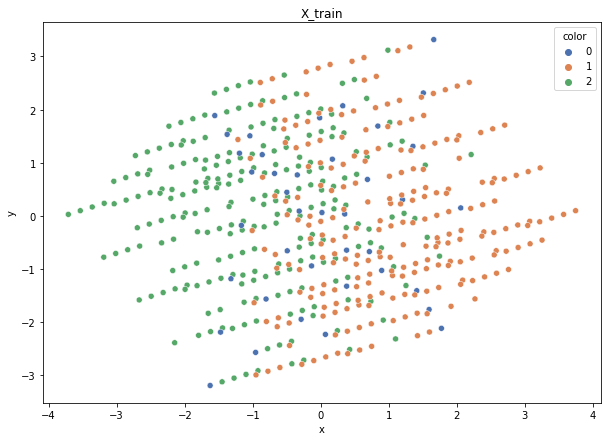

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


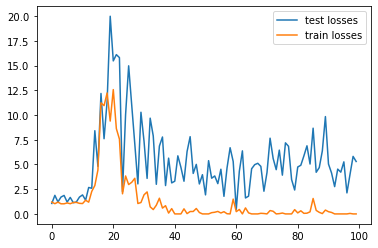

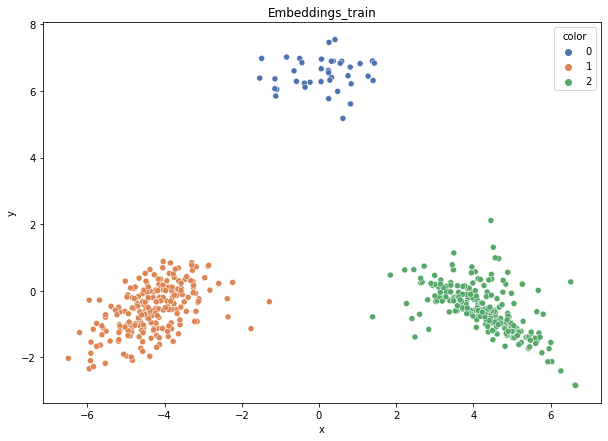

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.915
DT-f1-old+new-features: 0.893
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.872
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.597
DT-minority_gmean-new-features: 0.026
DT-minority_gmean-old+new-features: 0.026
DT-minority_gmean-old-features: 0.007
KNN-f1-new-features: 0.977
KNN-f1-old+new-features: 0.977
KNN-f1-old-features: 0.566
KNN-gmean-new-features: 0.976
KNN-gmean-old+new-features: 0.976
KNN-gmean-old-features: 0.09
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 0.001
LDA-f1-new-features: 0.971
LDA-f1-old+new-features: 0.971
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.97
LDA-gmean-old+new-features: 0.97
LDA-gmean-old-features: 0.096
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.945
QDA-f1-old+new-features: 0.945
QDA-f1-old-features: 0.836
QDA-gmean-new-features: 0.93
QDA-gmea

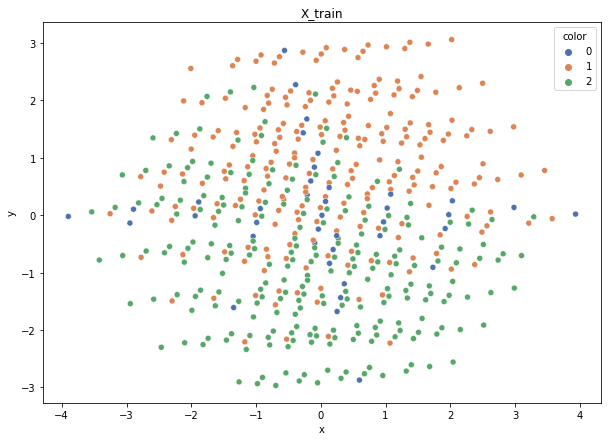

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


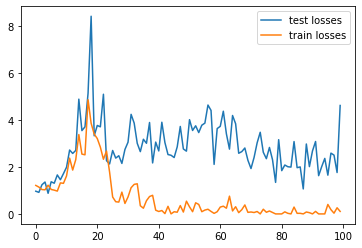

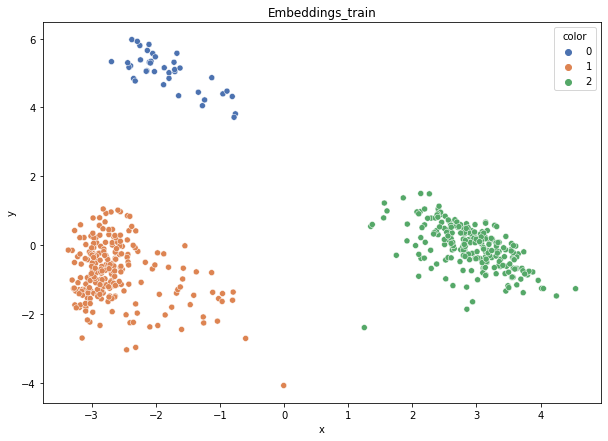

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.921
DT-f1-old+new-features: 0.921
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.878
DT-gmean-old+new-features: 0.878
DT-gmean-old-features: 0.397
DT-minority_gmean-new-features: 0.009
DT-minority_gmean-old+new-features: 0.009
DT-minority_gmean-old-features: 0.005
KNN-f1-new-features: 0.921
KNN-f1-old+new-features: 0.94
KNN-f1-old-features: 0.562
KNN-gmean-new-features: 0.878
KNN-gmean-old+new-features: 0.912
KNN-gmean-old-features: 0.089
KNN-minority_gmean-new-features: 0.009
KNN-minority_gmean-old+new-features: 0.028
KNN-minority_gmean-old-features: 0.001
LDA-f1-new-features: 0.974
LDA-f1-old+new-features: 0.951
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.96
LDA-gmean-old+new-features: 0.923
LDA-gmean-old-features: 0.096
LDA-minority_gmean-new-features: 0.03
LDA-minority_gmean-old+new-features: 0.009
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.9
QDA-f1-old+new-features: 0.9
QDA-f1-old-features: 0.809
QDA-gmean-new-features: 0.839
QDA

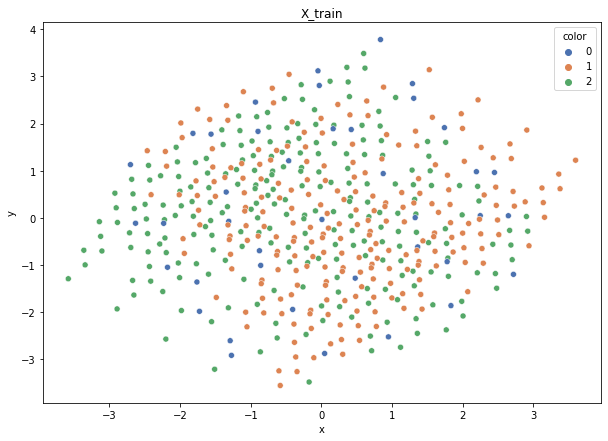

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


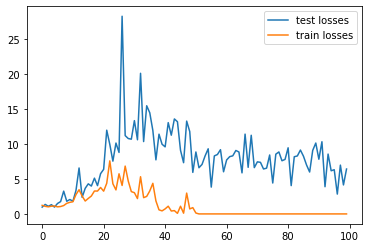

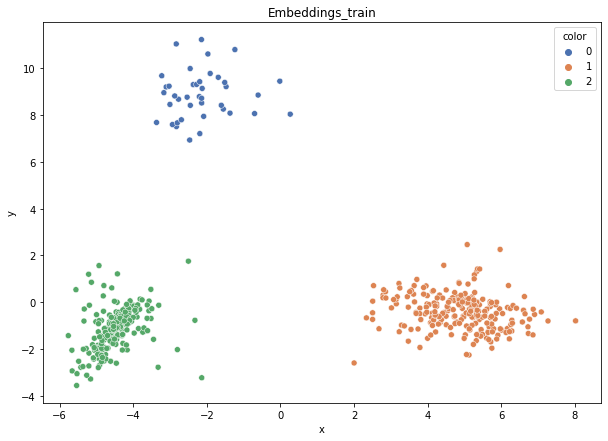

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.902
DT-f1-old+new-features: 0.902
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.853
DT-gmean-old+new-features: 0.853
DT-gmean-old-features: 0.415
DT-minority_gmean-new-features: 0.026
DT-minority_gmean-old+new-features: 0.026
DT-minority_gmean-old-features: 0.005
KNN-f1-new-features: 0.902
KNN-f1-old+new-features: 0.936
KNN-f1-old-features: 0.563
KNN-gmean-new-features: 0.853
KNN-gmean-old+new-features: 0.904
KNN-gmean-old-features: 0.089
KNN-minority_gmean-new-features: 0.026
KNN-minority_gmean-old+new-features: 0.028
KNN-minority_gmean-old-features: 0.001
LDA-f1-new-features: 0.955
LDA-f1-old+new-features: 0.955
LDA-f1-old-features: 0.62
LDA-gmean-new-features: 0.939
LDA-gmean-old+new-features: 0.939
LDA-gmean-old-features: 0.098
LDA-minority_gmean-new-features: 0.03
LDA-minority_gmean-old+new-features: 0.03
LDA-minority_gmean-old-features: 0.001
QDA-f1-new-features: 0.96
QDA-f1-old+new-features: 0.96
QDA-f1-old-features: 0.859
QDA-gmean-new-features: 0.945

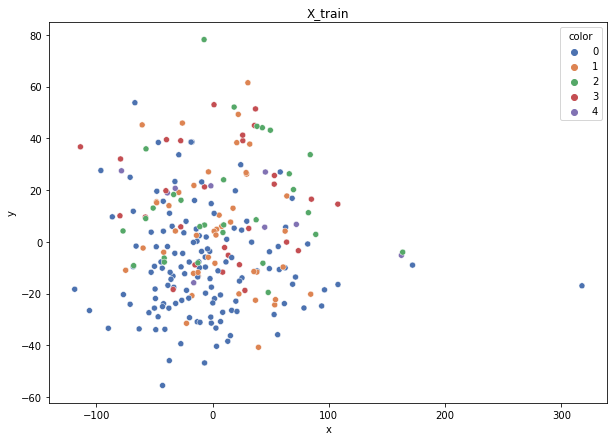

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


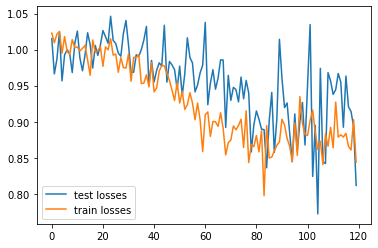

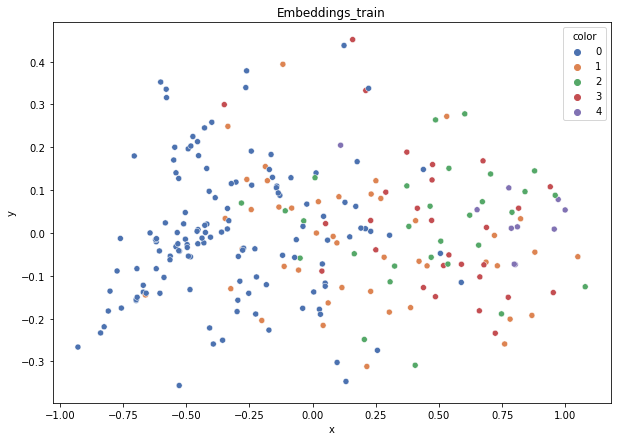

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.394
DT-f1-old+new-features: 0.334
DT-f1-old-features: 0.266
DT-gmean-new-features: 0.128
DT-gmean-old+new-features: 0.114
DT-gmean-old-features: 0.098
DT-minority_gmean-new-features: 0.034
DT-minority_gmean-old+new-features: 0.031
DT-minority_gmean-old-features: 0.026
KNN-f1-new-features: 0.288
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.091
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.089
KNN-minority_gmean-new-features: 0.024
KNN-minority_gmean-old+new-features: 0.024
KNN-minority_gmean-old-features: 0.024
LDA-f1-new-features: 0.431
LDA-f1-old+new-features: 0.377
LDA-f1-old-features: 0.365
LDA-gmean-new-features: 0.133
LDA-gmean-old+new-features: 0.111
LDA-gmean-old-features: 0.111
LDA-minority_gmean-new-features: 0.034
LDA-minority_gmean-old+new-features: 0.028
LDA-minority_gmean-old-features: 0.028
QDA-f1-new-features: 0.334
QDA-f1-old+new-features: 0.224
QDA-f1-old-features: 0.392
QDA-gmean-new-features: 

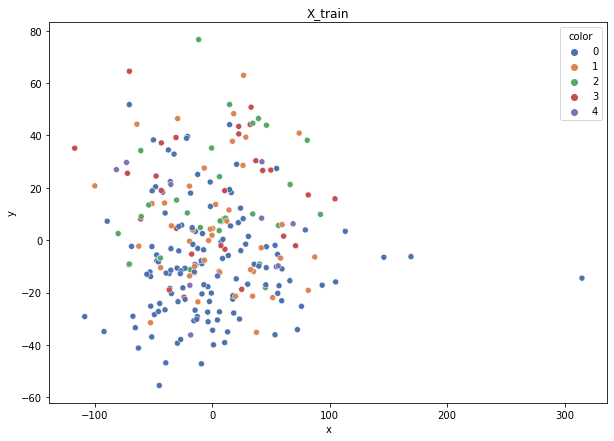

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


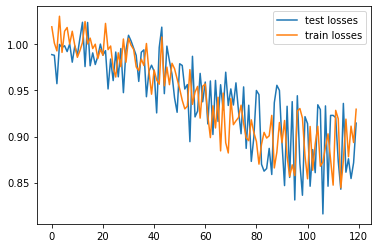

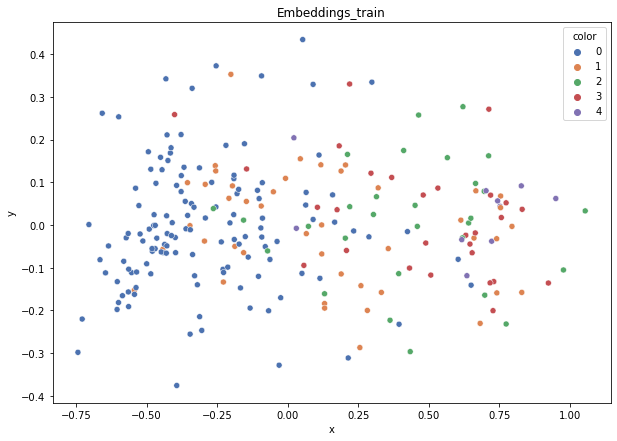

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.365
DT-f1-old+new-features: 0.337
DT-f1-old-features: 0.281
DT-gmean-new-features: 0.054
DT-gmean-old+new-features: 0.285
DT-gmean-old-features: 0.101
DT-minority_gmean-new-features: 0.014
DT-minority_gmean-old+new-features: 0.076
DT-minority_gmean-old-features: 0.027
KNN-f1-new-features: 0.41
KNN-f1-old+new-features: 0.426
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.347
KNN-gmean-old+new-features: 0.39
KNN-gmean-old-features: 0.122
KNN-minority_gmean-new-features: 0.089
KNN-minority_gmean-old+new-features: 0.104
KNN-minority_gmean-old-features: 0.033
LDA-f1-new-features: 0.41
LDA-f1-old+new-features: 0.419
LDA-f1-old-features: 0.355
LDA-gmean-new-features: 0.347
LDA-gmean-old+new-features: 0.37
LDA-gmean-old-features: 0.108
LDA-minority_gmean-new-features: 0.089
LDA-minority_gmean-old+new-features: 0.094
LDA-minority_gmean-old-features: 0.027
QDA-f1-new-features: 0.357
QDA-f1-old+new-features: 0.192
QDA-f1-old-features: 0.39
QDA-gmean-new-features: 0.124

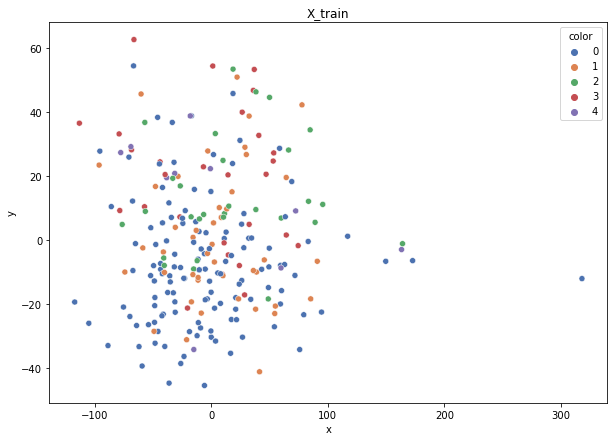

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


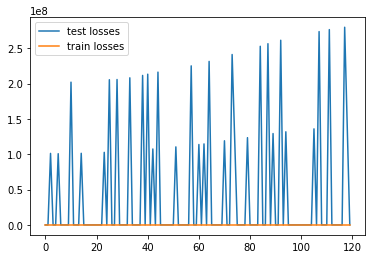

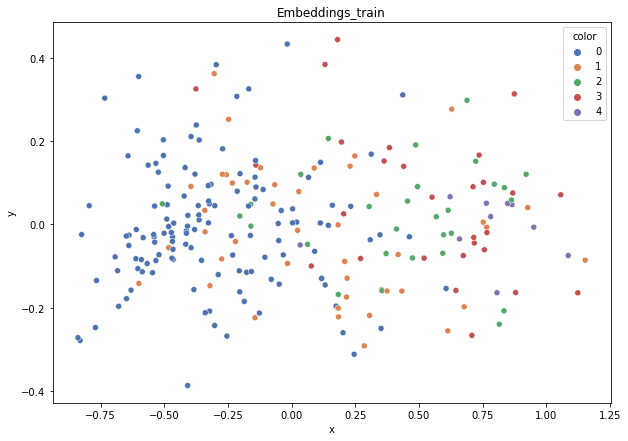

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.327
DT-f1-old+new-features: 0.279
DT-f1-old-features: 0.368
DT-gmean-new-features: 0.298
DT-gmean-old+new-features: 0.039
DT-gmean-old-features: 0.128
DT-minority_gmean-new-features: 0.082
DT-minority_gmean-old+new-features: 0.01
DT-minority_gmean-old-features: 0.034
KNN-f1-new-features: 0.401
KNN-f1-old+new-features: 0.331
KNN-f1-old-features: 0.325
KNN-gmean-new-features: 0.345
KNN-gmean-old+new-features: 0.115
KNN-gmean-old-features: 0.109
KNN-minority_gmean-new-features: 0.091
KNN-minority_gmean-old+new-features: 0.031
KNN-minority_gmean-old-features: 0.029
LDA-f1-new-features: 0.378
LDA-f1-old+new-features: 0.24
LDA-f1-old-features: 0.261
LDA-gmean-new-features: 0.297
LDA-gmean-old+new-features: 0.069
LDA-gmean-old-features: 0.034
LDA-minority_gmean-new-features: 0.076
LDA-minority_gmean-old+new-features: 0.018
LDA-minority_gmean-old-features: 0.009
QDA-f1-new-features: 0.343
QDA-f1-old+new-features: 0.229
QDA-f1-old-features: 0.345
QDA-gmean-new-features: 0.

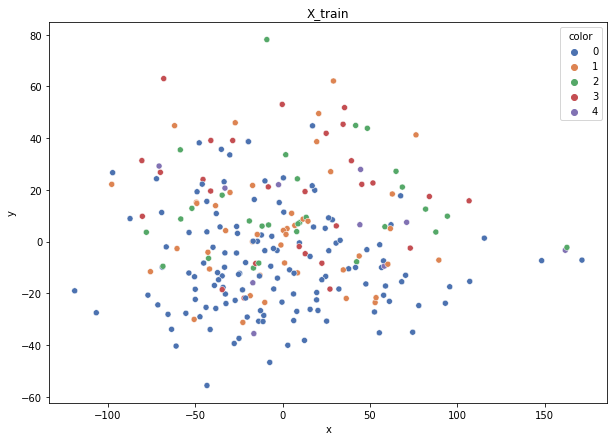

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


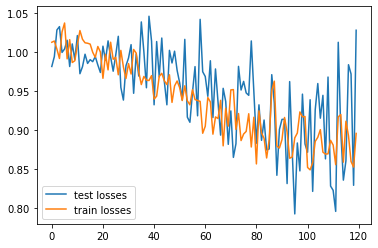

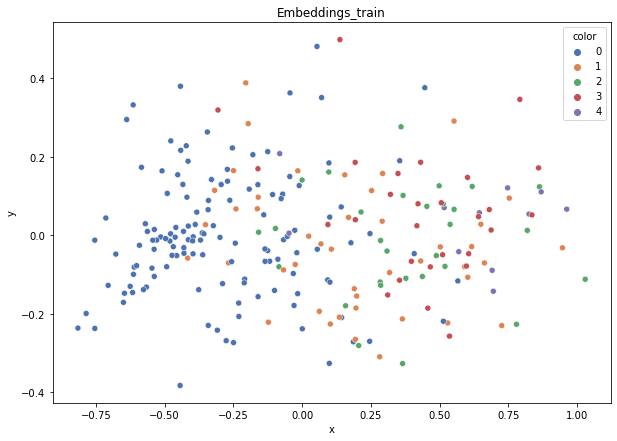

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.309
DT-f1-old+new-features: 0.307
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.103
DT-gmean-old+new-features: 0.102
DT-gmean-old-features: 0.112
DT-minority_gmean-new-features: 0.028
DT-minority_gmean-old+new-features: 0.027
DT-minority_gmean-old-features: 0.031
KNN-f1-new-features: 0.15
KNN-f1-old+new-features: 0.248
KNN-f1-old-features: 0.254
KNN-gmean-new-features: 0.009
KNN-gmean-old+new-features: 0.036
KNN-gmean-old-features: 0.036
KNN-minority_gmean-new-features: 0.002
KNN-minority_gmean-old+new-features: 0.01
KNN-minority_gmean-old-features: 0.01
LDA-f1-new-features: 0.236
LDA-f1-old+new-features: 0.202
LDA-f1-old-features: 0.287
LDA-gmean-new-features: 0.03
LDA-gmean-old+new-features: 0.011
LDA-gmean-old-features: 0.086
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.003
LDA-minority_gmean-old-features: 0.022
QDA-f1-new-features: 0.215
QDA-f1-old+new-features: 0.171
QDA-f1-old-features: 0.254
QDA-gmean-new-features: 0.02

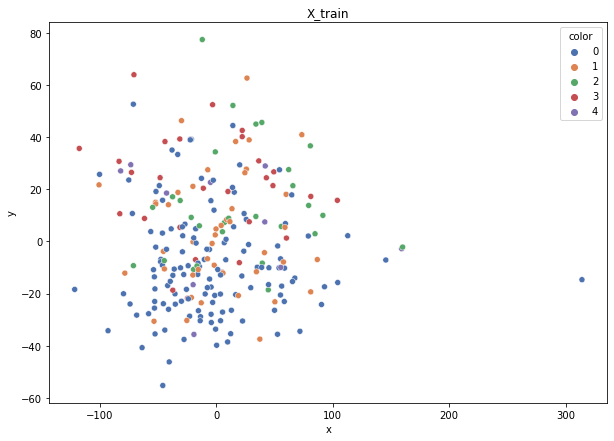

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


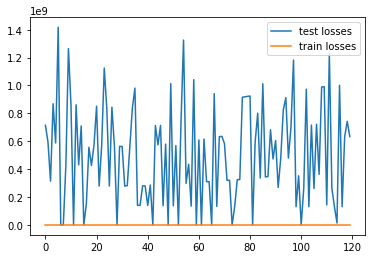

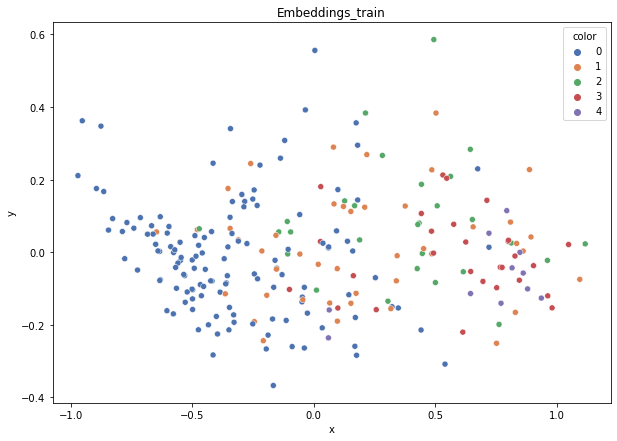

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.272
DT-f1-old+new-features: 0.352
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.086
DT-gmean-old+new-features: 0.123
DT-gmean-old-features: 0.03
DT-minority_gmean-new-features: 0.023
DT-minority_gmean-old+new-features: 0.033
DT-minority_gmean-old-features: 0.008
KNN-f1-new-features: 0.324
KNN-f1-old+new-features: 0.304
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.108
KNN-gmean-old+new-features: 0.04
KNN-gmean-old-features: 0.035
KNN-minority_gmean-new-features: 0.029
KNN-minority_gmean-old+new-features: 0.01
KNN-minority_gmean-old-features: 0.009
LDA-f1-new-features: 0.286
LDA-f1-old+new-features: 0.37
LDA-f1-old-features: 0.415
LDA-gmean-new-features: 0.089
LDA-gmean-old+new-features: 0.12
LDA-gmean-old-features: 0.363
LDA-minority_gmean-new-features: 0.023
LDA-minority_gmean-old+new-features: 0.031
LDA-minority_gmean-old-features: 0.092
QDA-f1-new-features: 0.269
QDA-f1-old+new-features: 0.196
QDA-f1-old-features: 0.268
QDA-gmean-new-features: 0.034

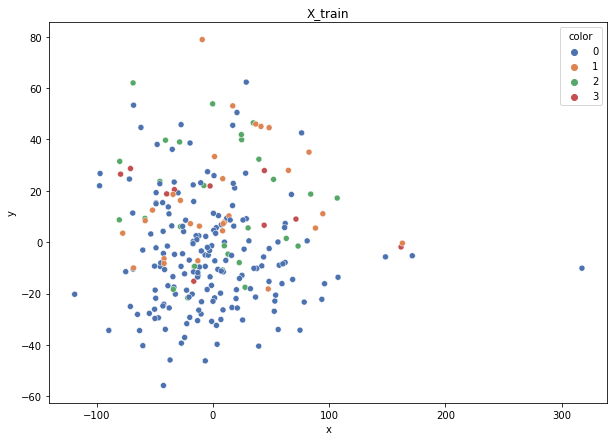

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


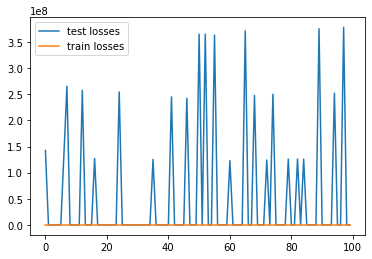

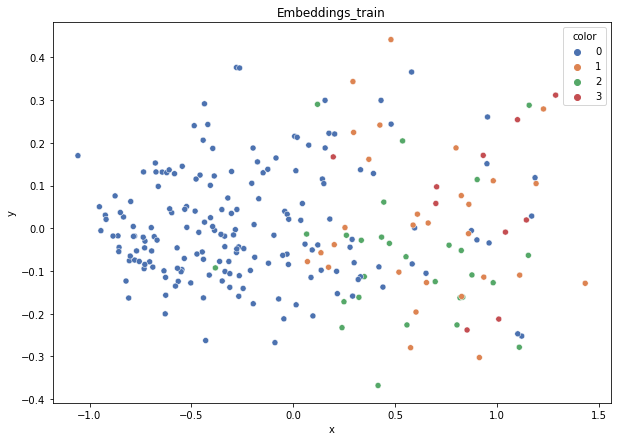

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.383
DT-f1-old+new-features: 0.374
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.107
DT-gmean-old+new-features: 0.1
DT-gmean-old-features: 0.099
DT-minority_gmean-new-features: 0.02
DT-minority_gmean-old+new-features: 0.019
DT-minority_gmean-old-features: 0.019
KNN-f1-new-features: 0.241
KNN-f1-old+new-features: 0.235
KNN-f1-old-features: 0.238
KNN-gmean-new-features: 0.018
KNN-gmean-old+new-features: 0.018
KNN-gmean-old-features: 0.018
KNN-minority_gmean-new-features: 0.003
KNN-minority_gmean-old+new-features: 0.003
KNN-minority_gmean-old-features: 0.003
LDA-f1-new-features: 0.403
LDA-f1-old+new-features: 0.594
LDA-f1-old-features: 0.376
LDA-gmean-new-features: 0.102
LDA-gmean-old+new-features: 0.519
LDA-gmean-old-features: 0.028
LDA-minority_gmean-new-features: 0.019
LDA-minority_gmean-old+new-features: 0.095
LDA-minority_gmean-old-features: 0.005
QDA-f1-new-features: 0.369
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.394
QDA-gmean-new-features: 0.09

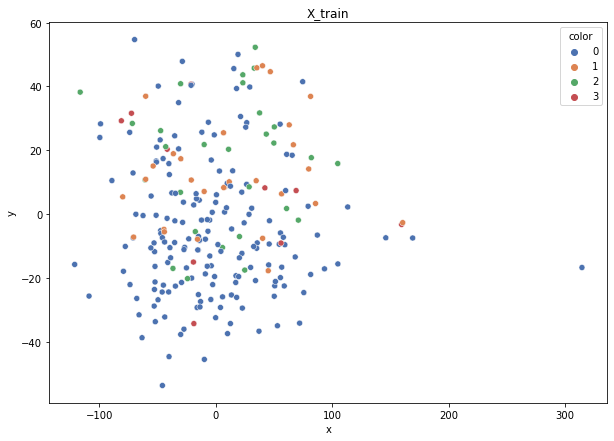

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


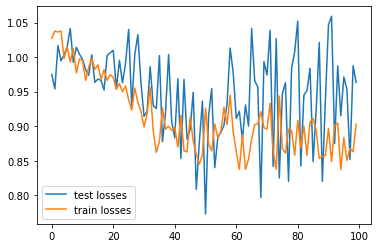

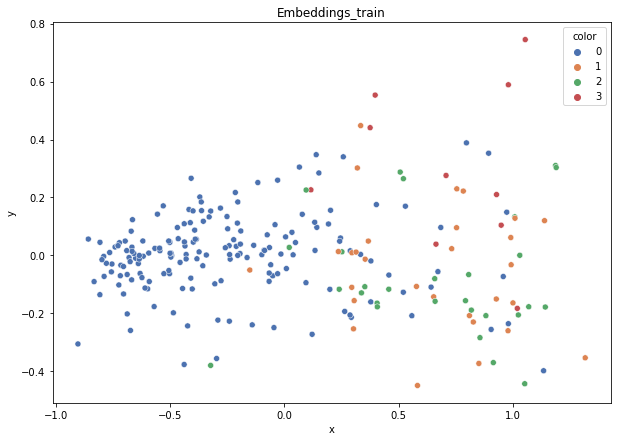

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.32
DT-f1-old+new-features: 0.303
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.088
DT-gmean-old+new-features: 0.075
DT-gmean-old-features: 0.546
DT-minority_gmean-new-features: 0.017
DT-minority_gmean-old+new-features: 0.014
DT-minority_gmean-old-features: 0.105
KNN-f1-new-features: 0.284
KNN-f1-old+new-features: 0.361
KNN-f1-old-features: 0.39
KNN-gmean-new-features: 0.064
KNN-gmean-old+new-features: 0.099
KNN-gmean-old-features: 0.11
KNN-minority_gmean-new-features: 0.012
KNN-minority_gmean-old+new-features: 0.019
KNN-minority_gmean-old-features: 0.021
LDA-f1-new-features: 0.412
LDA-f1-old+new-features: 0.382
LDA-f1-old-features: 0.344
LDA-gmean-new-features: 0.112
LDA-gmean-old+new-features: 0.1
LDA-gmean-old-features: 0.085
LDA-minority_gmean-new-features: 0.021
LDA-minority_gmean-old+new-features: 0.019
LDA-minority_gmean-old-features: 0.016
QDA-f1-new-features: 0.331
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.399
QDA-gmean-new-features: 0.027


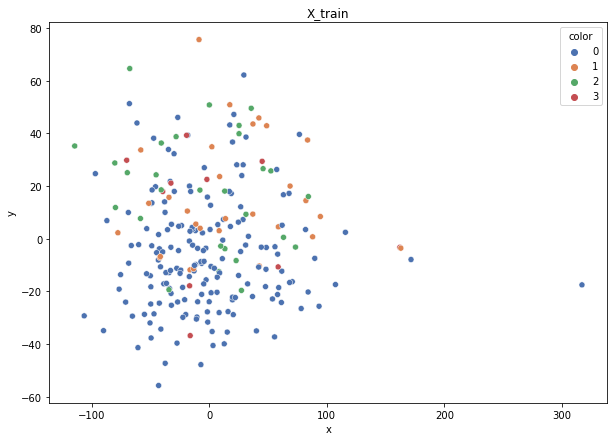

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


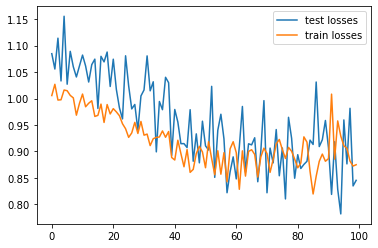

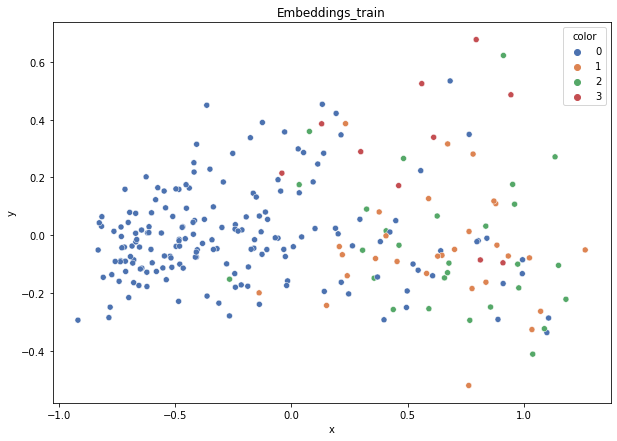

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.398
DT-f1-old+new-features: 0.342
DT-f1-old-features: 0.295
DT-gmean-new-features: 0.103
DT-gmean-old+new-features: 0.092
DT-gmean-old-features: 0.075
DT-minority_gmean-new-features: 0.019
DT-minority_gmean-old+new-features: 0.017
DT-minority_gmean-old-features: 0.014
KNN-f1-new-features: 0.374
KNN-f1-old+new-features: 0.356
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.092
KNN-gmean-old+new-features: 0.079
KNN-gmean-old-features: 0.079
KNN-minority_gmean-new-features: 0.017
KNN-minority_gmean-old+new-features: 0.014
KNN-minority_gmean-old-features: 0.014
LDA-f1-new-features: 0.298
LDA-f1-old+new-features: 0.349
LDA-f1-old-features: 0.377
LDA-gmean-new-features: 0.023
LDA-gmean-old+new-features: 0.026
LDA-gmean-old-features: 0.098
LDA-minority_gmean-new-features: 0.004
LDA-minority_gmean-old+new-features: 0.005
LDA-minority_gmean-old-features: 0.018
QDA-f1-new-features: 0.369
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.351
QDA-gmean-new-features: 0

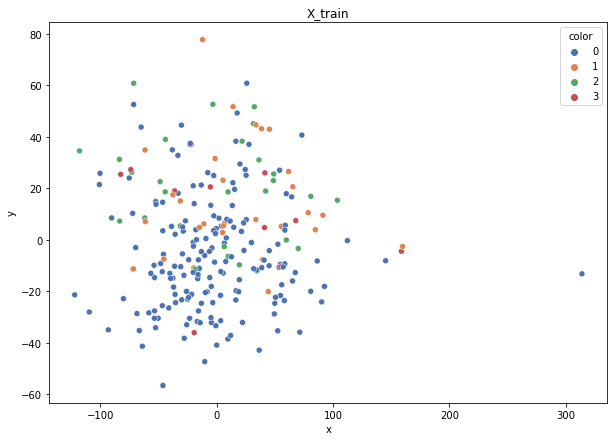

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


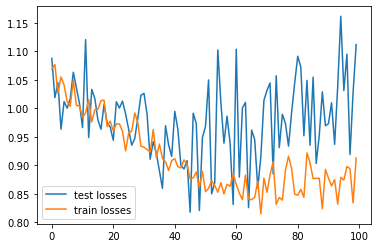

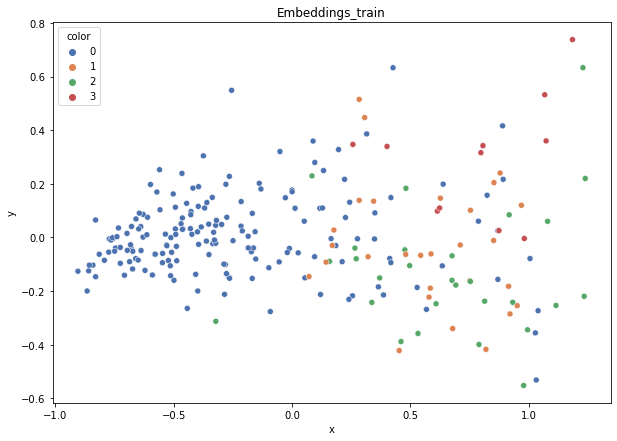

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.425
DT-f1-old+new-features: 0.271
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.113
DT-gmean-old+new-features: 0.022
DT-gmean-old-features: 0.018
DT-minority_gmean-new-features: 0.021
DT-minority_gmean-old+new-features: 0.004
DT-minority_gmean-old-features: 0.003
KNN-f1-new-features: 0.37
KNN-f1-old+new-features: 0.283
KNN-f1-old-features: 0.283
KNN-gmean-new-features: 0.086
KNN-gmean-old+new-features: 0.022
KNN-gmean-old-features: 0.022
KNN-minority_gmean-new-features: 0.016
KNN-minority_gmean-old+new-features: 0.004
KNN-minority_gmean-old-features: 0.004
LDA-f1-new-features: 0.384
LDA-f1-old+new-features: 0.429
LDA-f1-old-features: 0.301
LDA-gmean-new-features: 0.087
LDA-gmean-old+new-features: 0.103
LDA-gmean-old-features: 0.023
LDA-minority_gmean-new-features: 0.016
LDA-minority_gmean-old+new-features: 0.019
LDA-minority_gmean-old-features: 0.004
QDA-f1-new-features: 0.315
QDA-f1-old+new-features: 0.212
QDA-f1-old-features: 0.413
QDA-gmean-new-features: 0

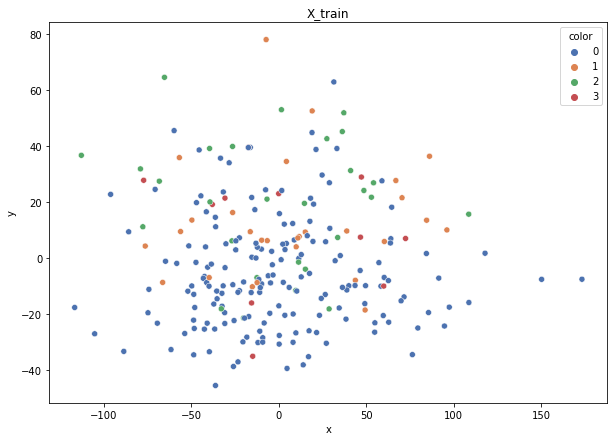

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


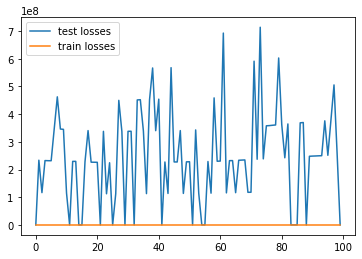

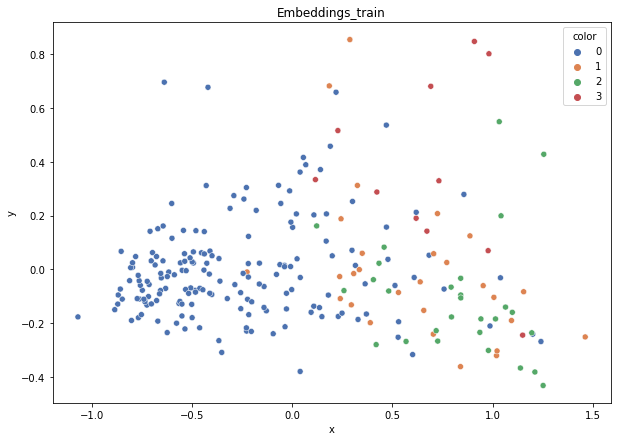

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.371
DT-f1-old+new-features: 0.4
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.347
DT-gmean-old+new-features: 0.384
DT-gmean-old-features: 0.092
DT-minority_gmean-new-features: 0.065
DT-minority_gmean-old+new-features: 0.072
DT-minority_gmean-old-features: 0.018
KNN-f1-new-features: 0.263
KNN-f1-old+new-features: 0.367
KNN-f1-old-features: 0.37
KNN-gmean-new-features: 0.021
KNN-gmean-old+new-features: 0.096
KNN-gmean-old-features: 0.096
KNN-minority_gmean-new-features: 0.004
KNN-minority_gmean-old+new-features: 0.018
KNN-minority_gmean-old-features: 0.018
LDA-f1-new-features: 0.38
LDA-f1-old+new-features: 0.421
LDA-f1-old-features: 0.467
LDA-gmean-new-features: 0.345
LDA-gmean-old+new-features: 0.45
LDA-gmean-old-features: 0.463
LDA-minority_gmean-new-features: 0.065
LDA-minority_gmean-old+new-features: 0.086
LDA-minority_gmean-old-features: 0.086
QDA-f1-new-features: 0.316
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.301
QDA-gmean-new-features: 0.074

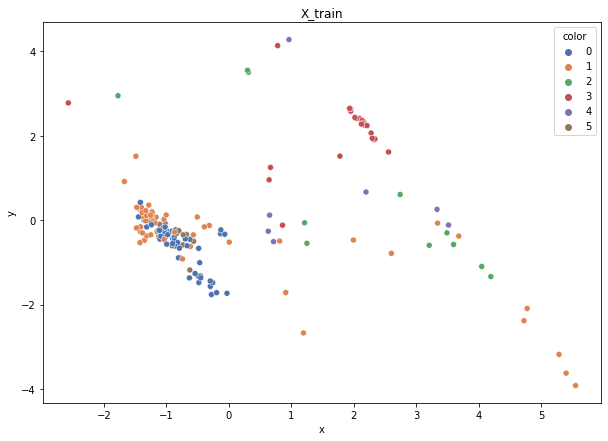

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


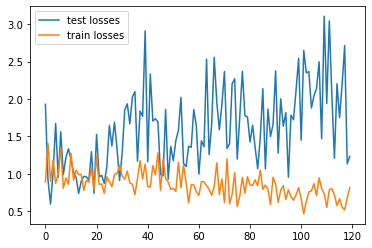

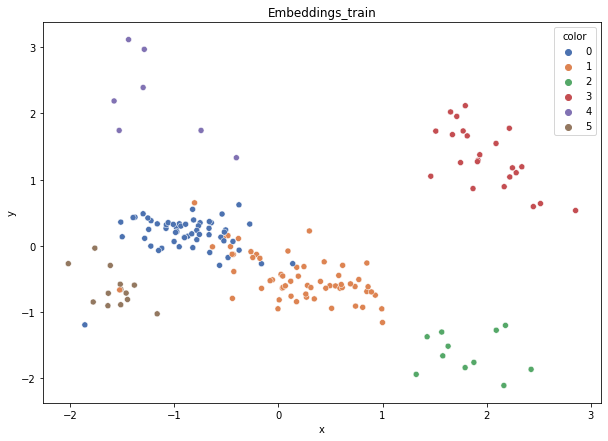

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.578
DT-f1-old+new-features: 0.57
DT-f1-old-features: 0.711
DT-gmean-new-features: 0.567
DT-gmean-old+new-features: 0.563
DT-gmean-old-features: 0.742
DT-minority_gmean-new-features: 0.042
DT-minority_gmean-old+new-features: 0.042
DT-minority_gmean-old-features: 0.165
KNN-f1-new-features: 0.597
KNN-f1-old+new-features: 0.738
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.222
KNN-gmean-old+new-features: 0.701
KNN-gmean-old-features: 0.701
KNN-minority_gmean-new-features: 0.008
KNN-minority_gmean-old+new-features: 0.048
KNN-minority_gmean-old-features: 0.048
LDA-f1-new-features: 0.757
LDA-f1-old+new-features: 0.692
LDA-f1-old-features: 0.551
LDA-gmean-new-features: 0.711
LDA-gmean-old+new-features: 0.633
LDA-gmean-old-features: 0.088
LDA-minority_gmean-new-features: 0.048
LDA-minority_gmean-old+new-features: 0.042
LDA-minority_gmean-old-features: 0.004
QDA-f1-new-features: 0.379
QDA-f1-old+new-features: 0.369
QDA-f1-old-features: 0.388
QDA-gmean-new-features: 0

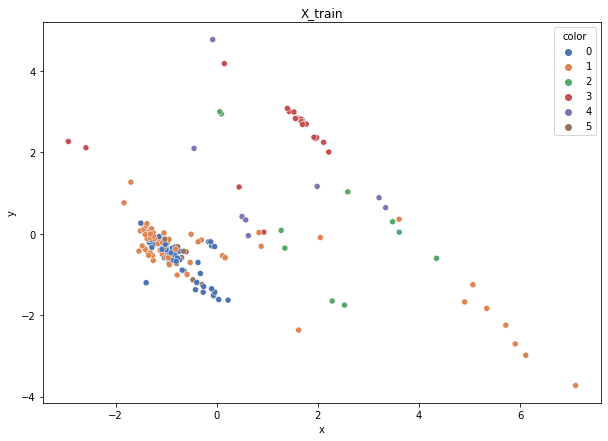

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


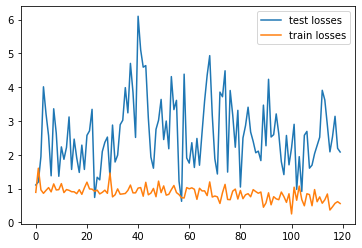

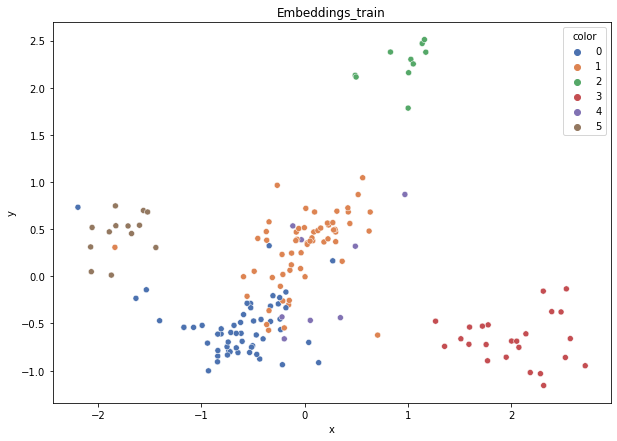

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.476
DT-f1-old+new-features: 0.476
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.188
DT-gmean-old+new-features: 0.188
DT-gmean-old-features: 0.232
DT-minority_gmean-new-features: 0.007
DT-minority_gmean-old+new-features: 0.007
DT-minority_gmean-old-features: 0.008
KNN-f1-new-features: 0.655
KNN-f1-old+new-features: 0.68
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.632
KNN-gmean-old+new-features: 0.663
KNN-gmean-old-features: 0.557
KNN-minority_gmean-new-features: 0.023
KNN-minority_gmean-old+new-features: 0.023
KNN-minority_gmean-old-features: 0.021
LDA-f1-new-features: 0.658
LDA-f1-old+new-features: 0.67
LDA-f1-old-features: 0.425
LDA-gmean-new-features: 0.654
LDA-gmean-old+new-features: 0.654
LDA-gmean-old-features: 0.072
LDA-minority_gmean-new-features: 0.023
LDA-minority_gmean-old+new-features: 0.023
LDA-minority_gmean-old-features: 0.003
QDA-f1-new-features: 0.363
QDA-f1-old+new-features: 0.363
QDA-f1-old-features: 0.369
QDA-gmean-new-features: 0.0

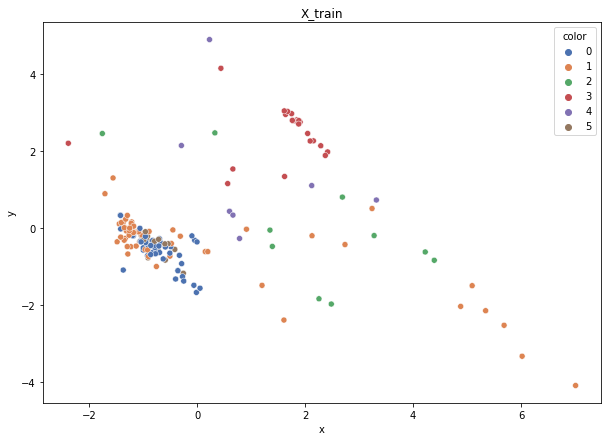

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


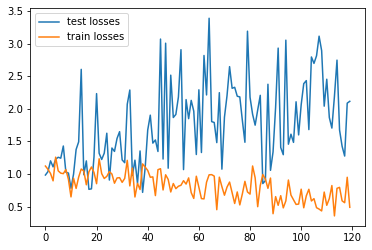

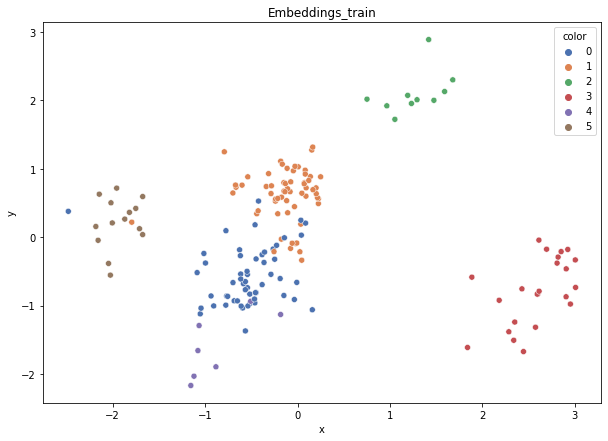

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.63
DT-f1-old+new-features: 0.641
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.24
DT-gmean-old+new-features: 0.245
DT-gmean-old-features: 0.25
DT-minority_gmean-new-features: 0.014
DT-minority_gmean-old+new-features: 0.014
DT-minority_gmean-old-features: 0.032
KNN-f1-new-features: 0.686
KNN-f1-old+new-features: 0.739
KNN-f1-old-features: 0.661
KNN-gmean-new-features: 0.632
KNN-gmean-old+new-features: 0.648
KNN-gmean-old-features: 0.246
KNN-minority_gmean-new-features: 0.114
KNN-minority_gmean-old+new-features: 0.114
KNN-minority_gmean-old-features: 0.014
LDA-f1-new-features: 0.755
LDA-f1-old+new-features: 0.714
LDA-f1-old-features: 0.575
LDA-gmean-new-features: 0.709
LDA-gmean-old+new-features: 0.632
LDA-gmean-old-features: 0.233
LDA-minority_gmean-new-features: 0.135
LDA-minority_gmean-old+new-features: 0.044
LDA-minority_gmean-old-features: 0.014
QDA-f1-new-features: 0.34
QDA-f1-old+new-features: 0.351
QDA-f1-old-features: 0.587
QDA-gmean-new-features: 0.02

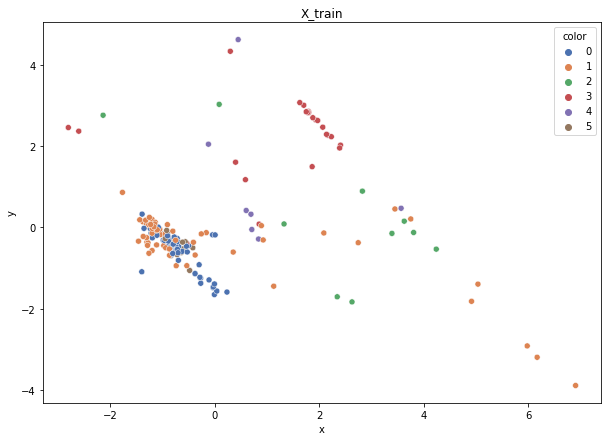

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


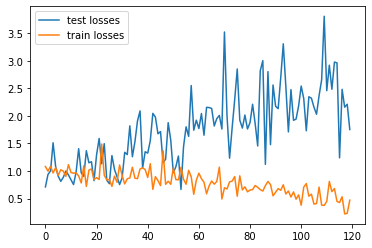

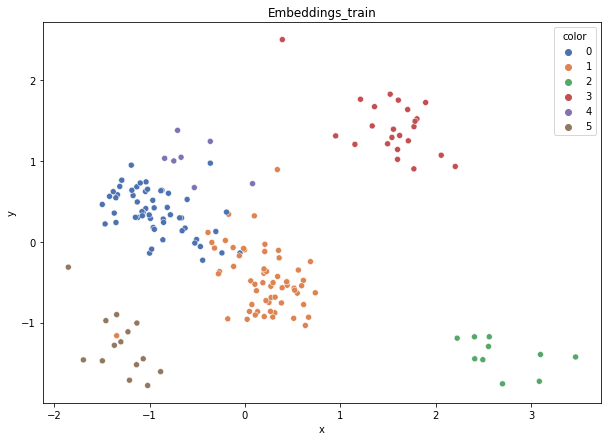

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.697
DT-f1-old+new-features: 0.697
DT-f1-old-features: 0.646
DT-gmean-new-features: 0.621
DT-gmean-old+new-features: 0.621
DT-gmean-old-features: 0.681
DT-minority_gmean-new-features: 0.022
DT-minority_gmean-old+new-features: 0.022
DT-minority_gmean-old-features: 0.161
KNN-f1-new-features: 0.695
KNN-f1-old+new-features: 0.717
KNN-f1-old-features: 0.641
KNN-gmean-new-features: 0.609
KNN-gmean-old+new-features: 0.629
KNN-gmean-old-features: 0.587
KNN-minority_gmean-new-features: 0.041
KNN-minority_gmean-old+new-features: 0.041
KNN-minority_gmean-old-features: 0.041
LDA-f1-new-features: 0.707
LDA-f1-old+new-features: 0.707
LDA-f1-old-features: 0.517
LDA-gmean-new-features: 0.621
LDA-gmean-old+new-features: 0.621
LDA-gmean-old-features: 0.196
LDA-minority_gmean-new-features: 0.041
LDA-minority_gmean-old+new-features: 0.041
LDA-minority_gmean-old-features: 0.011
QDA-f1-new-features: 0.39
QDA-f1-old+new-features: 0.38
QDA-f1-old-features: 0.571
QDA-gmean-new-features: 0.

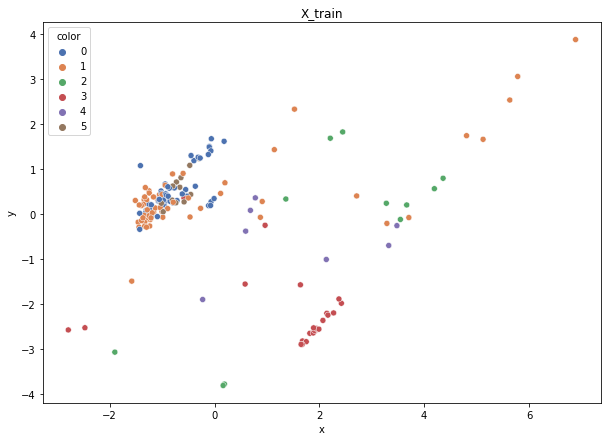

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


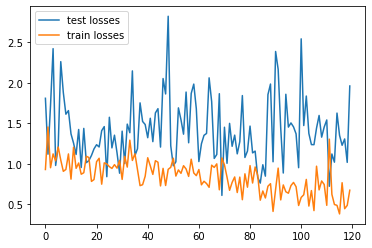

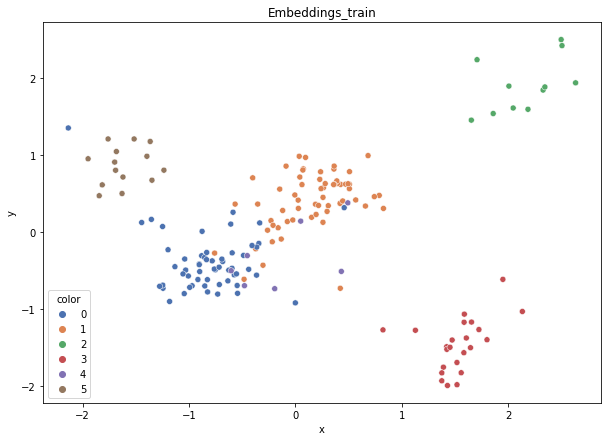

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.683
DT-f1-old+new-features: 0.706
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.635
DT-gmean-old+new-features: 0.656
DT-gmean-old-features: 0.737
DT-minority_gmean-new-features: 0.114
DT-minority_gmean-old+new-features: 0.114
DT-minority_gmean-old-features: 0.051
KNN-f1-new-features: 0.815
KNN-f1-old+new-features: 0.72
KNN-f1-old-features: 0.678
KNN-gmean-new-features: 0.771
KNN-gmean-old+new-features: 0.704
KNN-gmean-old-features: 0.681
KNN-minority_gmean-new-features: 0.051
KNN-minority_gmean-old+new-features: 0.051
KNN-minority_gmean-old-features: 0.051
LDA-f1-new-features: 0.793
LDA-f1-old+new-features: 0.793
LDA-f1-old-features: 0.55
LDA-gmean-new-features: 0.76
LDA-gmean-old+new-features: 0.76
LDA-gmean-old-features: 0.222
LDA-minority_gmean-new-features: 0.135
LDA-minority_gmean-old+new-features: 0.051
LDA-minority_gmean-old-features: 0.008
QDA-f1-new-features: 0.398
QDA-f1-old+new-features: 0.357
QDA-f1-old-features: 0.553
QDA-gmean-new-features: 0.029

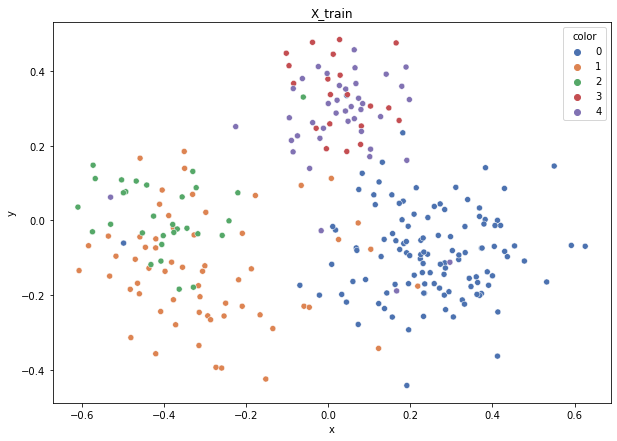

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


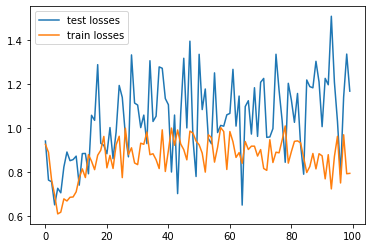

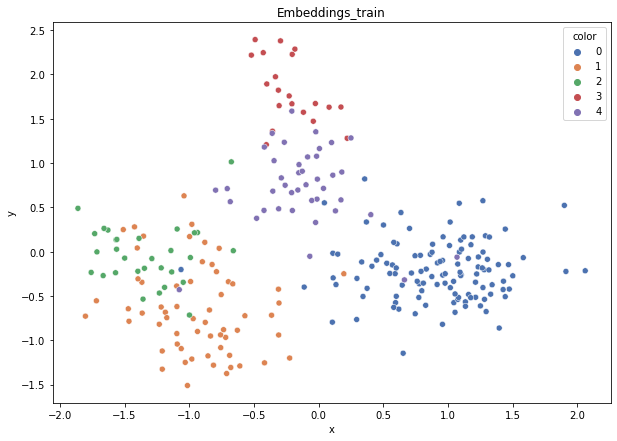

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.73
DT-f1-old+new-features: 0.719
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.685
DT-gmean-old+new-features: 0.68
DT-gmean-old-features: 0.537
DT-minority_gmean-new-features: 0.048
DT-minority_gmean-old+new-features: 0.048
DT-minority_gmean-old-features: 0.04
KNN-f1-new-features: 0.809
KNN-f1-old+new-features: 0.799
KNN-f1-old-features: 0.749
KNN-gmean-new-features: 0.793
KNN-gmean-old+new-features: 0.786
KNN-gmean-old-features: 0.719
KNN-minority_gmean-new-features: 0.055
KNN-minority_gmean-old+new-features: 0.155
KNN-minority_gmean-old-features: 0.05
LDA-f1-new-features: 0.768
LDA-f1-old+new-features: 0.754
LDA-f1-old-features: 0.809
LDA-gmean-new-features: 0.749
LDA-gmean-old+new-features: 0.733
LDA-gmean-old-features: 0.791
LDA-minority_gmean-new-features: 0.052
LDA-minority_gmean-old+new-features: 0.052
LDA-minority_gmean-old-features: 0.056
QDA-f1-new-features: 0.787
QDA-f1-old+new-features: 0.59
QDA-f1-old-features: 0.287
QDA-gmean-new-features: 0.757

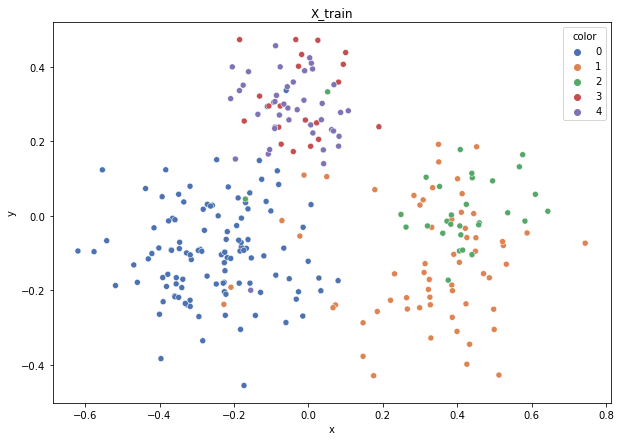

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


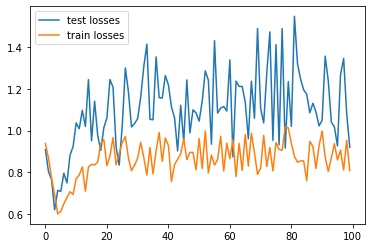

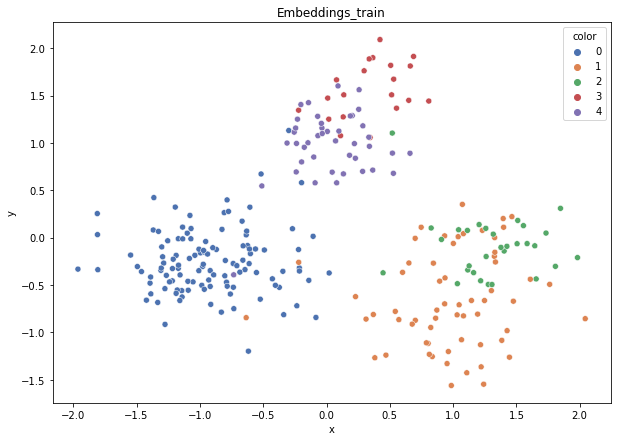

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.78
DT-f1-old+new-features: 0.809
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.753
DT-gmean-old+new-features: 0.792
DT-gmean-old-features: 0.688
DT-minority_gmean-new-features: 0.05
DT-minority_gmean-old+new-features: 0.053
DT-minority_gmean-old-features: 0.049
KNN-f1-new-features: 0.788
KNN-f1-old+new-features: 0.733
KNN-f1-old-features: 0.728
KNN-gmean-new-features: 0.781
KNN-gmean-old+new-features: 0.706
KNN-gmean-old-features: 0.709
KNN-minority_gmean-new-features: 0.053
KNN-minority_gmean-old+new-features: 0.049
KNN-minority_gmean-old-features: 0.051
LDA-f1-new-features: 0.853
LDA-f1-old+new-features: 0.853
LDA-f1-old-features: 0.853
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.84
LDA-minority_gmean-new-features: 0.054
LDA-minority_gmean-old+new-features: 0.054
LDA-minority_gmean-old-features: 0.054
QDA-f1-new-features: 0.817
QDA-f1-old+new-features: 0.512
QDA-f1-old-features: 0.494
QDA-gmean-new-features: 0.804

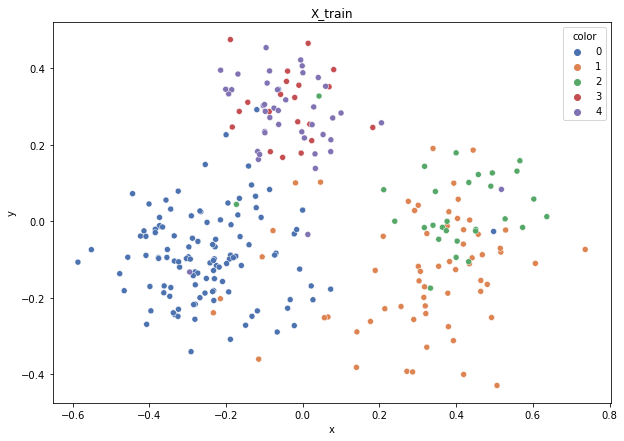

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


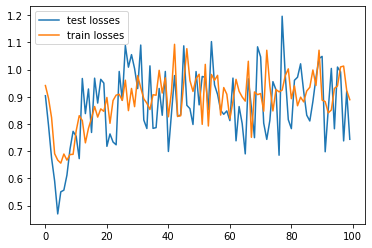

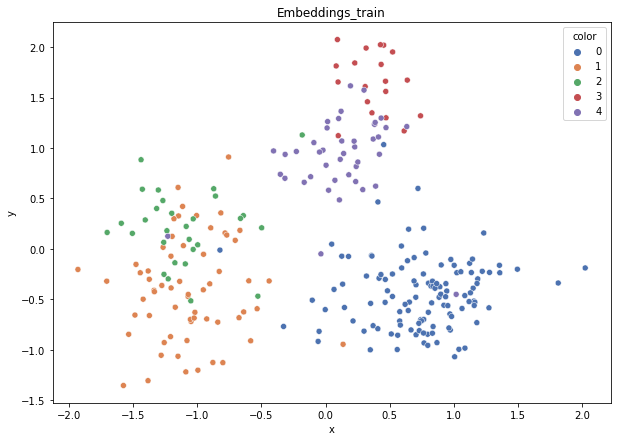

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.789
DT-f1-old+new-features: 0.809
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.764
DT-gmean-old+new-features: 0.793
DT-gmean-old-features: 0.69
DT-minority_gmean-new-features: 0.051
DT-minority_gmean-old+new-features: 0.053
DT-minority_gmean-old-features: 0.046
KNN-f1-new-features: 0.875
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.846
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
KNN-minority_gmean-new-features: 0.055
KNN-minority_gmean-old+new-features: 0.053
KNN-minority_gmean-old-features: 0.053
LDA-f1-new-features: 0.906
LDA-f1-old+new-features: 0.915
LDA-f1-old-features: 0.872
LDA-gmean-new-features: 0.905
LDA-gmean-old+new-features: 0.913
LDA-gmean-old-features: 0.852
LDA-minority_gmean-new-features: 0.06
LDA-minority_gmean-old+new-features: 0.06
LDA-minority_gmean-old-features: 0.056
QDA-f1-new-features: 0.847
QDA-f1-old+new-features: 0.617
QDA-f1-old-features: 0.176
QDA-gmean-new-features: 0.8

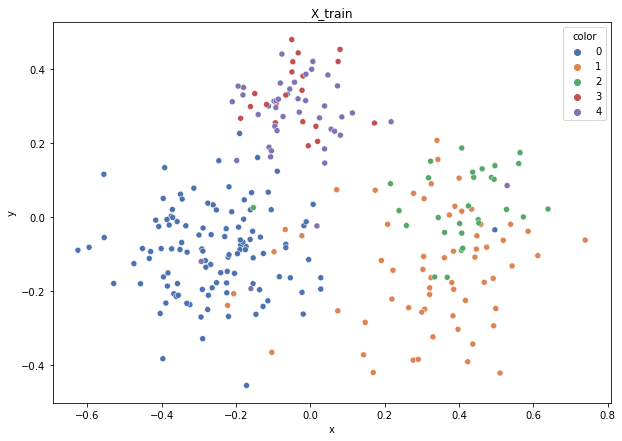

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


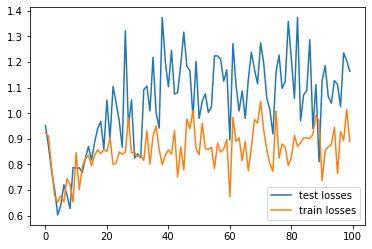

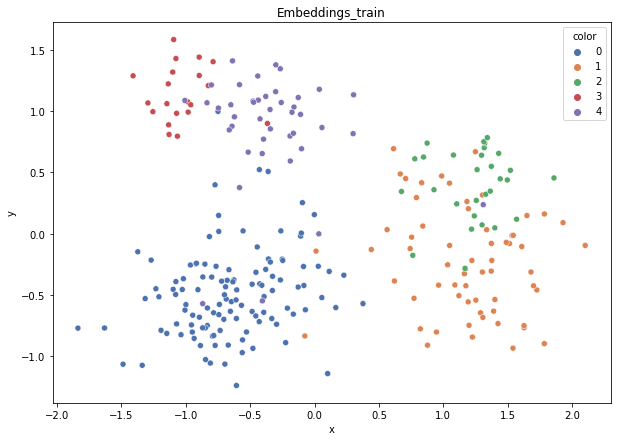

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.661
DT-f1-old+new-features: 0.682
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.625
DT-gmean-old+new-features: 0.634
DT-gmean-old-features: 0.606
DT-minority_gmean-new-features: 0.043
DT-minority_gmean-old+new-features: 0.043
DT-minority_gmean-old-features: 0.105
KNN-f1-new-features: 0.75
KNN-f1-old+new-features: 0.805
KNN-f1-old-features: 0.817
KNN-gmean-new-features: 0.676
KNN-gmean-old+new-features: 0.777
KNN-gmean-old-features: 0.782
KNN-minority_gmean-new-features: 0.046
KNN-minority_gmean-old+new-features: 0.053
KNN-minority_gmean-old-features: 0.053
LDA-f1-new-features: 0.804
LDA-f1-old+new-features: 0.79
LDA-f1-old-features: 0.74
LDA-gmean-new-features: 0.801
LDA-gmean-old+new-features: 0.739
LDA-gmean-old-features: 0.718
LDA-minority_gmean-new-features: 0.146
LDA-minority_gmean-old+new-features: 0.05
LDA-minority_gmean-old-features: 0.128
QDA-f1-new-features: 0.762
QDA-f1-old+new-features: 0.636
QDA-f1-old-features: 0.328
QDA-gmean-new-features: 0.74

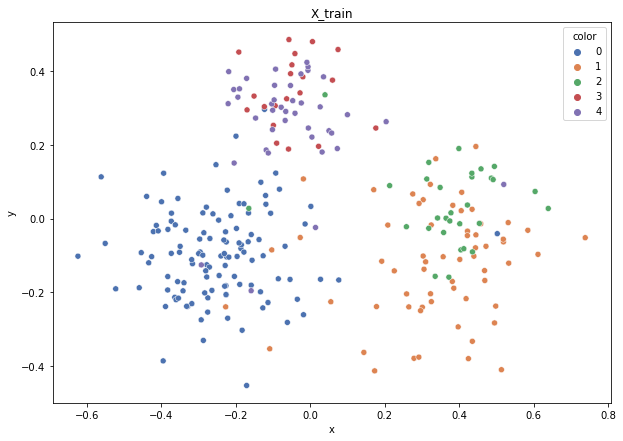

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


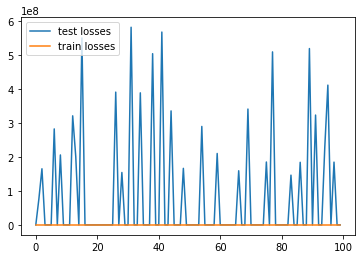

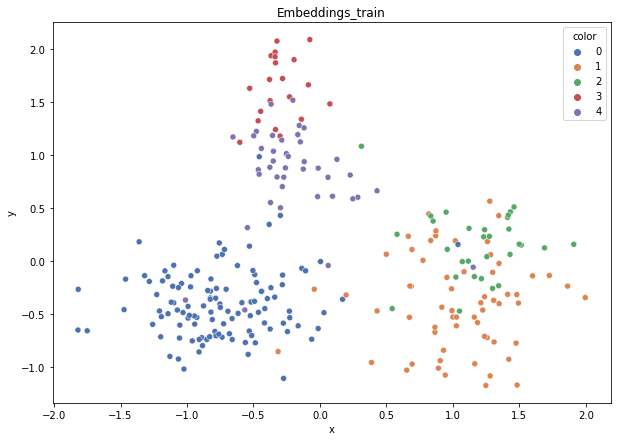

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.798
DT-f1-old+new-features: 0.783
DT-f1-old-features: 0.793
DT-gmean-new-features: 0.803
DT-gmean-old+new-features: 0.797
DT-gmean-old-features: 0.822
DT-minority_gmean-new-features: 0.151
DT-minority_gmean-old+new-features: 0.151
DT-minority_gmean-old-features: 0.155
KNN-f1-new-features: 0.847
KNN-f1-old+new-features: 0.82
KNN-f1-old-features: 0.808
KNN-gmean-new-features: 0.834
KNN-gmean-old+new-features: 0.827
KNN-gmean-old-features: 0.84
KNN-minority_gmean-new-features: 0.155
KNN-minority_gmean-old+new-features: 0.151
KNN-minority_gmean-old-features: 0.155
LDA-f1-new-features: 0.852
LDA-f1-old+new-features: 0.798
LDA-f1-old-features: 0.86
LDA-gmean-new-features: 0.871
LDA-gmean-old+new-features: 0.797
LDA-gmean-old-features: 0.873
LDA-minority_gmean-new-features: 0.16
LDA-minority_gmean-old+new-features: 0.143
LDA-minority_gmean-old-features: 0.163
QDA-f1-new-features: 0.853
QDA-f1-old+new-features: 0.411
QDA-f1-old-features: 0.333
QDA-gmean-new-features: 0.85

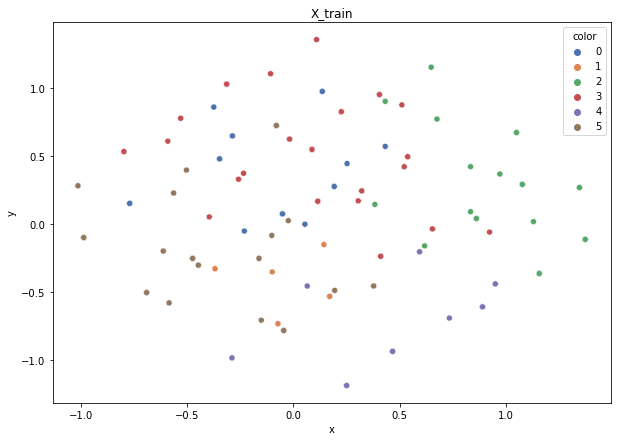

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


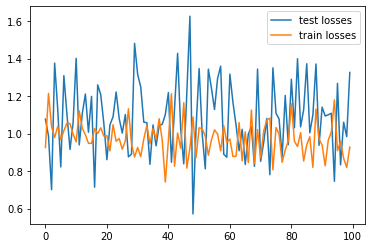

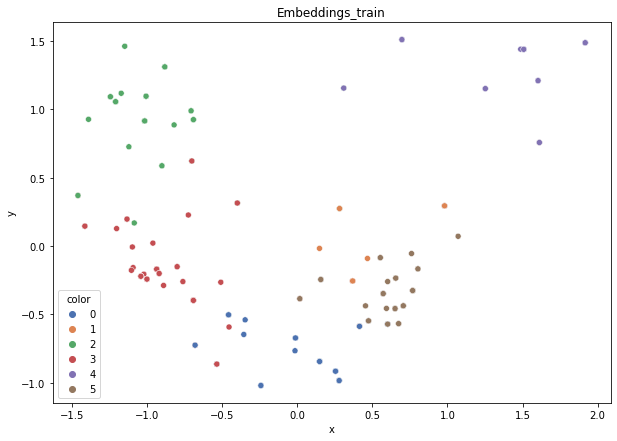

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.789
DT-f1-old+new-features: 0.806
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.787
DT-gmean-old+new-features: 0.803
DT-gmean-old-features: 0.797
DT-minority_gmean-new-features: 0.014
DT-minority_gmean-old+new-features: 0.014
DT-minority_gmean-old-features: 0.014
KNN-f1-new-features: 0.755
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.741
KNN-gmean-new-features: 0.725
KNN-gmean-old+new-features: 0.712
KNN-gmean-old-features: 0.719
KNN-minority_gmean-new-features: 0.008
KNN-minority_gmean-old+new-features: 0.008
KNN-minority_gmean-old-features: 0.008
LDA-f1-new-features: 0.793
LDA-f1-old+new-features: 0.793
LDA-f1-old-features: 0.804
LDA-gmean-new-features: 0.79
LDA-gmean-old+new-features: 0.79
LDA-gmean-old-features: 0.806
LDA-minority_gmean-new-features: 0.014
LDA-minority_gmean-old+new-features: 0.014
LDA-minority_gmean-old-features: 0.014
QDA-f1-new-features: 0.782
QDA-f1-old+new-features: 0.688
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.

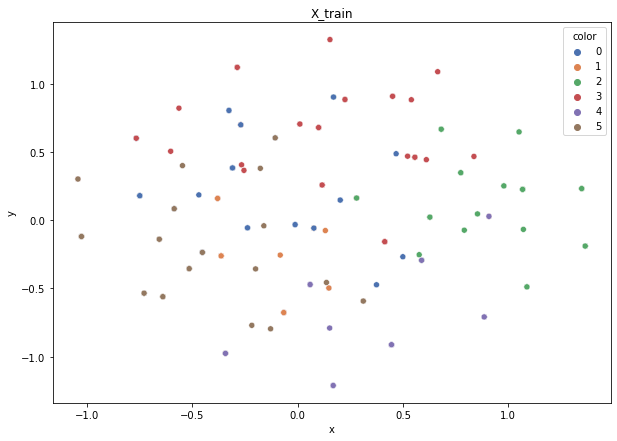

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


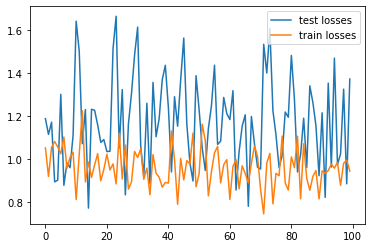

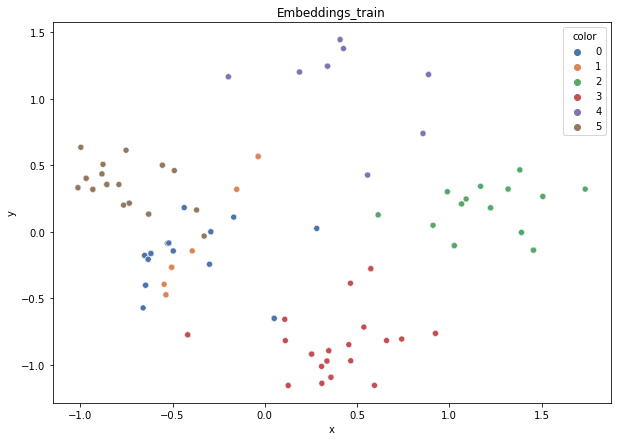

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.735
DT-f1-old+new-features: 0.735
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.706
DT-gmean-old+new-features: 0.706
DT-gmean-old-features: 0.755
DT-minority_gmean-new-features: 0.008
DT-minority_gmean-old+new-features: 0.008
DT-minority_gmean-old-features: 0.008
KNN-f1-new-features: 0.77
KNN-f1-old+new-features: 0.672
KNN-f1-old-features: 0.692
KNN-gmean-new-features: 0.689
KNN-gmean-old+new-features: 0.277
KNN-gmean-old-features: 0.283
KNN-minority_gmean-new-features: 0.011
KNN-minority_gmean-old+new-features: 0.004
KNN-minority_gmean-old-features: 0.004
LDA-f1-new-features: 0.776
LDA-f1-old+new-features: 0.776
LDA-f1-old-features: 0.756
LDA-gmean-new-features: 0.747
LDA-gmean-old+new-features: 0.747
LDA-gmean-old-features: 0.729
LDA-minority_gmean-new-features: 0.008
LDA-minority_gmean-old+new-features: 0.008
LDA-minority_gmean-old-features: 0.008
QDA-f1-new-features: 0.729
QDA-f1-old+new-features: 0.602
QDA-f1-old-features: 0.745
QDA-gmean-new-features: 0

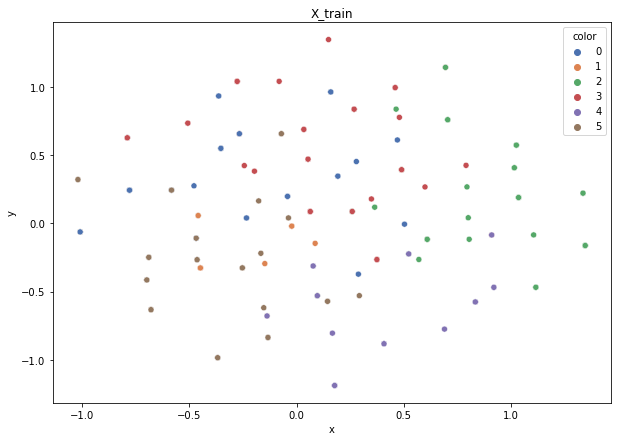

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


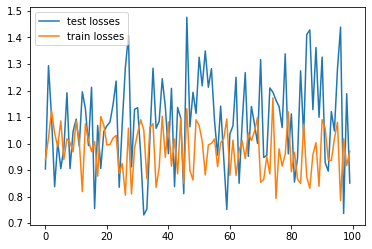

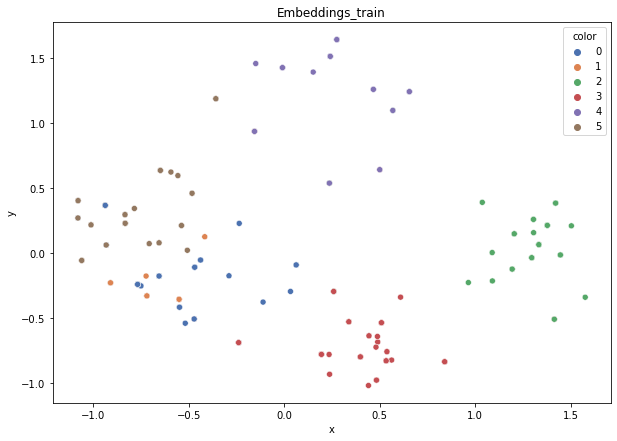

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.784
DT-f1-old+new-features: 0.784
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.785
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.783
DT-minority_gmean-new-features: 0.081
DT-minority_gmean-old+new-features: 0.081
DT-minority_gmean-old-features: 0.081
KNN-f1-new-features: 0.664
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.739
KNN-gmean-new-features: 0.55
KNN-gmean-old+new-features: 0.731
KNN-gmean-old-features: 0.739
KNN-minority_gmean-new-features: 0.01
KNN-minority_gmean-old+new-features: 0.081
KNN-minority_gmean-old-features: 0.081
LDA-f1-new-features: 0.807
LDA-f1-old+new-features: 0.796
LDA-f1-old-features: 0.824
LDA-gmean-new-features: 0.807
LDA-gmean-old+new-features: 0.798
LDA-gmean-old-features: 0.824
LDA-minority_gmean-new-features: 0.084
LDA-minority_gmean-old+new-features: 0.084
LDA-minority_gmean-old-features: 0.086
QDA-f1-new-features: 0.78
QDA-f1-old+new-features: 0.597
QDA-f1-old-features: 0.769
QDA-gmean-new-features: 0.7

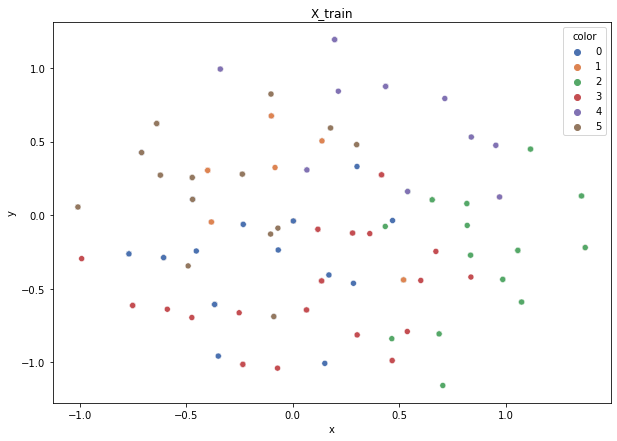

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


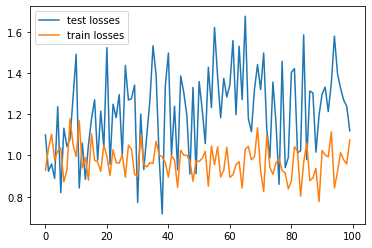

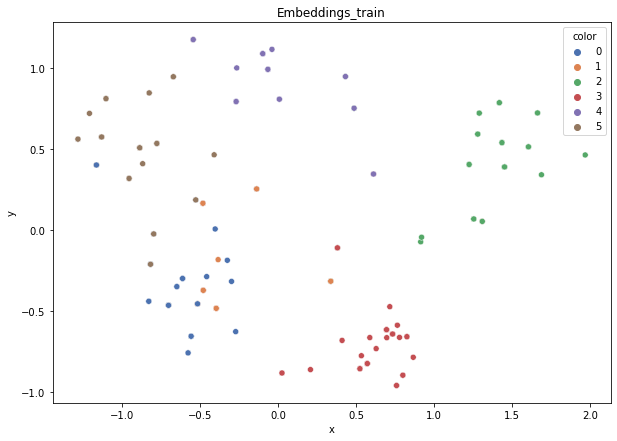

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.716
DT-f1-old+new-features: 0.716
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.701
DT-gmean-old+new-features: 0.701
DT-gmean-old-features: 0.698
DT-minority_gmean-new-features: 0.029
DT-minority_gmean-old+new-features: 0.029
DT-minority_gmean-old-features: 0.03
KNN-f1-new-features: 0.77
KNN-f1-old+new-features: 0.739
KNN-f1-old-features: 0.714
KNN-gmean-new-features: 0.753
KNN-gmean-old+new-features: 0.724
KNN-gmean-old-features: 0.704
KNN-minority_gmean-new-features: 0.014
KNN-minority_gmean-old+new-features: 0.029
KNN-minority_gmean-old-features: 0.029
LDA-f1-new-features: 0.724
LDA-f1-old+new-features: 0.744
LDA-f1-old-features: 0.784
LDA-gmean-new-features: 0.714
LDA-gmean-old+new-features: 0.742
LDA-gmean-old-features: 0.777
LDA-minority_gmean-new-features: 0.03
LDA-minority_gmean-old+new-features: 0.03
LDA-minority_gmean-old-features: 0.029
QDA-f1-new-features: 0.739
QDA-f1-old+new-features: 0.577
QDA-f1-old-features: 0.722
QDA-gmean-new-features: 0.72

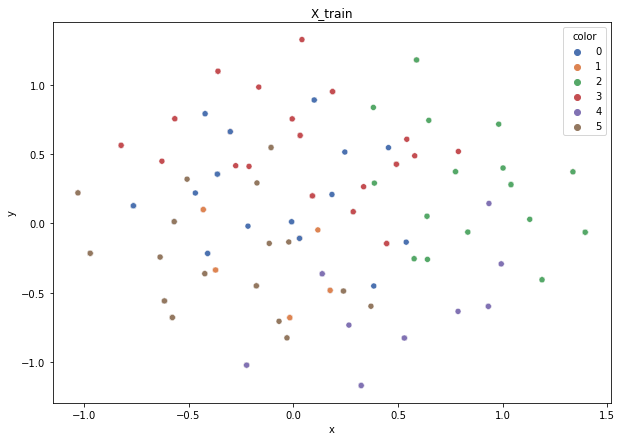

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


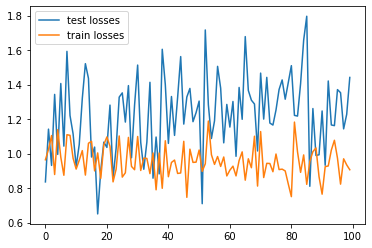

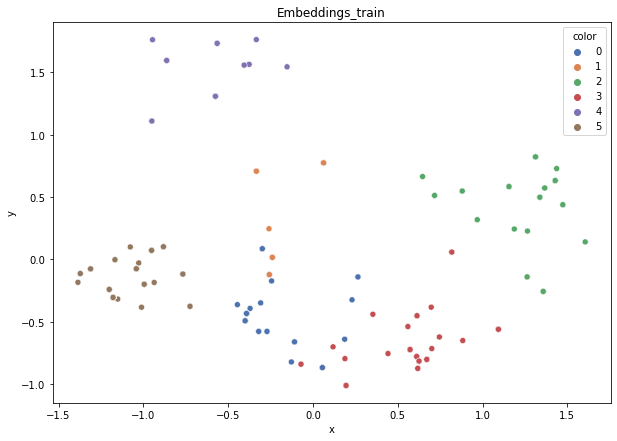

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.786
DT-f1-old+new-features: 0.768
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.788
DT-gmean-old+new-features: 0.77
DT-gmean-old-features: 0.806
DT-minority_gmean-new-features: 0.026
DT-minority_gmean-old+new-features: 0.026
DT-minority_gmean-old-features: 0.027
KNN-f1-new-features: 0.781
KNN-f1-old+new-features: 0.793
KNN-f1-old-features: 0.785
KNN-gmean-new-features: 0.776
KNN-gmean-old+new-features: 0.804
KNN-gmean-old-features: 0.796
KNN-minority_gmean-new-features: 0.025
KNN-minority_gmean-old+new-features: 0.029
KNN-minority_gmean-old-features: 0.029
LDA-f1-new-features: 0.794
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.822
LDA-gmean-new-features: 0.798
LDA-gmean-old+new-features: 0.79
LDA-gmean-old-features: 0.822
LDA-minority_gmean-new-features: 0.027
LDA-minority_gmean-old+new-features: 0.027
LDA-minority_gmean-old-features: 0.027
QDA-f1-new-features: 0.789
QDA-f1-old+new-features: 0.74
QDA-f1-old-features: 0.8
QDA-gmean-new-features: 0.788

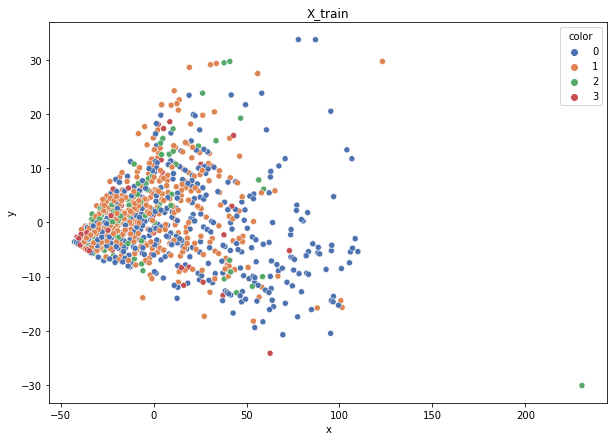

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


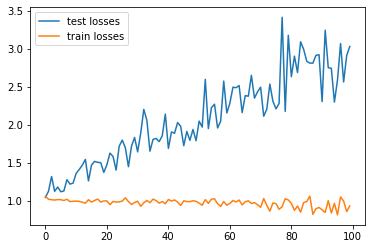

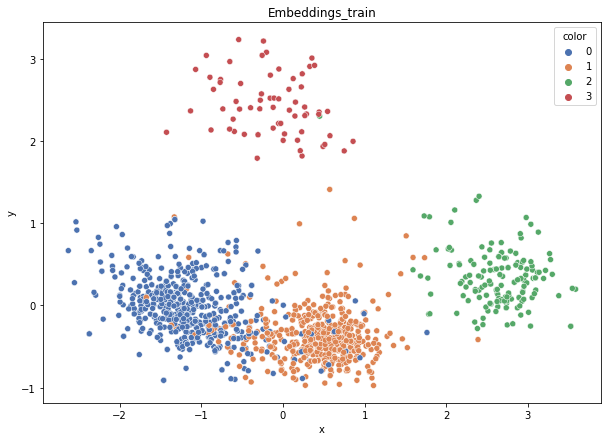

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.552
DT-f1-old+new-features: 0.55
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.482
DT-gmean-old+new-features: 0.481
DT-gmean-old-features: 0.368
DT-minority_gmean-new-features: 0.019
DT-minority_gmean-old+new-features: 0.019
DT-minority_gmean-old-features: 0.014
KNN-f1-new-features: 0.628
KNN-f1-old+new-features: 0.607
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.579
KNN-gmean-old+new-features: 0.567
KNN-gmean-old-features: 0.487
KNN-minority_gmean-new-features: 0.021
KNN-minority_gmean-old+new-features: 0.021
KNN-minority_gmean-old-features: 0.018
LDA-f1-new-features: 0.597
LDA-f1-old+new-features: 0.567
LDA-f1-old-features: 0.458
LDA-gmean-new-features: 0.566
LDA-gmean-old+new-features: 0.521
LDA-gmean-old-features: 0.328
LDA-minority_gmean-new-features: 0.021
LDA-minority_gmean-old+new-features: 0.019
LDA-minority_gmean-old-features: 0.013
QDA-f1-new-features: 0.601
QDA-f1-old+new-features: 0.614
QDA-f1-old-features: 0.403
QDA-gmean-new-features: 0

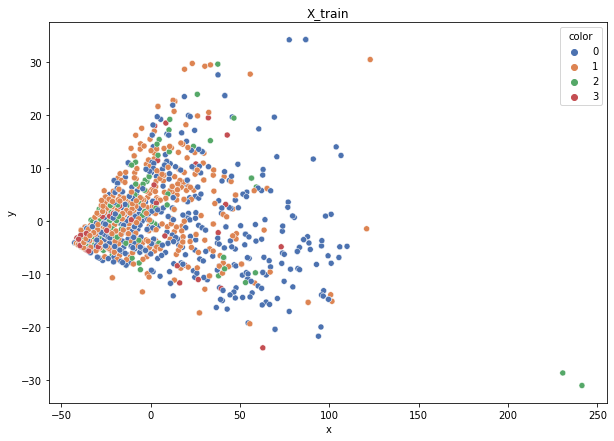

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


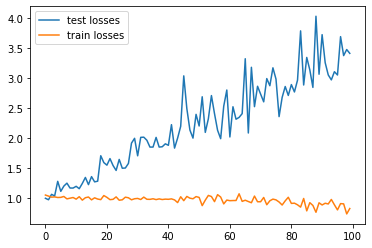

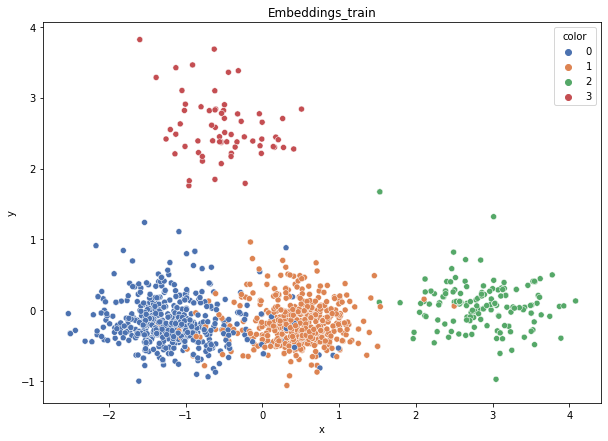

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.538
DT-f1-old+new-features: 0.537
DT-f1-old-features: 0.505
DT-gmean-new-features: 0.49
DT-gmean-old+new-features: 0.489
DT-gmean-old-features: 0.48
DT-minority_gmean-new-features: 0.019
DT-minority_gmean-old+new-features: 0.019
DT-minority_gmean-old-features: 0.019
KNN-f1-new-features: 0.539
KNN-f1-old+new-features: 0.602
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.465
KNN-gmean-old+new-features: 0.578
KNN-gmean-old-features: 0.512
KNN-minority_gmean-new-features: 0.017
KNN-minority_gmean-old+new-features: 0.022
KNN-minority_gmean-old-features: 0.02
LDA-f1-new-features: 0.566
LDA-f1-old+new-features: 0.583
LDA-f1-old-features: 0.453
LDA-gmean-new-features: 0.526
LDA-gmean-old+new-features: 0.542
LDA-gmean-old-features: 0.348
LDA-minority_gmean-new-features: 0.02
LDA-minority_gmean-old+new-features: 0.02
LDA-minority_gmean-old-features: 0.013
QDA-f1-new-features: 0.566
QDA-f1-old+new-features: 0.584
QDA-f1-old-features: 0.478
QDA-gmean-new-features: 0.535

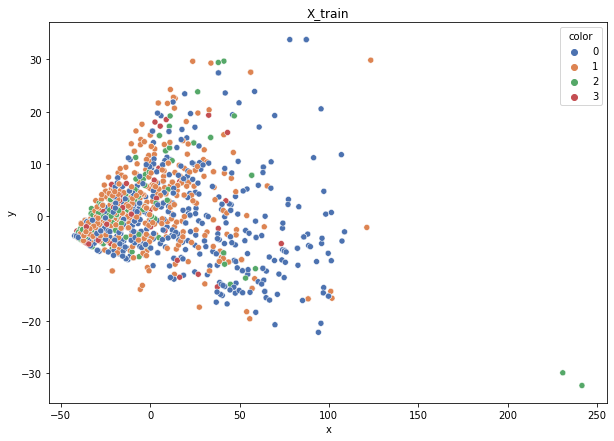

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


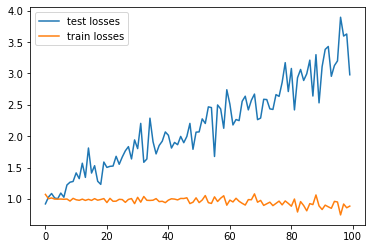

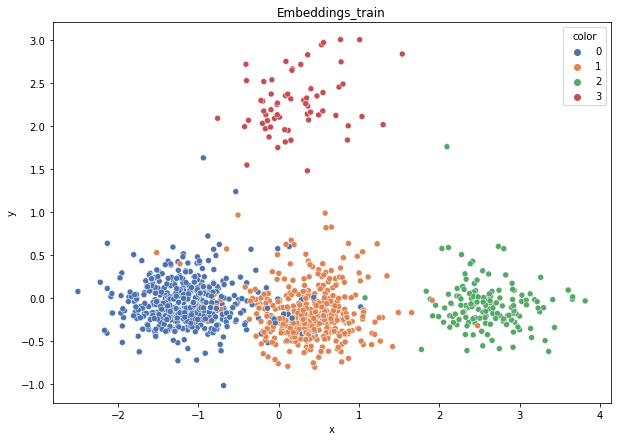

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.564
DT-f1-old+new-features: 0.563
DT-f1-old-features: 0.514
DT-gmean-new-features: 0.497
DT-gmean-old+new-features: 0.496
DT-gmean-old-features: 0.468
DT-minority_gmean-new-features: 0.019
DT-minority_gmean-old+new-features: 0.019
DT-minority_gmean-old-features: 0.019
KNN-f1-new-features: 0.567
KNN-f1-old+new-features: 0.557
KNN-f1-old-features: 0.544
KNN-gmean-new-features: 0.496
KNN-gmean-old+new-features: 0.49
KNN-gmean-old-features: 0.516
KNN-minority_gmean-new-features: 0.019
KNN-minority_gmean-old+new-features: 0.019
KNN-minority_gmean-old-features: 0.02
LDA-f1-new-features: 0.562
LDA-f1-old+new-features: 0.556
LDA-f1-old-features: 0.445
LDA-gmean-new-features: 0.496
LDA-gmean-old+new-features: 0.493
LDA-gmean-old-features: 0.321
LDA-minority_gmean-new-features: 0.019
LDA-minority_gmean-old+new-features: 0.019
LDA-minority_gmean-old-features: 0.013
QDA-f1-new-features: 0.547
QDA-f1-old+new-features: 0.547
QDA-f1-old-features: 0.42
QDA-gmean-new-features: 0.4

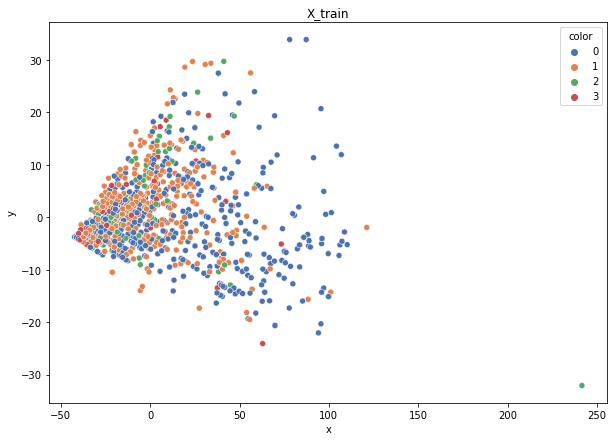

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


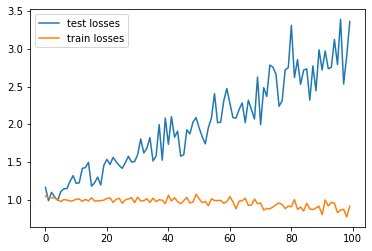

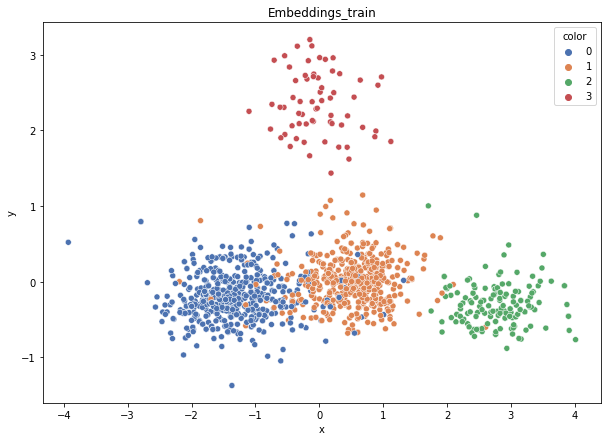

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.45
DT-f1-old+new-features: 0.473
DT-f1-old-features: 0.427
DT-gmean-new-features: 0.318
DT-gmean-old+new-features: 0.342
DT-gmean-old-features: 0.378
DT-minority_gmean-new-features: 0.012
DT-minority_gmean-old+new-features: 0.013
DT-minority_gmean-old-features: 0.015
KNN-f1-new-features: 0.475
KNN-f1-old+new-features: 0.482
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.336
KNN-gmean-old+new-features: 0.392
KNN-gmean-old-features: 0.421
KNN-minority_gmean-new-features: 0.013
KNN-minority_gmean-old+new-features: 0.015
KNN-minority_gmean-old-features: 0.016
LDA-f1-new-features: 0.46
LDA-f1-old+new-features: 0.482
LDA-f1-old-features: 0.411
LDA-gmean-new-features: 0.329
LDA-gmean-old+new-features: 0.342
LDA-gmean-old-features: 0.11
LDA-minority_gmean-new-features: 0.013
LDA-minority_gmean-old+new-features: 0.013
LDA-minority_gmean-old-features: 0.004
QDA-f1-new-features: 0.465
QDA-f1-old+new-features: 0.454
QDA-f1-old-features: 0.418
QDA-gmean-new-features: 0.3

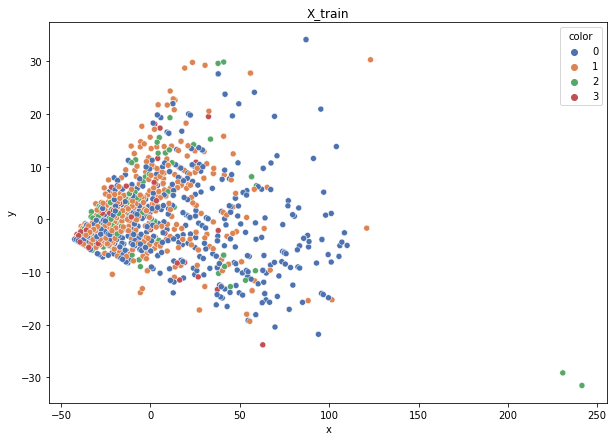

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


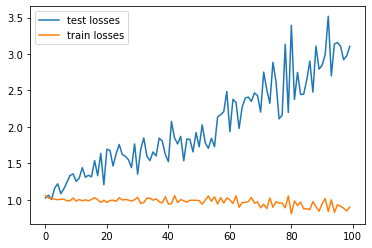

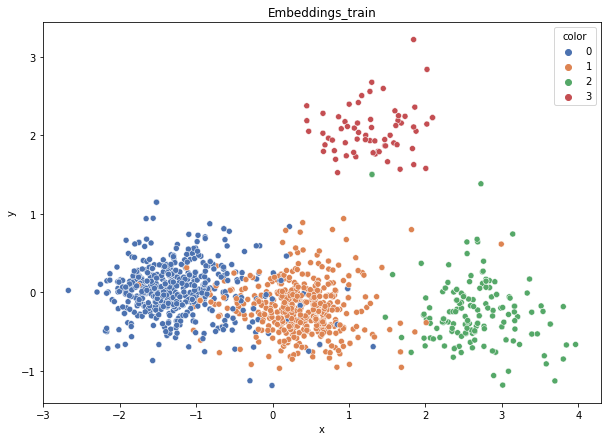

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.582
DT-f1-old+new-features: 0.542
DT-f1-old-features: 0.463
DT-gmean-new-features: 0.465
DT-gmean-old+new-features: 0.439
DT-gmean-old-features: 0.399
DT-minority_gmean-new-features: 0.017
DT-minority_gmean-old+new-features: 0.017
DT-minority_gmean-old-features: 0.017
KNN-f1-new-features: 0.554
KNN-f1-old+new-features: 0.535
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.391
KNN-gmean-old+new-features: 0.38
KNN-gmean-old-features: 0.437
KNN-minority_gmean-new-features: 0.014
KNN-minority_gmean-old+new-features: 0.014
KNN-minority_gmean-old-features: 0.017
LDA-f1-new-features: 0.587
LDA-f1-old+new-features: 0.542
LDA-f1-old-features: 0.512
LDA-gmean-new-features: 0.504
LDA-gmean-old+new-features: 0.383
LDA-gmean-old-features: 0.431
LDA-minority_gmean-new-features: 0.019
LDA-minority_gmean-old+new-features: 0.014
LDA-minority_gmean-old-features: 0.017
QDA-f1-new-features: 0.567
QDA-f1-old+new-features: 0.54
QDA-f1-old-features: 0.512
QDA-gmean-new-features: 0.

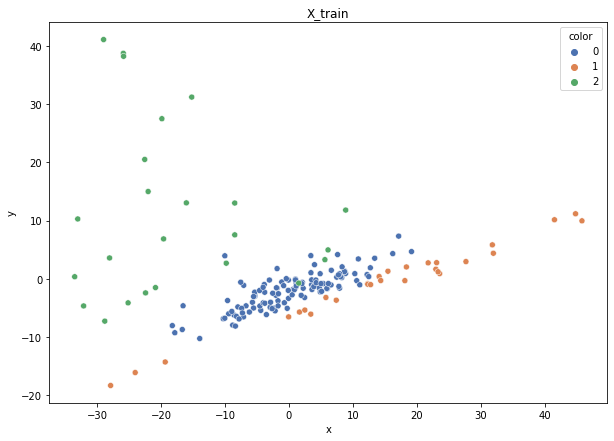

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


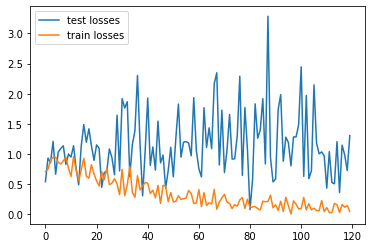

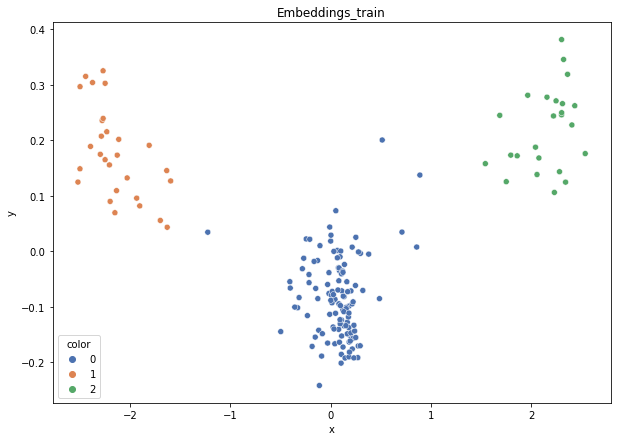

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.892
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.83
DT-gmean-old+new-features: 0.874
DT-gmean-old-features: 0.884
DT-minority_gmean-new-features: 0.083
DT-minority_gmean-old+new-features: 0.087
DT-minority_gmean-old-features: 0.089
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.964
KNN-gmean-new-features: 0.874
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
KNN-minority_gmean-new-features: 0.087
KNN-minority_gmean-old+new-features: 0.094
KNN-minority_gmean-old-features: 0.094
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.874
LDA-gmean-old-features: 0.841
LDA-minority_gmean-new-features: 0.094
LDA-minority_gmean-old+new-features: 0.087
LDA-minority_gmean-old-features: 0.084
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 1.0
Q

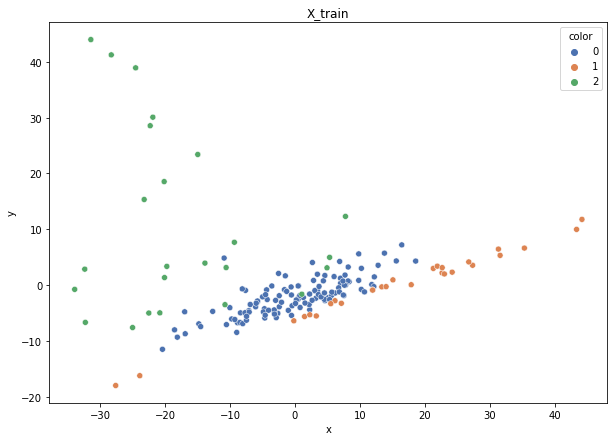

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


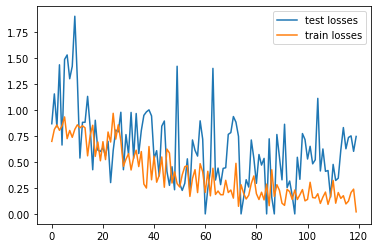

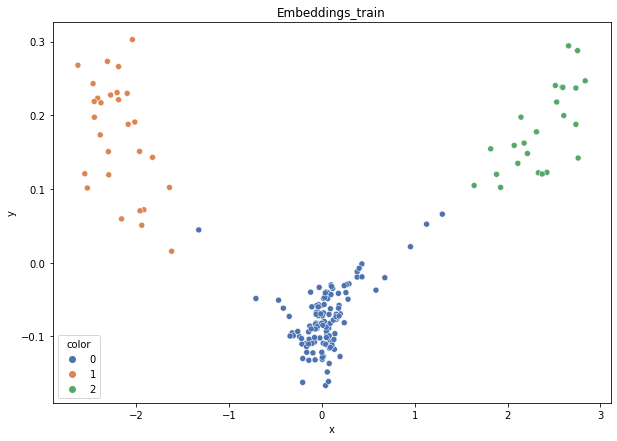

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.933
DT-f1-old+new-features: 0.933
DT-f1-old-features: 0.947
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.894
DT-gmean-old-features: 0.977
DT-minority_gmean-new-features: 0.089
DT-minority_gmean-old+new-features: 0.089
DT-minority_gmean-old-features: 1.0
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.972
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 0.95
KNN-gmean-old-features: 0.989
KNN-minority_gmean-new-features: 0.095
KNN-minority_gmean-old+new-features: 0.095
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.969
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.894
LDA-minority_gmean-new-features: 0.095
LDA-minority_gmean-old+new-features: 0.095
LDA-minority_gmean-old-features: 0.089
QDA-f1-new-features: 0.969
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.95
QDA

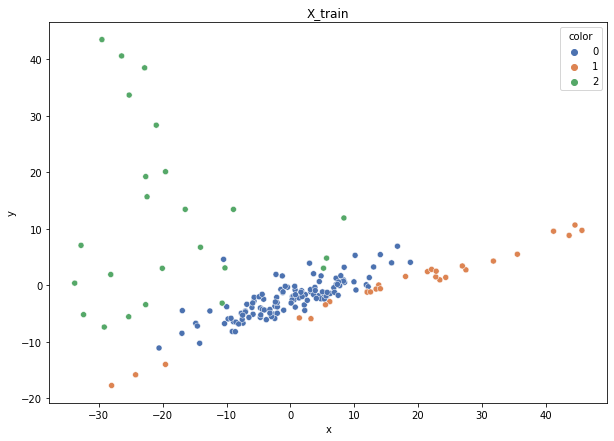

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


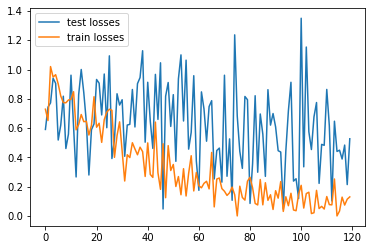

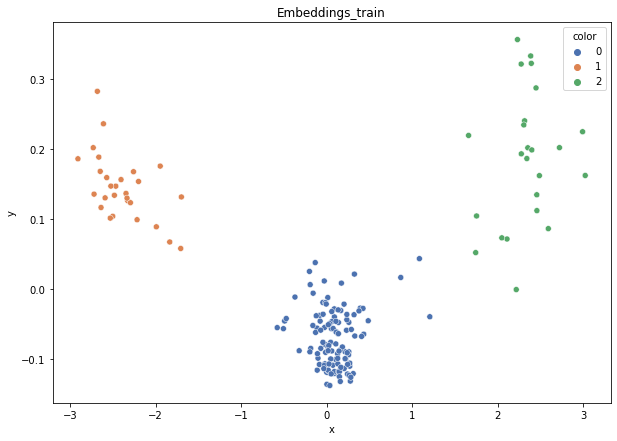

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.989
DT-gmean-old+new-features: 0.989
DT-gmean-old-features: 0.92
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 1.0
DT-minority_gmean-old-features: 0.094
KNN-f1-new-features: 0.972
KNN-f1-old+new-features: 0.936
KNN-f1-old-features: 0.902
KNN-gmean-new-features: 0.989
KNN-gmean-old+new-features: 0.93
KNN-gmean-old-features: 0.884
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 0.094
KNN-minority_gmean-old-features: 0.089
LDA-f1-new-features: 0.972
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.817
LDA-gmean-new-features: 0.989
LDA-gmean-old+new-features: 0.989
LDA-gmean-old-features: 0.725
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.072
QDA-f1-new-features: 0.972
QDA-f1-old+new-features: 0.972
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.989
QDA-gm

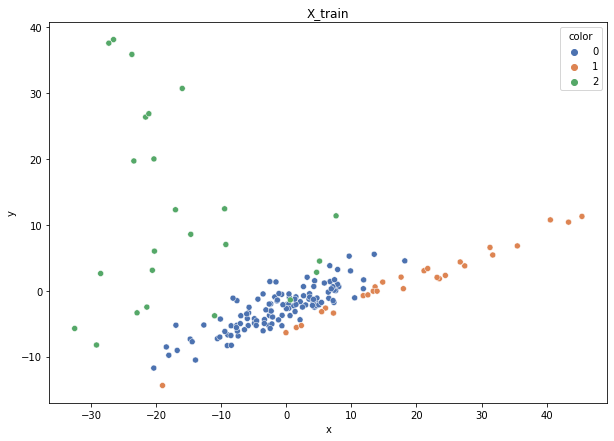

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


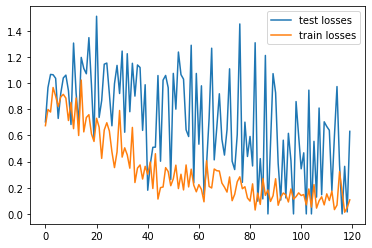

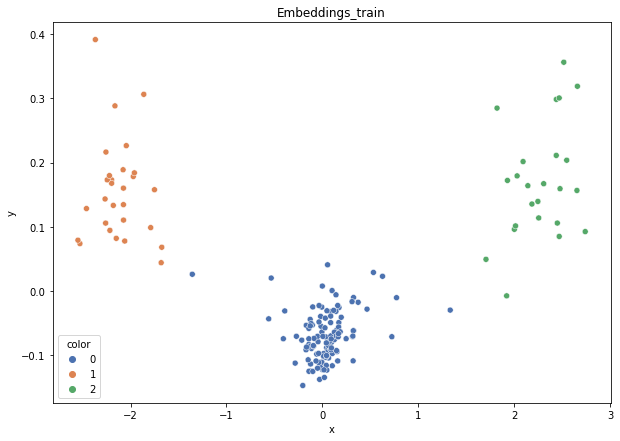

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 1.0
DT-f1-old+new-features: 0.969
DT-f1-old-features: 0.902
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 0.95
DT-gmean-old-features: 0.884
DT-minority_gmean-new-features: 1.0
DT-minority_gmean-old+new-features: 0.095
DT-minority_gmean-old-features: 0.089
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.913
KNN-f1-old-features: 0.941
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.965
KNN-gmean-old-features: 0.977
KNN-minority_gmean-new-features: 1.0
KNN-minority_gmean-old+new-features: 1.0
KNN-minority_gmean-old-features: 1.0
LDA-f1-new-features: 0.941
LDA-f1-old+new-features: 0.913
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.977
LDA-gmean-old+new-features: 0.965
LDA-gmean-old-features: 0.841
LDA-minority_gmean-new-features: 1.0
LDA-minority_gmean-old+new-features: 1.0
LDA-minority_gmean-old-features: 0.084
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.913
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.965
QDA-gmean-old+n

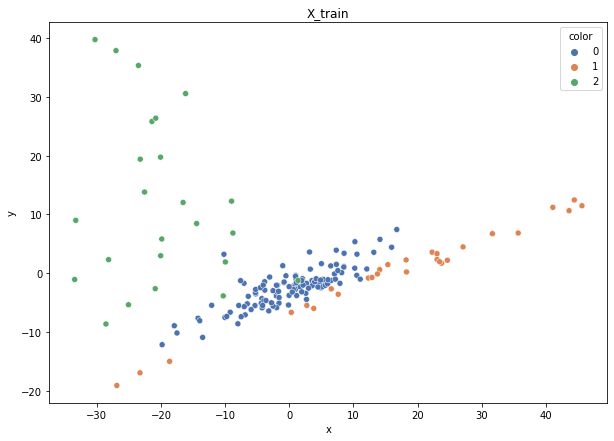

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


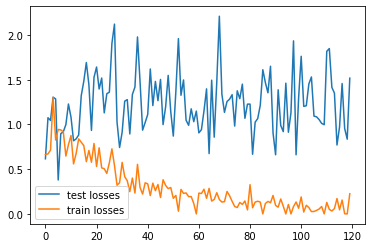

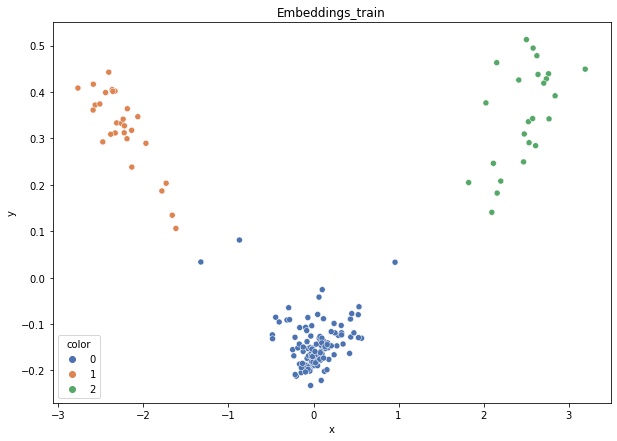

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

DT-f1-new-features: 0.893
DT-f1-old+new-features: 0.893
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.864
DT-gmean-old+new-features: 0.864
DT-gmean-old-features: 0.864
DT-minority_gmean-new-features: 0.087
DT-minority_gmean-old+new-features: 0.087
DT-minority_gmean-old-features: 0.087
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.874
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.794
KNN-minority_gmean-new-features: 0.087
KNN-minority_gmean-old+new-features: 0.087
KNN-minority_gmean-old-features: 0.079
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.721
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.874
LDA-gmean-old-features: 0.598
LDA-minority_gmean-new-features: 0.087
LDA-minority_gmean-old+new-features: 0.087
LDA-minority_gmean-old-features: 0.06
QDA-f1-new-features: 0.893
QDA-f1-old+new-features: 0.893
QDA-f1-old-features: 0.895
QDA-gmean-new-features: 0

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn

In [12]:
result_dict = defaultdict(list)

std_dict = defaultdict(list)

safety_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)
    
    safety_dict["dataset"].append(dataset_name)
    fold_safety_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        X_train_norm, X_test_norm = standardize(X_train, X_test)
        y_train, y_test = y[train_index], y[test_index]
        
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        X_train_enc, X_test_enc = standardize(X_train_enc, X_test_enc)
        
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        s_dict = calc_safety5(embeddings_test, y_test)
        for k, v in s_dict.items():
            fold_safety_dict[f"emb-{k}"].append(v)
            
        s_dict = calc_safety5(X_test_enc, y_test)
        for k,v in s_dict.items():
            fold_safety_dict[f"raw-{k}"].append(v)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train_norm, embeddings_train])
        X_test_new = np.hstack([X_test_norm, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_norm, y_train)
            preds = clf.predict(X_test_norm)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            minority_classes = dt_name_minority_classes[dataset_name]
            minority_mask = np.argwhere([label in minority_classes for label in y_test]).ravel()
            gmean_minority = gmean_score(y_test[minority_mask], preds[minority_mask])
            
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            fold_result_dict[f"{clf_name}-minority_gmean-old-features"].append(gmean_minority)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            minority_mask = np.argwhere([label in minority_classes for label in y_test]).ravel()
            gmean_minority = gmean_score(y_test[minority_mask], preds[minority_mask])
            
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            fold_result_dict[f"{clf_name}-minority_gmean-old+new-features"].append(gmean_minority)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            minority_mask = np.argwhere([label in minority_classes for label in y_test]).ravel()
            gmean_minority = gmean_score(y_test[minority_mask], preds[minority_mask])
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
            fold_result_dict[f"{clf_name}-minority_gmean-new-features"].append(gmean_minority)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))
        
    for k in fold_result_dict:
        std_dict[f"{k}-std"].append(np.std(fold_result_dict[k]))
        
    for k in fold_safety_dict:
        safety_dict[k].append(np.sum(fold_safety_dict[k]) / X.shape[0])

In [13]:
results_df = pd.DataFrame.from_dict(result_dict)

In [14]:
std_df = pd.DataFrame.from_dict(std_dict)

In [15]:
# safety_dict['emb-outlier'].append("None")

In [16]:
safety_df = pd.DataFrame.from_dict(safety_dict)

In [17]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,RF24-minority_gmean-old-features,DT-f1-old-features,DT-gmean-old-features,DT-minority_gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,KNN-minority_gmean-old-features,...,DT-minority_gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features,KNN-minority_gmean-new-features,QDA-f1-new-features,QDA-gmean-new-features,QDA-minority_gmean-new-features,LDA-f1-new-features,LDA-gmean-new-features,LDA-minority_gmean-new-features
0,cmc,0.514118,0.512655,0.007723,0.467266,0.470278,0.007653,0.422592,0.412867,0.006848,...,0.007460,0.454488,0.448392,0.007264,0.522911,0.524824,0.007956,0.531015,0.527084,0.007749
1,dermatology,0.964200,0.962295,1.000000,0.949703,0.951222,1.000000,0.937131,0.932309,1.000000,...,0.805477,0.970399,0.967509,1.000000,0.962262,0.953898,0.805477,0.962665,0.958476,0.805477
2,hayes-roth,0.852497,0.841131,1.000000,0.851208,0.838449,1.000000,0.672362,0.636136,0.014118,...,0.805855,0.885599,0.881207,1.000000,0.880258,0.875183,1.000000,0.880090,0.874467,1.000000
3,new_vehicle,0.957161,0.962521,0.273751,0.896672,0.898498,0.092997,0.912321,0.912341,0.093402,...,0.814262,0.989257,0.989748,0.819204,0.987573,0.988202,0.816918,0.987534,0.987263,0.638880
4,new_yeast,0.562953,0.338100,0.020309,0.442388,0.282887,0.017781,0.486925,0.408416,0.026117,...,0.016265,0.496589,0.405181,0.024690,0.512781,0.328276,0.019048,0.535517,0.377355,0.024590
5,1czysty-cut,0.934189,0.938694,0.095093,0.935490,0.936512,0.094798,0.945528,0.943824,0.095391,...,0.096824,0.974067,0.964446,0.096680,0.967116,0.984937,0.639578,0.963580,0.973168,0.278157
6,2delikatne-cut,0.761136,0.756883,0.078286,0.724198,0.737376,0.077039,0.699865,0.678350,0.070180,...,0.079608,0.751419,0.735317,0.075534,0.719172,0.809635,0.403934,0.790944,0.818356,0.084704
7,3mocniej-cut,0.560931,0.519703,0.055067,0.504810,0.502048,0.055608,0.508642,0.457700,0.048806,...,0.060585,0.572499,0.541338,0.057452,0.622797,0.619300,0.066343,0.639228,0.621354,0.065181
8,4delikatne-bezover-cut,0.820201,0.835313,0.086964,0.796105,0.813035,0.085097,0.767612,0.760887,0.079412,...,0.085734,0.817496,0.811216,0.083692,0.825676,0.891959,0.094667,0.846908,0.888374,0.092926
9,balance-scale,0.593905,0.092184,0.001000,0.605016,0.416495,0.004768,0.560676,0.089082,0.001000,...,0.214088,0.954253,0.935526,0.606940,0.949899,0.928967,0.219650,0.971780,0.965741,0.611963


In [18]:
safety_df[sorted(safety_df.filter(regex=("dataset|emb")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-borderline,emb-outlier,emb-rare,emb-safe
0,cmc,0.455533,0.114732,0.217244,0.212492
1,dermatology,0.095628,0.016393,0.010929,0.877049
2,hayes-roth,0.106250,0.037500,0.081250,0.775000
3,new_vehicle,0.013002,0.000000,0.004728,0.982270
4,new_yeast,0.391509,0.167116,0.176550,0.264825
5,1czysty-cut,0.026667,0.001667,0.007500,0.964167
6,2delikatne-cut,0.150833,0.025833,0.050833,0.772500
7,3mocniej-cut,0.240000,0.078333,0.065000,0.616667
8,4delikatne-bezover-cut,0.140833,0.010000,0.041667,0.807500
9,balance-scale,0.038400,0.004800,0.017600,0.939200


In [19]:
safety_df[sorted(safety_df.filter(regex=("dataset|raw")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,raw-borderline,raw-outlier,raw-rare,raw-safe
0,cmc,0.505771,0.118126,0.262050,0.114053
1,dermatology,0.464481,0.060109,0.144809,0.330601
2,hayes-roth,0.687500,0.031250,0.131250,0.150000
3,new_vehicle,0.255319,0.020095,0.053191,0.671395
4,new_yeast,0.415768,0.164420,0.174528,0.245283
5,1czysty-cut,0.131667,0.003333,0.015000,0.850000
6,2delikatne-cut,0.209167,0.010000,0.060833,0.720000
7,3mocniej-cut,0.232500,0.062500,0.079167,0.625833
8,4delikatne-bezover-cut,0.185833,0.010833,0.040833,0.762500
9,balance-scale,0.508800,0.064000,0.116800,0.310400


In [20]:
safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-safe,raw-safe
0,cmc,0.212492,0.114053
1,dermatology,0.877049,0.330601
2,hayes-roth,0.775000,0.150000
3,new_vehicle,0.982270,0.671395
4,new_yeast,0.264825,0.245283
5,1czysty-cut,0.964167,0.850000
6,2delikatne-cut,0.772500,0.720000
7,3mocniej-cut,0.616667,0.625833
8,4delikatne-bezover-cut,0.807500,0.762500
9,balance-scale,0.939200,0.310400


In [21]:
from IPython.display import display
for clf in instantiate_classifiers().keys():
    print(clf)
    display(results_df.filter(regex=(f"dataset|{clf}-f1*")).style.highlight_max(color = 'lightgreen', axis = 1))
    display(results_df.filter(regex=(f"dataset|{clf}-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1))
    display(results_df.filter(regex=(f"dataset|{clf}-minority_gmean*")).style.highlight_max(color = 'lightgreen', axis = 1))

RF24


,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.514118,0.501484,0.491910
1,dermatology,0.964200,0.963993,0.961309
2,hayes-roth,0.852497,0.875077,0.869986
3,new_vehicle,0.957161,0.988752,0.987121
4,new_yeast,0.562953,0.537039,0.532598
5,1czysty-cut,0.934189,0.972545,0.970582
6,2delikatne-cut,0.761136,0.774737,0.765999
7,3mocniej-cut,0.560931,0.580192,0.594008
8,4delikatne-bezover-cut,0.820201,0.817102,0.820905
9,balance-scale,0.593905,0.932124,0.941061


,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.512655,0.496580,0.487155
1,dermatology,0.962295,0.956939,0.954656
2,hayes-roth,0.841131,0.869303,0.863883
3,new_vehicle,0.962521,0.988050,0.986358
4,new_yeast,0.338100,0.287378,0.282443
5,1czysty-cut,0.938694,0.965115,0.961840
6,2delikatne-cut,0.756883,0.774218,0.765124
7,3mocniej-cut,0.519703,0.525034,0.533690
8,4delikatne-bezover-cut,0.835313,0.826181,0.825777
9,balance-scale,0.092184,0.902195,0.916777


,dataset,RF24-minority_gmean-old-features,RF24-minority_gmean-old+new-features,RF24-minority_gmean-new-features
0,cmc,0.007723,0.007480,0.007466
1,dermatology,1.000000,0.805477,0.805477
2,hayes-roth,1.000000,1.000000,1.000000
3,new_vehicle,0.273751,0.638880,0.638710
4,new_yeast,0.020309,0.016328,0.016068
5,1czysty-cut,0.095093,0.096824,0.096495
6,2delikatne-cut,0.078286,0.079810,0.078802
7,3mocniej-cut,0.055067,0.054785,0.055411
8,4delikatne-bezover-cut,0.086964,0.085978,0.085666
9,balance-scale,0.001000,0.214716,0.408796


DT


,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467266,0.463128,0.464194
1,dermatology,0.949703,0.944245,0.936893
2,hayes-roth,0.851208,0.850965,0.854035
3,new_vehicle,0.896672,0.983534,0.985053
4,new_yeast,0.442388,0.437240,0.446211
5,1czysty-cut,0.935490,0.974969,0.971049
6,2delikatne-cut,0.724198,0.739575,0.775219
7,3mocniej-cut,0.504810,0.532544,0.555548
8,4delikatne-bezover-cut,0.796105,0.822589,0.823044
9,balance-scale,0.605016,0.906575,0.925317


,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470278,0.464140,0.463138
1,dermatology,0.951222,0.944304,0.934027
2,hayes-roth,0.838449,0.842338,0.847951
3,new_vehicle,0.898498,0.979978,0.983947
4,new_yeast,0.282887,0.231660,0.264834
5,1czysty-cut,0.936512,0.965912,0.964697
6,2delikatne-cut,0.737376,0.740223,0.774452
7,3mocniej-cut,0.502048,0.531656,0.555668
8,4delikatne-bezover-cut,0.813035,0.833585,0.827727
9,balance-scale,0.416495,0.893176,0.892589


,dataset,DT-minority_gmean-old-features,DT-minority_gmean-old+new-features,DT-minority_gmean-new-features
0,cmc,0.007653,0.007606,0.007460
1,dermatology,1.000000,1.000000,0.805477
2,hayes-roth,1.000000,0.611629,0.805855
3,new_vehicle,0.092997,0.458075,0.814262
4,new_yeast,0.017781,0.014169,0.016265
5,1czysty-cut,0.094798,0.096824,0.096824
6,2delikatne-cut,0.077039,0.076407,0.079608
7,3mocniej-cut,0.055608,0.058111,0.060585
8,4delikatne-bezover-cut,0.085097,0.086540,0.085734
9,balance-scale,0.004768,0.218231,0.214088


KNN


,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.422592,0.425826,0.454488
1,dermatology,0.937131,0.967133,0.970399
2,hayes-roth,0.672362,0.869679,0.885599
3,new_vehicle,0.912321,0.985179,0.989257
4,new_yeast,0.486925,0.509999,0.496589
5,1czysty-cut,0.945528,0.966683,0.974067
6,2delikatne-cut,0.699865,0.739139,0.751419
7,3mocniej-cut,0.508642,0.509487,0.572499
8,4delikatne-bezover-cut,0.767612,0.798139,0.817496
9,balance-scale,0.560676,0.959479,0.954253


,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.412867,0.416922,0.448392
1,dermatology,0.932309,0.965322,0.967509
2,hayes-roth,0.636136,0.863266,0.881207
3,new_vehicle,0.912341,0.985732,0.989748
4,new_yeast,0.408416,0.420591,0.405181
5,1czysty-cut,0.943824,0.956967,0.964446
6,2delikatne-cut,0.678350,0.729426,0.735317
7,3mocniej-cut,0.457700,0.467362,0.541338
8,4delikatne-bezover-cut,0.760887,0.787170,0.811216
9,balance-scale,0.089082,0.944638,0.935526


,dataset,KNN-minority_gmean-old-features,KNN-minority_gmean-old+new-features,KNN-minority_gmean-new-features
0,cmc,0.006848,0.006971,0.007264
1,dermatology,1.000000,1.000000,1.000000
2,hayes-roth,0.014118,1.000000,1.000000
3,new_vehicle,0.093402,0.638880,0.819204
4,new_yeast,0.026117,0.027045,0.024690
5,1czysty-cut,0.095391,0.276053,0.096680
6,2delikatne-cut,0.070180,0.075154,0.075534
7,3mocniej-cut,0.048806,0.050035,0.057452
8,4delikatne-bezover-cut,0.079412,0.081500,0.083692
9,balance-scale,0.001000,0.417235,0.606940


QDA


,dataset,QDA-f1-old-features,QDA-f1-old+new-features,QDA-f1-new-features
0,cmc,0.508046,0.511181,0.522911
1,dermatology,0.777500,0.849213,0.962262
2,hayes-roth,0.637542,0.880258,0.880258
3,new_vehicle,0.969460,0.990351,0.987573
4,new_yeast,0.151335,0.333389,0.512781
5,1czysty-cut,0.814045,0.965173,0.967116
6,2delikatne-cut,0.658847,0.698827,0.719172
7,3mocniej-cut,0.274510,0.625721,0.622797
8,4delikatne-bezover-cut,0.793653,0.828379,0.825676
9,balance-scale,0.857046,0.945831,0.949899


,dataset,QDA-gmean-old-features,QDA-gmean-old+new-features,QDA-gmean-new-features
0,cmc,0.519498,0.517863,0.524824
1,dermatology,0.747057,0.840243,0.953898
2,hayes-roth,0.633175,0.875183,0.875183
3,new_vehicle,0.973731,0.990517,0.988202
4,new_yeast,0.045770,0.155969,0.328276
5,1czysty-cut,0.716022,0.977673,0.984937
6,2delikatne-cut,0.514531,0.796933,0.809635
7,3mocniej-cut,0.010000,0.644789,0.619300
8,4delikatne-bezover-cut,0.717321,0.893498,0.891959
9,balance-scale,0.916265,0.922185,0.928967


,dataset,QDA-minority_gmean-old-features,QDA-minority_gmean-old+new-features,QDA-minority_gmean-new-features
0,cmc,0.008377,0.008344,0.007956
1,dermatology,0.414117,0.414117,0.805477
2,hayes-roth,0.412607,1.000000,1.000000
3,new_vehicle,0.452065,0.817073,0.816918
4,new_yeast,0.009836,0.021931,0.019048
5,1czysty-cut,0.071752,0.638727,0.639578
6,2delikatne-cut,0.051453,0.561403,0.403934
7,3mocniej-cut,0.001000,0.070066,0.066343
8,4delikatne-bezover-cut,0.072628,0.094698,0.094667
9,balance-scale,0.413819,0.025650,0.219650


LDA


,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.522661,0.531015
1,dermatology,0.958265,0.961736,0.962665
2,hayes-roth,0.559310,0.885364,0.880090
3,new_vehicle,0.939198,0.986265,0.987534
4,new_yeast,0.531617,0.543719,0.535517
5,1czysty-cut,0.264241,0.963580,0.963580
6,2delikatne-cut,0.273738,0.785331,0.790944
7,3mocniej-cut,0.274510,0.629732,0.639228
8,4delikatne-bezover-cut,0.268589,0.845931,0.846908
9,balance-scale,0.607652,0.967311,0.971780


,dataset,LDA-gmean-old-features,LDA-gmean-old+new-features,LDA-gmean-new-features
0,cmc,0.468850,0.518150,0.527084
1,dermatology,0.957095,0.958476,0.958476
2,hayes-roth,0.526678,0.880449,0.874467
3,new_vehicle,0.944372,0.985522,0.987263
4,new_yeast,0.283300,0.331310,0.377355
5,1czysty-cut,0.014473,0.973168,0.973168
6,2delikatne-cut,0.009984,0.811134,0.818356
7,3mocniej-cut,0.010000,0.611633,0.621354
8,4delikatne-bezover-cut,0.023236,0.886026,0.888374
9,balance-scale,0.096584,0.958349,0.965741


,dataset,LDA-minority_gmean-old-features,LDA-minority_gmean-old+new-features,LDA-minority_gmean-new-features
0,cmc,0.007035,0.007668,0.007749
1,dermatology,1.000000,0.805477,0.805477
2,hayes-roth,0.219934,1.000000,1.000000
3,new_vehicle,0.096751,0.638706,0.638880
4,new_yeast,0.019280,0.020456,0.024590
5,1czysty-cut,0.001493,0.278157,0.278157
6,2delikatne-cut,0.001000,0.084038,0.084704
7,3mocniej-cut,0.001000,0.064308,0.065181
8,4delikatne-bezover-cut,0.002401,0.092643,0.092926
9,balance-scale,0.001000,0.607819,0.611963


In [22]:
for clf in instantiate_classifiers().keys():
    print(clf)
    display(std_df.filter(regex=(f"dataset|{clf}-f1*")))
    display(std_df.filter(regex=(f"dataset|{clf}-gmean*")))
    display(std_df.filter(regex=(f"dataset|{clf}-minority_gmean*")))

RF24


,RF24-f1-old-features-std,RF24-f1-old+new-features-std,RF24-f1-new-features-std
0,0.004596,0.018362,0.027538
1,0.030882,0.023399,0.026788
2,0.069997,0.052496,0.053803
3,0.020488,0.016313,0.019413
4,0.028479,0.048211,0.050799
5,0.017547,0.014513,0.018015
6,0.025108,0.017167,0.023574
7,0.045195,0.067905,0.059336
8,0.012441,0.016496,0.011860
9,0.007425,0.027552,0.029167


,RF24-gmean-old-features-std,RF24-gmean-old+new-features-std,RF24-gmean-new-features-std
0,0.008910,0.020799,0.026443
1,0.032423,0.029454,0.031784
2,0.078118,0.056257,0.057544
3,0.017658,0.017003,0.020189
4,0.070645,0.024882,0.023861
5,0.018670,0.026597,0.032662
6,0.024962,0.017235,0.021551
7,0.069296,0.088013,0.076823
8,0.035284,0.032148,0.027305
9,0.001014,0.046576,0.049565


,RF24-minority_gmean-old-features-std,RF24-minority_gmean-old+new-features-std,RF24-minority_gmean-new-features-std
0,0.000262,0.000273,0.000209
1,0.000000,0.389046,0.389046
2,0.000000,0.000000,0.000000
3,0.351630,0.442281,0.442489
4,0.004158,0.001114,0.001145
5,0.001746,0.002761,0.003363
6,0.002357,0.001880,0.002166
7,0.007307,0.008873,0.007526
8,0.004072,0.003763,0.003275
9,0.000000,0.392737,0.482754


DT


,DT-f1-old-features-std,DT-f1-old+new-features-std,DT-f1-new-features-std
0,0.016478,0.019639,0.017319
1,0.024271,0.016751,0.013860
2,0.069800,0.042803,0.059538
3,0.011817,0.017129,0.017169
4,0.029429,0.040084,0.040982
5,0.023140,0.015621,0.013462
6,0.025940,0.042705,0.030382
7,0.039660,0.033063,0.033098
8,0.020930,0.011344,0.019840
9,0.034763,0.047933,0.029434


,DT-gmean-old-features-std,DT-gmean-old+new-features-std,DT-gmean-new-features-std
0,0.021778,0.022279,0.017959
1,0.025922,0.017918,0.019860
2,0.082862,0.044994,0.064100
3,0.015563,0.020893,0.021244
4,0.060262,0.030496,0.043863
5,0.028834,0.027235,0.025792
6,0.040369,0.057494,0.047833
7,0.043776,0.033770,0.039834
8,0.034222,0.020885,0.024556
9,0.184093,0.048353,0.045809


,DT-minority_gmean-old-features-std,DT-minority_gmean-old+new-features-std,DT-minority_gmean-new-features-std
0,0.000453,0.000421,0.000294
1,0.000000,0.000000,0.389046
2,0.000000,0.475656,0.388289
3,0.001749,0.442482,0.360090
4,0.004209,0.001905,0.002547
5,0.002933,0.002761,0.002761
6,0.004387,0.005936,0.005179
7,0.004180,0.003295,0.004210
8,0.003902,0.002431,0.002484
9,0.002080,0.390953,0.393030


KNN


,KNN-f1-old-features-std,KNN-f1-old+new-features-std,KNN-f1-new-features-std
0,0.012989,0.009356,0.007596
1,0.016078,0.015386,0.025996
2,0.101115,0.045960,0.037482
3,0.020449,0.017032,0.018593
4,0.034694,0.039627,0.039947
5,0.010506,0.011851,0.013389
6,0.031151,0.014535,0.028986
7,0.036543,0.020424,0.065325
8,0.012673,0.021147,0.015316
9,0.008354,0.018899,0.035404


,KNN-gmean-old-features-std,KNN-gmean-old+new-features-std,KNN-gmean-new-features-std
0,0.014765,0.013887,0.010925
1,0.021251,0.014342,0.027604
2,0.101883,0.050013,0.040142
3,0.015959,0.017403,0.018599
4,0.078836,0.080339,0.088921
5,0.010421,0.026571,0.025514
6,0.046579,0.017577,0.029753
7,0.044226,0.023641,0.093101
8,0.017998,0.028151,0.026223
9,0.000847,0.032273,0.057870


,KNN-minority_gmean-old-features-std,KNN-minority_gmean-old+new-features-std,KNN-minority_gmean-new-features-std
0,0.000111,0.000173,0.000228
1,0.000000,0.000000,0.000000
2,0.008222,0.000000,0.000000
3,0.000870,0.442281,0.361593
4,0.002379,0.002557,0.005160
5,0.001613,0.361980,0.002683
6,0.004977,0.001760,0.002998
7,0.004482,0.002535,0.009720
8,0.001978,0.002897,0.002681
9,0.000000,0.475826,0.481428


QDA


,QDA-f1-old-features-std,QDA-f1-old+new-features-std,QDA-f1-new-features-std
0,0.021527,0.022544,0.017547
1,0.074257,0.067357,0.031004
2,0.069927,0.050677,0.050677
3,0.020810,0.012647,0.015637
4,0.060839,0.022693,0.035834
5,0.048512,0.015995,0.016212
6,0.030676,0.038309,0.029587
7,0.000000,0.028873,0.024436
8,0.053940,0.027933,0.023583
9,0.042744,0.024031,0.027883


,QDA-gmean-old-features-std,QDA-gmean-old+new-features-std,QDA-gmean-new-features-std
0,0.023431,0.024020,0.021048
1,0.105453,0.091452,0.038097
2,0.077236,0.054988,0.054988
3,0.016885,0.013483,0.016426
4,0.018178,0.023561,0.129288
5,0.073988,0.013448,0.005592
6,0.044352,0.020816,0.027685
7,0.000000,0.047643,0.040608
8,0.081399,0.031232,0.032070
9,0.034618,0.042351,0.048338


,QDA-minority_gmean-old-features-std,QDA-minority_gmean-old+new-features-std,QDA-minority_gmean-new-features-std
0,0.000361,0.000230,0.000384
1,0.478390,0.478390,0.389046
2,0.479659,0.000000,0.000000
3,0.433363,0.360167,0.360477
4,0.005347,0.006900,0.007688
5,0.007487,0.442467,0.441425
6,0.004435,0.390946,0.390291
7,0.000000,0.004772,0.004209
8,0.008165,0.003275,0.003525
9,0.478674,0.008608,0.390264


LDA


,LDA-f1-old-features-std,LDA-f1-old+new-features-std,LDA-f1-new-features-std
0,0.026147,0.002577,0.010447
1,0.023570,0.032506,0.031423
2,0.063147,0.053365,0.055715
3,0.019609,0.015993,0.015642
4,0.031734,0.034026,0.040356
5,0.008375,0.018314,0.018314
6,0.000723,0.011619,0.012186
7,0.000000,0.036293,0.043838
8,0.005061,0.027163,0.028565
9,0.008833,0.012231,0.009374


,LDA-gmean-old-features-std,LDA-gmean-old+new-features-std,LDA-gmean-new-features-std
0,0.029413,0.007089,0.013767
1,0.027360,0.033706,0.033706
2,0.072452,0.057785,0.060395
3,0.015057,0.017231,0.016515
4,0.020058,0.076765,0.100586
5,0.009529,0.016095,0.016095
6,0.000015,0.028344,0.025426
7,0.000000,0.046333,0.055064
8,0.006723,0.034299,0.034500
9,0.000889,0.023186,0.015259


,LDA-minority_gmean-old-features-std,LDA-minority_gmean-old+new-features-std,LDA-minority_gmean-new-features-std
0,0.000364,0.000320,0.000341
1,0.000000,0.389046,0.389046
2,0.390049,0.000000,0.000000
3,0.000731,0.442494,0.442281
4,0.003690,0.004468,0.010202
5,0.000987,0.360926,0.360926
6,0.000000,0.003431,0.003013
7,0.000000,0.004493,0.005419
8,0.000701,0.003538,0.003431
9,0.000000,0.480365,0.475247
